In [2]:
# Importamos las librerias necesarias
from Busquedas import *
import datetime
import pymongo
from pymongo import MongoClient
import urllib
import json
import pandas as pd
import math
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import os
import plotly.graph_objs as go
pd.set_option('display.max_colwidth', None)
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# 1. Descarga de Datos

## 1.1 Conexion y descarga de datos desde Instancia de BBDD NoSQL MongoDB

In [3]:
# Autentificacion
def auth_mongo(username, password, database):
    
    # Conexion con BD NoSQL MongoDB - Creacion de BD y Colección

    username_url = urllib.parse.quote_plus(username)
    password_url = urllib.parse.quote_plus(password)

    # Fuera de GCP - Direccion Ip Externa
    # # XXXX - # Por motivos de seguridad se eliminaron estas direcciones / claves / puertos
    # Dentro de GCP - Direccion Ip Interna
    # # XXXX - # Por motivos de seguridad se eliminaron estas direcciones / claves / puertos
    url = 'mongodb://%s:%s@XXXX:XXXX/'+database # XXXX - # Por motivos de seguridad se eliminaron estas direcciones / claves / puertos
    try: 
        client = MongoClient(url % (username_url, password_url))
        print("Conectado satisfactoriamente!!!") 
    except:   
        print("No se logro conectar a MongoDB")
    return client

# Extraer datos de mongo
def extract_mongo(client, database, collection_name):
    
    try:
        db = client[database]
        collection = db[collection_name]
        info = collection.find()
        df = pd.DataFrame(list(info))
        df.drop_duplicates('id_post', inplace=True)
        df['reactions_count'] = df['reactions_count'].astype(int)
        df['date'] = df['date'].astype('datetime64[ns]')
        print("Los datos de la coleccion %s de la base de datos %s fueron extraidos satisfactoriamente!" %(collection_name, database))
    
    except:
        print("Los datos de la coleccion %s de la base de datos %s NO fueron extraidos" %(collection_name, database))
    
    return df

# Insertar un dataframe en mongo
def insert_mongo (client, database, collection_name, df):
    
    try:
        db = client[database]
        collection = db[collection_name]
        data_dict = df.to_dict("records")
        collection.insert_many(data_dict)
        print("Los datos fueron insertados correctamente en la coleccion %s, de la base de datos %s." %(collection_name, database))
    
    except:
        print("Los datos NO fueron insertados en la coleccion %s, de la base de datos %s." %(collection_name, database))
    

In [4]:
# Definicion de parametros de descarga
database = 'GNN'
client = auth_mongo('XXXX', 'XXXX', database)    # XXXX - # Por motivos de seguridad se eliminaron estas direcciones / claves / puertos
clave = 'fvf'

Conectado satisfactoriamente!!!


---
---
## Premium v1.1: 30-Days
---
---

In [11]:
# Convertir datos almacenados en MongoDB en un dataframe
# df_30days = extract_mongo(client, database, collection_name)
df_30days = extract_mongo(client, database, 't_fvf_busqueda')
df_30days.shape

Los datos de la coleccion t_fvf_busqueda de la base de datos GNN fueron extraidos satisfactoriamente!


(7848, 115)

In [5]:
list(df_30days.columns)

['_id',
 'created_at',
 'id_post',
 'id_str',
 'message',
 'source',
 'truncated',
 'in_reply_to_status_id',
 'in_reply_to_status_id_str',
 'in_reply_to_user_id',
 'in_reply_to_user_id_str',
 'in_reply_to_screen_name',
 'user',
 'geo',
 'coordinates',
 'place',
 'contributors',
 'is_quote_status',
 'extended_tweet',
 'quote_count',
 'comments_count',
 'retweet_count',
 'likes_count',
 'entities',
 'favorited',
 'retweeted',
 'possibly_sensitive',
 'edit_history',
 'edit_controls',
 'editable',
 'filter_level',
 'lang',
 'matching_rules',
 'retweeted_status',
 'display_text_range',
 'quoted_status_id',
 'quoted_status_id_str',
 'quoted_status',
 'quoted_status_permalink',
 'extended_entities',
 'Fecha_completa',
 'date',
 'hour',
 'reactions_count',
 'id_user',
 'id_str_user',
 'name',
 'username',
 'location',
 'url_user',
 'description',
 'translator_type',
 'protected',
 'verified',
 'verified_type',
 'followers',
 'followings',
 'listed_count',
 'favourites_count',
 'statuses_count'

In [6]:
# Imprimimos informacion sobre el DataFrame
df_30days.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7848 entries, 0 to 7947
Columns: 115 entries, _id to attributes
dtypes: bool(14), datetime64[ns](3), float64(3), int64(13), object(82)
memory usage: 6.2+ MB


In [7]:
# Observemos las primeras filas del DataFrame
df_30days.head()

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,category,id_place,url_place,place_type,name_place,full_name,country_code,country,bounding_box,attributes
0,6442ae573c00c6c014a47988,2023-04-20 23:58:40,1649200946419826688,1649200946419826688,Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW,Twitter for Android,True,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6442ae573c00c6c014a47989,2023-04-20 23:57:49,1649200732233424896,1649200732233424896,"rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....",Twitter for Android,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6442ae573c00c6c014a4798a,2023-04-20 23:56:18,1649200347645194243,1649200347645194243,"Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA",Twitter for Android,True,1.649200e+18,1649200340187619328,1.454169e+18,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6442ae573c00c6c014a4798b,2023-04-20 23:55:48,1649200224773046277,1649200224773046277,"rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y Juán Pabón🇻🇪(PA), además el control de Sub-20 y Sub-23. #Caracas #CaracasFC #Venezuela #LaVintinto 👇 https://t.co/G5szqpgxWu",Twitter Web App,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6442ae573c00c6c014a4798c,2023-04-20 23:54:56,1649200005834522626,1649200005834522626,rt @LaDivinaDiva La FVF es un dinosaurio echado encima de nuestros futbolistas.,Twitter for Android,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df_30days[['entities', 'extended_entities']][:10]

,entities,extended_entities
0,"{'hashtags': [], 'urls': [{'url': 'https://t.co/HPvhz3PzVP', 'expanded_url': 'https://twitter.com/i/web/status/1649200946419826688', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}], 'user_mentions': [], 'symbols': []}",NaN
1,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'klon_perez', 'name': 'Klon Pérez', 'id': 221829871, 'id_str': '221829871', 'indices': [3, 14]}], 'symbols': []}",NaN
2,"{'hashtags': [], 'urls': [{'url': 'https://t.co/H6wKCqfmYZ', 'expanded_url': 'https://twitter.com/i/web/status/1649200347645194243', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}], 'user_mentions': [], 'symbols': []}",NaN
3,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'CaracasFC1967', 'name': 'Caracas 1967 🔴', 'id': 1475517342759198723, 'id_str': '1475517342759198723', 'indices': [3, 17]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [33, 45]}], 'symbols': []}",NaN
4,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'luistorres167', 'name': 'Luis A. Torres', 'id': 497538063, 'id_str': '497538063', 'indices': [3, 17]}, {'screen_name': 'LaDivinaDiva', 'name': 'La Divina Diva', 'id': 49482270, 'id_str': '49482270', 'indices': [19, 32]}], 'symbols': []}",NaN
5,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'SOLOVENEX_', 'name': 'SOLOVENEX', 'id': 700738736737243138, 'id_str': '700738736737243138', 'indices': [3, 14]}, {'screen_name': 'juvenilesfvf', 'name': 'Juveniles Vinotinto', 'id': 3598733600, 'id_str': '3598733600', 'indices': [103, 116]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [119, 131]}], 'symbols': []}",NaN
6,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'dosisdepor710', 'name': 'Dosis Deportiva', 'id': 2543962176, 'id_str': '2543962176', 'indices': [3, 17]}, {'screen_name': 'SeleVinotinto', 'name': 'La Vinotinto', 'id': 2577349345, 'id_str': '2577349345', 'indices': [69, 83]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [84, 96]}, {'screen_name': 'LigaFUTVE', 'name': 'Liga FUTVE', 'id': 3242137713, 'id_str': '3242137713', 'indices': [97, 107]}, {'screen_name': 'LigaFUTVE2', 'name': 'Liga FUTVE 2', 'id': 962066728149635072, 'id_str': '962066728149635072', 'indices': [108, 119]}], 'symbols': []}",NaN
7,"{'hashtags': [{'text': 'EnVideo', 'indices': [15, 23]}], 'urls': [], 'user_mentions': [{'screen_name': 'VTVcanal8', 'name': 'VTV CANAL 8', 'id': 118864905, 'id_str': '118864905', 'indices': [3, 13]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [38, 50]}], 'symbols': []}",NaN
8,"{'hashtags': [{'text': 'FVF', 'indices': [98, 102]}], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [3, 15]}, {'screen_name': 'jandresgimenez', 'name': 'Jorge Gimenez', 'id': 113976897, 'id_str': '113976897', 'indices': [120, 135]}], 'symbols': []}",NaN
9,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'luistorres167', 'name': 'Luis A. Torres', 'id': 497538063, 'id_str': '497538063', 'indices': [3, 17]}, {'screen_name': 'LaDivinaDiva', 'name': 'La Divina Diva', 'id': 49482270, 'id_str': '49482270', 'indices': [19, 32]}], 'symbols': []}",NaN


In [9]:
df_30days.shape[0]

7848

In [10]:
df_30days[['extended_entities']].isna().sum()

extended_entities    7559
dtype: int64

In [11]:
df_30days[['extended_entities']].isna().sum()

extended_entities    7559
dtype: int64

In [12]:
df_30days[~(df_30days['extended_entities'].isna())][['entities', 'extended_entities']]

,entities,extended_entities
46,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'klon_perez', 'name': 'Klon Pérez', 'id': 221829871, 'id_str': '221829871', 'indices': [0, 11]}], 'symbols': [], 'media': [{'id': 1649185527940218882, 'id_str': '1649185527940218882', 'indices': [56, 79], 'media_url': 'http://pbs.twimg.com/media/FuMVf_mXgAIbPfg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FuMVf_mXgAIbPfg.jpg', 'url': 'https://t.co/zjIWK37XjI', 'display_url': 'pic.twitter.com/zjIWK37XjI', 'expanded_url': 'https://twitter.com/alfonzo_38825/status/1649185531857600512/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 667, 'h': 680, 'resize': 'fit'}, 'large': {'w': 750, 'h': 765, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 765, 'resize': 'fit'}}}]}","{'media': [{'id': 1649185527940218882, 'id_str': '1649185527940218882', 'indices': [56, 79], 'media_url': 'http://pbs.twimg.com/media/FuMVf_mXgAIbPfg.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FuMVf_mXgAIbPfg.jpg', 'url': 'https://t.co/zjIWK37XjI', 'display_url': 'pic.twitter.com/zjIWK37XjI', 'expanded_url': 'https://twitter.com/alfonzo_38825/status/1649185531857600512/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 667, 'h': 680, 'resize': 'fit'}, 'large': {'w': 750, 'h': 765, 'resize': 'fit'}, 'medium': {'w': 750, 'h': 765, 'resize': 'fit'}}}]}"
229,"{'hashtags': [{'text': 'Vinotintosub17', 'indices': [49, 64]}, {'text': 'Vinotinto', 'indices': [65, 75]}], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [76, 88]}, {'screen_name': 'juvenilesfvf', 'name': 'Juveniles Vinotinto', 'id': 3598733600, 'id_str': '3598733600', 'indices': [90, 103]}], 'symbols': [], 'media': [{'id': 1649172164958998528, 'id_str': '1649172164958998528', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/FuMJWKnX0AAFTN5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FuMJWKnX0AAFTN5.jpg', 'url': 'https://t.co/EiLupkd8ET', 'display_url': 'pic.twitter.com/EiLupkd8ET', 'expanded_url': 'https://twitter.com/JAntonioQ_/status/1649172170436669440/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1276, 'h': 1427, 'resize': 'fit'}, 'small': {'w': 608, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1073, 'h': 1200, 'resize': 'fit'}}}]}","{'media': [{'id': 1649172164958998528, 'id_str': '1649172164958998528', 'indices': [104, 127], 'media_url': 'http://pbs.twimg.com/media/FuMJWKnX0AAFTN5.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FuMJWKnX0AAFTN5.jpg', 'url': 'https://t.co/EiLupkd8ET', 'display_url': 'pic.twitter.com/EiLupkd8ET', 'expanded_url': 'https://twitter.com/JAntonioQ_/status/1649172170436669440/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'large': {'w': 1276, 'h': 1427, 'resize': 'fit'}, 'small': {'w': 608, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1073, 'h': 1200, 'resize': 'fit'}}}]}"
243,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [45, 57]}], 'symbols': [], 'media': [{'id': 1649170464328019970, 'id_str': '1649170464328019970', 'indices': [58, 81], 'media_url': 'http://pbs.twimg.com/media/FuMHzLRWcAIe7qV.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FuMHzLRWcAIe7qV.jpg', 'url': 'https://t.co/q1g8LD6Fsg', 'display_url': 'pic.twitter.com/q1g8LD6Fsg', 'expanded_url': 'https://twitter.com/luisequint/status/1649170467964559363/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 531, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 902, 'h': 1156, 'resize': 'fit'}, 'large': {'w': 902, 'h': 1156, 'resize': 'fit'}}}]}","{'media': [{'id': 1649170464328019970, 'id_str': '1649170464328019970', 'indices': [58, 81], 'media_url': 'http://pbs.twimg.co

---
---
## Premium v1.1: Full Archive
---
---

In [12]:
# Convertir datos almacenados en MongoDB en un dataframe
# df1 = extract_mongo(client, database, collection_name)
df_full_archive = extract_mongo(client, database, 't_fvf_tag')
df_full_archive.shape

Los datos de la coleccion t_fvf_tag de la base de datos GNN NO fueron extraidos


(4100, 42)

In [14]:
# Columnas procesadas luego de la obtencion de datos de la API Full-Archive
df_full_archive.columns

Index(['_id', 'created_at', 'id', 'id_str', 'text', 'source', 'truncated',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'retweeted_status', 'is_quote_status', 'quote_count',
       'reply_count', 'retweet_count', 'favorite_count', 'entities',
       'favorited', 'retweeted', 'edit_history', 'edit_controls', 'editable',
       'filter_level', 'lang', 'matching_rules', 'possibly_sensitive',
       'display_text_range', 'extended_tweet', 'extended_entities',
       'quoted_status_id', 'quoted_status_id_str', 'quoted_status',
       'quoted_status_permalink', 'word', 'category'],
      dtype='object')

In [15]:
# Imprimimos informacion sobre el DataFrame
df_full_archive.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4100 entries, 0 to 4099
Data columns (total 42 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   _id                        4100 non-null   object 
 1   created_at                 4100 non-null   object 
 2   id                         4100 non-null   int64  
 3   id_str                     4100 non-null   object 
 4   text                       4100 non-null   object 
 5   source                     4100 non-null   object 
 6   truncated                  4100 non-null   bool   
 7   in_reply_to_status_id      899 non-null    float64
 8   in_reply_to_status_id_str  899 non-null    object 
 9   in_reply_to_user_id        934 non-null    float64
 10  in_reply_to_user_id_str    934 non-null    object 
 11  in_reply_to_screen_name    932 non-null    object 
 12  user                       4100 non-null   object 
 13  geo                        0 non-null      objec

In [16]:
# Observemos las primeras filas del DataFrame
df_full_archive.head()

,_id,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,possibly_sensitive,display_text_range,extended_tweet,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,word,category
0,6441a2d13c00c6c014a4697d,Tue Feb 28 23:57:05 +0000 2023,1630718763631882243,1630718763631882243,rt La Federación Venezolana de Fútbol anunció oficialmente los dos amistosos de La Vinotinto para el mes de marzo. \n\n24/3 vs Arabia Saudí \n\n28/3 vs Uzbekistán \n\n¿Qué opinan de la escogencia de amistosos de Pékerman y la FVF? https://t.co/bSbIhnvaju,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
1,6441a2d13c00c6c014a4697e,Tue Feb 28 23:48:35 +0000 2023,1630716626877153280,1630716626877153280,rt ¡LA VINOTINTO TENDRÁ UNA GIRA AL MEDIO ORIENTE! 🇻🇪⚽\n\nLa @SeleVinotinto viajará a Arabia Saudí para disputar dos partidos amistosos en el mes de marzo.\n\n➡️ 24/03 🆚 Arabia Saudita 🇸🇦 \n\n➡️ 28/03 🆚 Uzbekistán 🇺🇿\n\n📸: @fvf_oficial https://t.co/AcbA3Um0w4,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
2,6441a2d13c00c6c014a4697f,Tue Feb 28 23:44:52 +0000 2023,1630715689576062976,1630715689576062976,rt ¡LA VINOTINTO TENDRÁ UNA GIRA AL MEDIO ORIENTE! 🇻🇪⚽\n\nLa @SeleVinotinto viajará a Arabia Saudí para disputar dos partidos amistosos en el mes de marzo.\n\n➡️ 24/03 🆚 Arabia Saudita 🇸🇦 \n\n➡️ 28/03 🆚 Uzbekistán 🇺🇿\n\n📸: @fvf_oficial https://t.co/AcbA3Um0w4,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
3,6441a2d13c00c6c014a46980,Tue Feb 28 23:43:07 +0000 2023,1630715249325223938,1630715249325223938,"rt Ojalá que el nuevo CT de la U17 no deje pasar desapercibido el talento de Andrew Pereira (2007 / Newell’s).\n\nDaniel Brizuela, ex director de scouting de la FVF, pujó por su convocatoria antes de renunciar.\n\nEspero que no se disuelva el interés en él. Está para grandes cosas. ⚽️🇻🇪","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
4,6441a2d13c00c6c014a46981,Tue Feb 28 23:40:54 +0000 2023,1630714691390521345,1630714691390521345,rt FVF regresará al Medio Oriente para partidos amistosos| #EUVzla | #Deportes \n\nhttps://t.co/nfkwIYiuWx,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023


In [17]:
# Observemos las ultimas filas del DataFrame
df_full_archive.tail()

,_id,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,possibly_sensitive,display_text_range,extended_tweet,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,word,category
4095,6441a34a3c00c6c014a4797c,Wed Feb 01 00:25:23 +0000 2023,1620579026099392513,1620579026099392513,Los colores no pueden borrarse @AdolfoP_Oficial @LigaFUTVE @FVF_Oficial @EdgardoCDL13_HR @DeportivoLara #KHALILENTREGAELEQUIPO https://t.co/tZ8zO8LUm0,"<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",True,NaN,None,NaN,...,False,"[0, 140]","{'full_text': 'Los colores no pueden borrarse @AdolfoP_Oficial @LigaFUTVE @FVF_Oficial @EdgardoCDL13_HR @DeportivoLara #KHALILENTREGAELEQUIPO https://t.co/tZ8zO8LUm0', 'display_text_range': [0, 127], 'entities': {'hashtags': [{'text': 'KHALILENTREGAELEQUIPO', 'indices': [105, 127]}], 'urls': [], 'user_mentions': [{'screen_name': 'AdolfoP_Oficial', 'name': 'Adolfo Pereira Gobernador', 'id': 1322169685387993089, 'id_str': '1322169685387993089', 'indices': [31, 47]}, {'screen_name': 'LigaFUTVE', 'name': 'Liga FUTVE', 'id': 3242137713, 'id_str': '3242137713', 'indices': [48, 58]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [59, 71]}, {'screen_name': 'EdgardoCDL13_HR', 'name': 'Edgardo Freitez', 'id': 41658550, 'id_str': '41658550', 'indices': [72, 88]}, {'screen_name': 'DeportivoLara', 'name': 'Deportivo Lara', 'id': 72552062, 'id_str': '72552062', 'indices': [89, 103]}], 'symbols': [], 'media': [{'id': 1620579024232714242, 'id_str': '1620579024232714242', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/Fn10CU3XEAIrUSs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Fn10CU3XEAIrUSs.jpg', 'url': 'https://t.co/tZ8zO8LUm0', 'display_url': 'pic.twitter.com/tZ8zO8LUm0', 'expanded_url': 'https://twitter.com/xavierdorta/status/1620579026099392513/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1074, 'h': 813, 'resize': 'fit'}, 'large': {'w': 1074, 'h': 813, 'resize': 'fit'}, 'small': {'w': 680, 'h': 515, 'resize': 'fit'}}}]}, 'extended_entities': {'media': [{'id': 1620579024232714242, 'id_str': '1620579024232714242', 'indices': [128, 151], 'media_url': 'http://pbs.twimg.com/media/Fn10CU3XEAIrUSs.jpg', 'media_url_https': 'https://pbs.twimg.com/media/Fn10CU3XEAIrUSs.jpg', 'url': 'https://t.co/tZ8zO8LUm0', 'display_url': 'pic.twitter.com/tZ8zO8LUm0', 'expanded_url': 'https://twitter.com/xavierdorta/status/1620579026099392513/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1074, 'h': 813, 'resize': 'fit'}, 'large': {'w': 1074, 'h': 813, 'resize': 'fit'}, 'small': {'w': 680, 'h': 515, 'resize': 'fit'}}}]}}",NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
4096,6441a34a3c00c6c014a4797d,Wed Feb 01 00:20:08 +0000 2023,1620577706466476034,1620577706466476034,"rt EL DEPORTIVO LARA ES EMPLEO, SON SUEÑOS DE MILES DE NIÑOS EN LAS CANTERAS QUE PREPARAN SUEÑOS VINOTINTO, EL DEPORTIVO LARA SON HINCHAS QUE AMAN LOS COLORES Y DEJARIAN LA VIDA POR SU EQUIPO #LARA @SomosAfel @DeportivoLara @FVF_Oficial https://t.co/y0bCDCfwS9","<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es,BusquedaFebrero_20042023
4097,6441a34a3c00c6c014a4797e,Wed Feb 01 00:19:41 +0000 2023,1620577590468837378,1620577590468837378,"rt EL DEPORTIVO LARA ES EMPLEO, SON SUEÑOS DE MILES DE NIÑOS EN LAS CANTERAS QUE PREPARAN SUEÑOS VINOTINTO, EL DEPORTIVO LARA SON HINCHAS QUE AMAN LOS COLORES Y DEJARIAN LA VIDA POR SU EQUIPO #LARA @SomosAfel @DeportivoLara @FVF_Oficial https://t.co/y0bCDCfwS9","<a href=""http://twitter.com/download/android"" rel=""nofollow"">Twitter for Android</a>",False,NaN,None,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fvf lang:es

In [18]:
df_full_archive[['entities', 'extended_entities']][:10]

,entities,extended_entities
0,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'klon_perez', 'name': 'Klon Pérez', 'id': 221829871, 'id_str': '221829871', 'indices': [3, 14]}], 'symbols': []}",NaN
1,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'MeridianoTV', 'name': 'Meridiano', 'id': 65489923, 'id_str': '65489923', 'indices': [3, 15]}, {'screen_name': 'SeleVinotinto', 'name': 'La Vinotinto', 'id': 2577349345, 'id_str': '2577349345', 'indices': [73, 87]}], 'symbols': []}",NaN
2,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'MeridianoTV', 'name': 'Meridiano', 'id': 65489923, 'id_str': '65489923', 'indices': [3, 15]}, {'screen_name': 'SeleVinotinto', 'name': 'La Vinotinto', 'id': 2577349345, 'id_str': '2577349345', 'indices': [73, 87]}], 'symbols': []}",NaN
3,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'carlostaracher', 'name': 'Carlos Tarache', 'id': 409602102, 'id_str': '409602102', 'indices': [3, 18]}], 'symbols': []}",NaN
4,"{'hashtags': [{'text': 'EUVzla', 'indices': [73, 80]}, {'text': 'Deportes', 'indices': [83, 92]}], 'urls': [{'url': 'https://t.co/nfkwIYiuWx', 'expanded_url': 'http://bit.ly/3Y6Habp', 'display_url': 'bit.ly/3Y6Habp', 'indices': [95, 118]}], 'user_mentions': [{'screen_name': 'ElUniversal', 'name': 'El Universal', 'id': 6015212, 'id_str': '6015212', 'indices': [3, 15]}], 'symbols': []}",NaN
5,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'carlostaracher', 'name': 'Carlos Tarache', 'id': 409602102, 'id_str': '409602102', 'indices': [3, 18]}], 'symbols': []}",NaN
6,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'elsistema', 'name': 'El Sistema', 'id': 43378801, 'id_str': '43378801', 'indices': [3, 13]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [32, 44]}, {'screen_name': 'elsistema', 'name': 'El Sistema', 'id': 43378801, 'id_str': '43378801', 'indices': [61, 71]}], 'symbols': []}",NaN
7,"{'hashtags': [{'text': 'EUVzla', 'indices': [74, 81]}, {'text': 'Deportes', 'indices': [84, 93]}], 'urls': [{'url': 'https://t.co/x1c0Jh9D3g', 'expanded_url': 'http://bit.ly/3kGQOUx', 'display_url': 'bit.ly/3kGQOUx', 'indices': [96, 119]}], 'user_mentions': [{'screen_name': 'ElUniversal', 'name': 'El Universal', 'id': 6015212, 'id_str': '6015212', 'indices': [3, 15]}], 'symbols': []}",NaN
8,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'carlostaracher', 'name': 'Carlos Tarache', 'id': 409602102, 'id_str': '409602102', 'indices': [3, 18]}], 'symbols': []}",NaN
9,"{'hashtags': [], 'urls': [{'url': 'https://t.co/sXml1NKkhS', 'expanded_url': 'https://twitter.com/i/web/status/1630712447832031248', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [0, 12]}, {'screen_name': 'elsistema', 'name': 'El Sistema', 'id': 43378801, 'id_str': '43378801', 'indices': [13, 23]}], 'symbols': []}",NaN


In [19]:
df_full_archive.shape[0]

4100

In [20]:
df_full_archive[['extended_entities']].isna().sum()

extended_entities    3938
dtype: int64

In [21]:
df_full_archive[~(df_full_archive['extended_entities'].isna())][['entities', 'extended_entities']]

,entities,extended_entities
52,"{'hashtags': [{'text': 'MusicaParaTodos', 'indices': [39, 55]}, {'text': 'UnidosPorLaPasiónVinotinto', 'indices': [57, 84]}], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [3, 15]}], 'symbols': [], 'media': [{'id': 1630637956988846081, 'id_str': '1630637956988846081', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'url': 'https://t.co/BhdvBtyP4P', 'display_url': 'pic.twitter.com/BhdvBtyP4P', 'expanded_url': 'https://twitter.com/FVF_Oficial/status/1630637988165107719/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}}, 'source_status_id': 1630637988165107719, 'source_status_id_str': '1630637988165107719', 'source_user_id': 360671330, 'source_user_id_str': '360671330'}]}","{'media': [{'id': 1630637956988846081, 'id_str': '1630637956988846081', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'url': 'https://t.co/BhdvBtyP4P', 'display_url': 'pic.twitter.com/BhdvBtyP4P', 'expanded_url': 'https://twitter.com/FVF_Oficial/status/1630637988165107719/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}}, 'source_status_id': 1630637988165107719, 'source_status_id_str': '1630637988165107719', 'source_user_id': 360671330, 'source_user_id_str': '360671330'}]}"
55,"{'hashtags': [{'text': 'MusicaParaTodos', 'indices': [39, 55]}, {'text': 'UnidosPorLaPasiónVinotinto', 'indices': [57, 84]}], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [3, 15]}], 'symbols': [], 'media': [{'id': 1630637956988846081, 'id_str': '1630637956988846081', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'url': 'https://t.co/BhdvBtyP4P', 'display_url': 'pic.twitter.com/BhdvBtyP4P', 'expanded_url': 'https://twitter.com/FVF_Oficial/status/1630637988165107719/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}}, 'source_status_id': 1630637988165107719, 'source_status_id_str': '1630637988165107719', 'source_user_id': 360671330, 'source_user_id_str': '360671330'}]}","{'media': [{'id': 1630637956988846081, 'id_str': '1630637956988846081', 'indices': [88, 111], 'media_url': 'http://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FqEwlReWwAEmQxa.jpg', 'url': 'https://t.co/BhdvBtyP4P', 'display_url': 'pic.twitter.com/BhdvBtyP4P', 'expanded_url': 'https://twitter.com/FVF_Oficial/status/1630637988165107719/photo/1', 'type': 'photo', 'sizes': {'small': {'w': 680, 'h': 680, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 1200, 'resize': 'fit'}, 'large': {'w': 2048, 'h': 2048, 'resize': 'fit'}}, 'source_status_id': 1630637988165107719, 'source_status_id_str': '1630637988165107719', 'source_user_id': 360671330, 'source_user_id_str': '360671330'}]}"
148,"{'hashtags': [], 'urls': [], 'user_mentions': [{'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [45, 57]}], 'symbols': [], 'media': [{'id': 1630592529539256320, 'id_str': '1630592529539256320', 'indices': [77, 100], 'media_url': 'http://pbs.twimg.com/media/FqEH

# 2. Pre - Procesamiento de Datos

In [13]:
def Procesamiento(df, clave):
    
    # Eliminar columna screen_name, si los datos son de la coleccion timeline
    
        
            
    #df = df.drop_duplicates(subset=['id'], keep='last')
    
    def crear_columna_fecha(df):
    
        # Crear y actulizar columna creada con la hora local (America/Caracas)
        df['created_at'] = df['created_at'].astype('datetime64[ns]')
        df["Fecha_completa"] = df['created_at'].dt.tz_localize("UTC").dt.tz_convert('America/Caracas')
        df["date"] = df.apply(lambda x: x["Fecha_completa"].strftime("%Y-%m-%d"), axis=1)
        df["hour"] = df.apply(lambda x: x["Fecha_completa"].strftime("%H"), axis=1)
        
        return df
    
    df = crear_columna_fecha(df)
    
    

   
    
    def suma_interacciones(df):
        
        # Crear columna suma_interacciones, que resulta de sumar favoritos + Rts + menciones + Respuestas
        df['reactions_count'] = df['favorite_count'] +  df['retweet_count'] +  df['quote_count'] + df['reply_count']
    
        return df
    
    df = suma_interacciones(df)
    
    #df['sentiment'] = senti(df['text'])
    
    
    def extraer_objeto_user_cordinates_place_entities(df):
        
        # Convertir a str las siguientes columnas (objetos de Twitter)
        df.user = df.user.apply(str)
        df.coordinates = df.coordinates.apply(str)
        df.place = df.place.apply(str)
        df.entities = df.entities.apply(str)
        df.extended_entities = df.extended_entities.astype(str)

        # Extraer del objeto user todas las columnas
        user_series = df['user'].map(literal_eval).apply(pd.Series)
        user_series.rename(columns={'id': 'iduser', 'id_str': 'id_str_user', 'lang':'lang_user', 'created_at':'created_atuser', 'url':'url_user'}, inplace=True)

        # Extraer del objeto coordinates todas las columnas
        coordinates_series = df['coordinates'].map(literal_eval).apply(pd.Series)
        coordinates_series.rename(columns={'coordinates': 'coordinates_geojson'}, inplace=True)

        # Extraer del objeto place todas las columnas
        place_series = df['place'].map(literal_eval).apply(pd.Series) 
        place_series.rename(columns={'coordinates': 'coordinates_place', 'id':'id_place', 'name':'name_place', 'url':'url_place'}, inplace=True)

        # Extraer del objeto entities todas las columnas
        entities_series = df['entities'].map(literal_eval).apply(pd.Series)    
        
        try:
            
            # retweet
            df.retweeted_status = df.retweeted_status.fillna(0)
            dfr = df[(df['retweeted_status'] != 0) & (df['retweeted_status'].notnull())][['retweeted_status']]
            dfr.retweeted_status = dfr.retweeted_status.apply(str)
            rt = dfr['retweeted_status'].map(literal_eval).apply(pd.Series)
            rt.user = rt.user.apply(str)
            screen_name = rt['user'].map(literal_eval).apply(pd.Series)
            rt = rt[['id_str']]
            rt.rename(columns={'id_str':'retweet_userid_str'},inplace=True)
            screen_name.rename(columns={'id_str': 'retweet_status_id_str', 'screen_name': 'retweet_screen_name'}, inplace=True)        
            rt_total = pd.concat([rt, screen_name[['retweet_status_id_str', 'retweet_screen_name']]], axis=1)
        
        except:
            
            pass
        
        try:
            
            # quoted
            df.quoted_status = df.quoted_status.fillna(0)
            dfq = df[(df['quoted_status'] != 0) & (df['quoted_status'].notnull())][['quoted_status']]
            dfq.quoted_status = dfq.quoted_status.apply(str)
            qt = dfq['quoted_status'].map(literal_eval).apply(pd.Series)
            qt.user = qt.user.apply(str)
            screen_name_qt = qt['user'].map(literal_eval).apply(pd.Series)
            qt = qt[['id_str']]
            qt.rename(columns={'id_str':'quote_userid_str'},inplace=True)
            screen_name_qt.rename(columns={'id_str': 'quote_status_id_str', 'screen_name': 'quote_screen_name'}, inplace=True)        
            qt_total = pd.concat([qt, screen_name_qt[['quote_status_id_str', 'quote_screen_name']]], axis=1)
            
        except:
            pass 
        
        # Concatenar las series obtenidas de la extraccion de objetos en un dataframe
        
        df_total  = pd.concat([df,user_series, coordinates_series, place_series, entities_series],axis=1) 
        # dfa = dataframe all
        
        
        
        try:
            
            df_total = pd.concat([df_total, rt_total, qt_total],axis=1) 
            
        except:
            
            try:
                
                qt_total = pd.DataFrame(columns=['quote_status_id_str', 'quote_screen_name'])
                df_total = pd.concat([df_total, rt_total, qt_total],axis=1) 
                
            except:
                try:
                    
                    rt_total = pd.DataFrame(columns=['retweet_status_id_str', 'retweet_screen_name'])
                    #qt_total = pd.DataFrame(columns=['quote_status_id_str', 'quote_screen_name'])
                    df_total = pd.concat([df_total, rt_total, qt_total],axis=1) 
                    
                except:
                    
                    rt_total = pd.DataFrame(columns=['retweet_status_id_str', 'retweet_screen_name'])
                    qt_total = pd.DataFrame(columns=['quote_status_id_str', 'quote_screen_name'])
                    df_total = pd.concat([df_total, rt_total, qt_total],axis=1) 
        
        return df_total
    
    
    
    
    
     
    df = extraer_objeto_user_cordinates_place_entities(df)
    
    #df.user_mentions = df.user_mentions.apply(str)

    
    def link_tweet(dfa):
        # Agregar columna contentivo del link de la publicacion

        h = 'https://twitter.com/'
        s = '/status/'

        dfa['link'] = dfa.apply(lambda x: h+x['screen_name']+s+str(x['id_str']),axis=1)
        
        

        dfa['link_comments'] = dfa.apply(lambda x: h+str(x['in_reply_to_screen_name'])+s+str(x['in_reply_to_status_id_str']),axis=1)

        dfa['link_user_in_reply_to_screen_name'] = dfa.apply(lambda x: h+str(x['in_reply_to_screen_name']), axis=1)

        


        # Agregar columna contentiva del link del usuario

        dfa['link_user'] = dfa.apply(lambda x: h+x['screen_name'], axis=1)

        # Agregar columna contentiva del link de la fuente de publicacion

        dfa['link_fuente'] = dfa['source'].replace({r"<a href=[\"]": "", r"[\"] rel.*" : ""}, regex=True)
        
        
            
        dfa['link_retweet'] = dfa.apply(lambda x: h+str(x['retweet_screen_name'])+s+str(x['retweet_status_id_str']),axis=1)
        dfa['link_usuario_retweeted'] = dfa.apply(lambda x: h+str(x['retweet_screen_name']), axis=1)

        
        
        return dfa
    
    df = link_tweet(df)
    
    def columna_frecuente(dfa):
        # Agregar columna frecuencia fuente y modifico la columna source para quedarme con el dato de interes

        #dfa[['source']].value_counts()
        dfa['frecuencia_fuente'] = dfa['source'].map(dfa['source'].value_counts())
        
        def remove_tags(string): 
            # Eliminar etiquetas html dentro de la columna especificada de un DataFrame dado
            result = re.sub('<.*?>','',string)
            return result
        
        dfa['source'] = dfa['source'].apply(lambda cw : remove_tags(cw))
        
        return dfa
    
    df = columna_frecuente(df)
    
    def cambio_nombre_columns(df):
        df.rename(columns={
                            'screen_name':'username', 'id':'id_post', 'iduser':'id_user', 'text':'message',
                            'favorite_count':'likes_count', 'reply_count':'comments_count', 'followers_count':'followers',
                            'friends_count': 'followings', 
                          }, inplace=True)
        return df
    
    df = cambio_nombre_columns(df)
    
    return df


In [14]:
# Verificacion de columnas que vienen por defecto en las llamadas para cada endpoint
api_30_days = ['created_at', 'id', 'id_str', 'text', 'source', 'truncated',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'extended_tweet', 'quote_count',
       'reply_count', 'retweet_count', 'favorite_count', 'entities',
       'favorited', 'retweeted', 'possibly_sensitive', 'edit_history',
       'edit_controls', 'editable', 'filter_level', 'lang', 'matching_rules',
       'retweeted_status', 'display_text_range', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status', 'quoted_status_permalink']

api_full_archive = ['created_at', 'id', 'id_str', 'text', 'source', 'truncated',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'retweeted_status', 'is_quote_status', 'quote_count',
       'reply_count', 'retweet_count', 'favorite_count', 'entities',
       'favorited', 'retweeted', 'edit_history', 'edit_controls', 'editable',
       'filter_level', 'lang', 'matching_rules', 'display_text_range',
       'extended_tweet', 'possibly_sensitive', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status', 'quoted_status_permalink',
       'extended_entities']

In [15]:
# Validemos las columnas
print('30 days endpoint')
print(sorted(api_30_days))
print('Full archive endpoint')
print(sorted(api_full_archive))

30 days endpoint
['contributors', 'coordinates', 'created_at', 'display_text_range', 'edit_controls', 'edit_history', 'editable', 'entities', 'extended_tweet', 'favorite_count', 'favorited', 'filter_level', 'geo', 'id', 'id_str', 'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'is_quote_status', 'lang', 'matching_rules', 'place', 'possibly_sensitive', 'quote_count', 'quoted_status', 'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink', 'reply_count', 'retweet_count', 'retweeted', 'retweeted_status', 'source', 'text', 'truncated', 'user']
Full archive endpoint
['contributors', 'coordinates', 'created_at', 'display_text_range', 'edit_controls', 'edit_history', 'editable', 'entities', 'extended_entities', 'extended_tweet', 'favorite_count', 'favorited', 'filter_level', 'geo', 'id', 'id_str', 'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_i

In [16]:
# Corroboremos las diferencias entre columnas
print(len(api_30_days))
print(len(api_full_archive))

38
39


In [17]:
# Veamos la estructura de cada df
print(df_30days.shape)
print(df_full_archive.shape)

(7848, 115)
(4100, 42)


In [18]:
df_30days[['followers']].isna().sum()

followers    0
dtype: int64

In [19]:
# Aplicamos la funcion Procesamiento para extraer las columnas necesarias y realizar el merge de los datos obtenidos con ambos endpoints (30-Days y Full-archive)
df_full_archive_2 = Procesamiento(df_full_archive, 'fvf')
df_full_archive_2.shape

(4100, 115)

In [20]:
df_full_archive_2[['followers']].isna().sum()

followers    0
dtype: int64

In [21]:
# Validemos las columnas
print('30 days endpoint')
print(list(sorted(df_30days.columns)))
print('Full archive endpoint')
print(list(sorted(df_full_archive_2.columns)))

30 days endpoint
['Fecha_completa', '_id', 'attributes', 'bounding_box', 'category', 'comments_count', 'contributors', 'contributors_enabled', 'coordinates', 'country', 'country_code', 'created_at', 'created_atuser', 'date', 'default_profile', 'default_profile_image', 'description', 'display_text_range', 'edit_controls', 'edit_history', 'editable', 'entities', 'extended_entities', 'extended_tweet', 'favorited', 'favourites_count', 'filter_level', 'follow_request_sent', 'followers', 'following', 'followings', 'frecuencia_fuente', 'full_name', 'geo', 'geo_enabled', 'hashtags', 'hour', 'id_place', 'id_post', 'id_str', 'id_str_user', 'id_user', 'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'is_quote_status', 'is_translator', 'lang', 'lang_user', 'likes_count', 'link', 'link_comments', 'link_fuente', 'link_retweet', 'link_user', 'link_user_in_reply_to_screen_name', 'link_usuario_retweeted', 'listed_count', 

In [22]:
# Veamos la estructura de cada df y corroboremos que tienen el mismo numero de columnas
print(df_30days.shape)
print(df_full_archive_2.shape)

(7848, 115)
(4100, 115)


In [23]:
# Unimos los dos df's
df = pd.concat([df_30days, df_full_archive_2], ignore_index=True)
df.shape

(11948, 115)

In [24]:
# Eliminamos los Tweets duplicados
df1 = df.drop_duplicates(subset=['id_post'], keep='last')
df1.shape

(11948, 115)

In [25]:
df1[['followers']].isna().sum()

followers    0
dtype: int64

- **Nota: No hay tweets duplicados**

## 2.1 Análisis Exploratorio de los datos 
- **Data dictionary: https://developer.twitter.com/en/docs/twitter-api/v1/data-dictionary/object-model/user#:~:text=listed_count,%22listed_count%22%3A%209274**

In [35]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11948 entries, 0 to 11947
Columns: 115 entries, _id to attributes
dtypes: bool(14), datetime64[ns](1), float64(3), int64(13), object(84)
memory usage: 9.5+ MB


In [36]:
df1.head()

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,category,id_place,url_place,place_type,name_place,full_name,country_code,country,bounding_box,attributes
0,6442ae573c00c6c014a47988,2023-04-20 23:58:40,1649200946419826688,1649200946419826688,Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW,Twitter for Android,True,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6442ae573c00c6c014a47989,2023-04-20 23:57:49,1649200732233424896,1649200732233424896,"rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....",Twitter for Android,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6442ae573c00c6c014a4798a,2023-04-20 23:56:18,1649200347645194243,1649200347645194243,"Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA",Twitter for Android,True,1.649200e+18,1649200340187619328,1.454169e+18,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6442ae573c00c6c014a4798b,2023-04-20 23:55:48,1649200224773046277,1649200224773046277,"rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y Juán Pabón🇻🇪(PA), además el control de Sub-20 y Sub-23. #Caracas #CaracasFC #Venezuela #LaVintinto 👇 https://t.co/G5szqpgxWu",Twitter Web App,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6442ae573c00c6c014a4798c,2023-04-20 23:54:56,1649200005834522626,1649200005834522626,rt @LaDivinaDiva La FVF es un dinosaurio echado encima de nuestros futbolistas.,Twitter for Android,False,NaN,None,NaN,...,Busqueda30days_21042023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
# Verificar que columnas son de tipo diccionario
is_dict = df1.applymap(lambda x: isinstance(x, dict))
print(is_dict)

         _id  created_at  id_post  id_str  message  source  truncated  \
0      False       False    False   False    False   False      False   
1      False       False    False   False    False   False      False   
2      False       False    False   False    False   False      False   
3      False       False    False   False    False   False      False   
4      False       False    False   False    False   False      False   
...      ...         ...      ...     ...      ...     ...        ...   
11943  False       False    False   False    False   False      False   
11944  False       False    False   False    False   False      False   
11945  False       False    False   False    False   False      False   
11946  False       False    False   False    False   False      False   
11947  False       False    False   False    False   False      False   

       in_reply_to_status_id  in_reply_to_status_id_str  in_reply_to_user_id  \
0                      False               

In [38]:
# Validar cual de ellas contiene datos de este tipo para filtrarlas
is_dict.sum().sort_values(ascending=False)[:10]

edit_controls              11948
edit_history               11948
retweeted_status            7955
extended_tweet              2356
quoted_status                549
quoted_status_permalink      549
extended_entities            289
bounding_box                  96
attributes                    96
notifications                  0
dtype: int64

In [39]:
col_dict = ['edit_controls', 'edit_history', 'retweeted_status', 'extended_tweet', 'quoted_status', 'quoted_status_permalink', 'extended_entities', 'bounding_box', 'attributes']

In [40]:
df1_ = df1.loc[:, ~df1.columns.isin(col_dict)]
df1_.shape

(11948, 106)

In [41]:
# Verificar que columnas son de tipo lista
is_list = df1.applymap(lambda x: isinstance(x, list))
print(is_list)

         _id  created_at  id_post  id_str  message  source  truncated  \
0      False       False    False   False    False   False      False   
1      False       False    False   False    False   False      False   
2      False       False    False   False    False   False      False   
3      False       False    False   False    False   False      False   
4      False       False    False   False    False   False      False   
...      ...         ...      ...     ...      ...     ...        ...   
11943  False       False    False   False    False   False      False   
11944  False       False    False   False    False   False      False   
11945  False       False    False   False    False   False      False   
11946  False       False    False   False    False   False      False   
11947  False       False    False   False    False   False      False   

       in_reply_to_status_id  in_reply_to_status_id_str  in_reply_to_user_id  \
0                      False               

In [42]:
# Validar cual de ellas contiene datos de este tipo para filtrarlas
is_list.sum().sort_values(ascending=False)[:10]

urls                     11948
withheld_in_countries    11948
matching_rules           11948
user_mentions            11948
symbols                  11948
hashtags                 11948
display_text_range        3289
media                      451
contributors_enabled         0
profile_banner_url           0
dtype: int64

In [43]:
col_dict = ['edit_controls', 'edit_history', 'retweeted_status', 'extended_tweet', 'quoted_status', 'quoted_status_permalink', 
            'extended_entities', 'bounding_box', 'attributes', 'urls', 'withheld_in_countries', 'matching_rules', 'user_mentions', 
            'symbols', 'hashtags', 'display_text_range', 'media']

In [44]:
df1_ = df1.loc[:, ~df1.columns.isin(col_dict)]
df1_.shape

(11948, 98)

### 2.1.1 Valores Duplicados

In [45]:
df1_[df1_.duplicated()]

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,frecuencia_fuente,word,category,id_place,url_place,place_type,name_place,full_name,country_code,country


In [46]:
df1_[['followings', 'following']]

,followings,following
0,4132,None
1,1773,None
2,47,None
3,2513,None
4,765,None
...,...,...
11943,50,None
11944,388,None
11945,798,None
11946,678,None


### 2.1.2 Valores Faltantes 

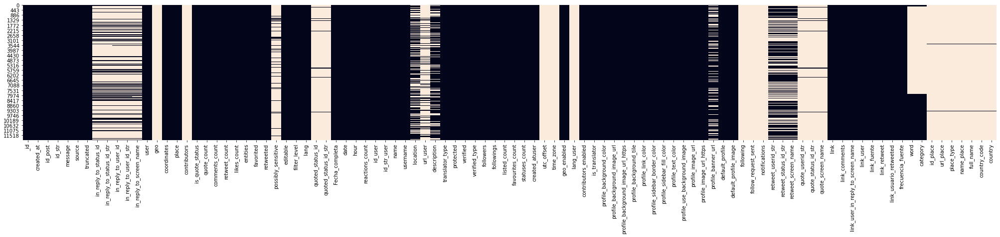

In [47]:
plt.figure(figsize=(35,5))
sns.heatmap(df1_.isnull(), cbar=False)
plt.show()

In [48]:
df1_.shape

(11948, 98)

In [49]:
# Numero de valores faltantes por variable
df1_.isna().sum().sort_values(ascending=False)[:40]

time_zone                       11948
lang_user                       11948
notifications                   11948
geo                             11948
follow_request_sent             11948
following                       11948
utc_offset                      11948
contributors                    11948
url_place                       11852
place_type                      11852
name_place                      11852
id_place                        11852
full_name                       11852
country_code                    11852
country                         11852
quote_screen_name               11399
quote_status_id_str             11399
quote_userid_str                11399
quoted_status_id                11397
quoted_status_id_str            11397
possibly_sensitive               9899
url_user                         9684
in_reply_to_status_id            9550
in_reply_to_status_id_str        9550
in_reply_to_screen_name          9467
in_reply_to_user_id_str          9465
in_reply_to_

In [50]:
# Numero de valores faltantes por variable, luego de eliminar las columnas que tienen 100% de valores missing o nulos
df1_.isna().sum().sort_values(ascending=False)[8:30]

url_place                    11852
place_type                   11852
name_place                   11852
id_place                     11852
full_name                    11852
country_code                 11852
country                      11852
quote_screen_name            11399
quote_status_id_str          11399
quote_userid_str             11399
quoted_status_id             11397
quoted_status_id_str         11397
possibly_sensitive            9899
url_user                      9684
in_reply_to_status_id         9550
in_reply_to_status_id_str     9550
in_reply_to_screen_name       9467
in_reply_to_user_id_str       9465
in_reply_to_user_id           9465
category                      7748
word                          7748
location                      4590
dtype: int64

#### 2.1.2.1 Evaluemos las columnas (siguientes) con mayor numero de valores missing o nulos. 
- Las que no tienen todas las filas con valores missing o nulos

In [51]:
df1_.country.value_counts()

Venezuela             48
United States         15
Spain                  8
Chile                  6
Colombia               4
Italy                  3
Argentina              3
Panama                 3
Dominican Republic     2
Uruguay                2
Brazil                 1
Ecuador                1
Name: country, dtype: int64

In [52]:
df1_.country_code.value_counts()

VE    48
US    15
ES     8
CL     6
CO     4
IT     3
AR     3
PA     3
DO     2
UY     2
BR     1
EC     1
Name: country_code, dtype: int64

In [53]:
df1_.full_name.value_counts()

Mérida, Venezuela                                  14
Táchira, Venezuela                                  8
Florida, USA                                        4
Caracas, Venezuela                                  4
Madrid, Spain                                       4
Orlando, FL                                         3
Trieste, Friuli-Venezia Giulia                      3
Barquisimeto, Venezuela                             3
Panama                                              3
Miranda, Venezuela                                  3
Ciudad Autónoma de Buenos Aires, Argentina          2
anto Domingo de Guzmán, Dominican Republic          2
Montevideo, Uruguay                                 2
Murfreesboro, TN                                    2
Macul, Chile                                        2
Naples, FL                                          2
Valencia, Venezuela                                 2
Macuto, Venezuela                                   1
Cúcuta, Colombia            

In [54]:
df1_.name_place.value_counts()

Mérida                                  14
Táchira                                  8
Florida                                  4
Caracas                                  4
Madrid                                   4
Orlando                                  3
Trieste                                  3
Barquisimeto                             3
Panama                                   3
Miranda                                  3
Ciudad Autónoma de Buenos Aires          2
anto Domingo de Guzmán                   2
Montevideo                               2
Murfreesboro                             2
Macul                                    2
Naples                                   2
Valencia                                 2
Macuto                                   1
Cúcuta                                   1
Avery Creek                              1
San Fernando                             1
Santiago                                 1
Bogotá, D.C.                             1
Zulia      

In [55]:
df1_.place_type.value_counts()

city       69
admin      24
country     3
Name: place_type, dtype: int64

In [56]:
df1_.id_place.value_counts()

015e5397777769a2    14
006fa5d223223cfc     8
4ec01c9dbc693497     4
00ec4c32070f5076     4
206c436ce43a43a3     4
55b4f9e5c516e0b6     3
cf5d106c94750000     3
012b6b2c110f0c21     3
9d8ae4b0fac2036a     3
01c93e351e3122fb     3
018f1cde6bad9747     2
01fcc4a23f17e1ed     2
01a9dbb9232f0fac     2
19e2bff2e89dc38e     2
00e322460b3f03b5     2
a3f971b69fefb699     2
012af435641420c7     2
00621bae6a031422     1
00a0366f1f6cd7ff     1
ac4a4ca2cb1d8a3d     1
f68227769e30abbc     1
0010b4cb51ca93d8     1
0161be1b3f98d6c3     1
01d677e97eae46b3     1
0047c84e70b9501b     1
00914f80743a0863     1
01a73d6169f504ac     1
01fde51e65075aeb     1
00e19e9a4e1d68db     1
010416b434768b1c     1
008cea206884906b     1
27485069891a7938     1
8c532f239d63fe04     1
009924a469d7ace1     1
e0060cda70f5f341     1
01a74227630d48a8     1
00d5bffa5b6661ca     1
45e3bce63f2beeee     1
00f7750f78431b5e     1
00f84d414936f28e     1
4db990e393c2e28b     1
018247693a6733dc     1
010af3a83e5ba035     1
01d461fd3da

In [57]:
df1_.quote_screen_name.value_counts()

klon_perez        53
daviladalgi       36
Naranjazos10      29
martringut        25
pulidojorge       19
                  ..
TrapieLLo          1
SVargasOK          1
stevenarce         1
giovaromero19      1
edgarddeportes     1
Name: quote_screen_name, Length: 156, dtype: int64

In [58]:
df1_.quote_status_id_str.value_counts()

221829871              53
2178952336             36
1475197978877079554    29
2732991028             25
63284839               19
                       ..
78123176                1
79218321                1
114075048               1
120936064               1
2245716574              1
Name: quote_status_id_str, Length: 156, dtype: int64

In [59]:
df1_.quote_userid_str.value_counts()

1647976346067382272    36
1524836319289036824    25
1649157405245153281    18
1646895078944768000    18
1640705706134491136    16
                       ..
1641808355969646592     1
1641608408074731520     1
1641474054254211081     1
1641464349846904833     1
1620577844840759296     1
Name: quote_userid_str, Length: 272, dtype: int64

In [60]:
df1_.quoted_status_id_str.value_counts()

1647976346067382272    36
1524836319289036824    25
1649157405245153281    18
1646895078944768000    18
1640705706134491136    16
                       ..
1641608408074731520     1
1641474054254211081     1
1641464349846904833     1
1640341651637022720     1
1620577844840759296     1
Name: quoted_status_id_str, Length: 274, dtype: int64

In [61]:
df1_.quoted_status_id.value_counts()

1.647976e+18    36
1.524836e+18    25
1.649157e+18    18
1.646895e+18    18
1.640706e+18    16
                ..
1.641608e+18     1
1.641474e+18     1
1.641464e+18     1
1.640342e+18     1
1.620578e+18     1
Name: quoted_status_id, Length: 274, dtype: int64

In [62]:
df1_.quote_userid_str.value_counts()

1647976346067382272    36
1524836319289036824    25
1649157405245153281    18
1646895078944768000    18
1640705706134491136    16
                       ..
1641808355969646592     1
1641608408074731520     1
1641474054254211081     1
1641464349846904833     1
1620577844840759296     1
Name: quote_userid_str, Length: 272, dtype: int64

In [63]:
df1_.possibly_sensitive.value_counts()

False    2049
Name: possibly_sensitive, dtype: int64

In [64]:
df1_.url_user.value_counts()

http://todofutbolnet.mforos.com                             64
http://rayozuliano.com                                      58
http://www.nuevodia.com.ve                                  56
http://www.avsphotoreport.com                               53
http://www.ffcv.es                                          34
                                                            ..
https://evtv.online/                                         1
https://www.youtube.com/channel/UCdXnwXM6uH4hBnoBpZUomjQ     1
http://misionarbol.gob.ve/web/                               1
http://www.inproas.es                                        1
http://www.estudiantesdemerida.net                           1
Name: url_user, Length: 903, dtype: int64

In [65]:
df1_.in_reply_to_status_id.value_counts()

1.639107e+18    55
1.621660e+18    38
1.640706e+18    28
1.642294e+18    23
1.621690e+18    21
                ..
1.641973e+18     1
1.641977e+18     1
1.641826e+18     1
1.641972e+18     1
1.620489e+18     1
Name: in_reply_to_status_id, Length: 1663, dtype: int64

In [66]:
df1_.in_reply_to_status_id_str.value_counts()

1639106959579201537    55
1621660111251951616    38
1640705706134491136    28
1642293509947367425    23
1621690321426849795    21
                       ..
1641972657749995521     1
1641976962699624451     1
1641826242495119361     1
1641972130173669376     1
1620489144727375873     1
Name: in_reply_to_status_id_str, Length: 1663, dtype: int64

In [67]:
df1_.in_reply_to_screen_name.value_counts()

pulidojorge       254
FVF_Oficial       169
klon_perez        164
Naranjazos10       86
carlostaracher     60
                 ... 
CarlosRafa07        1
BarakaldoCF         1
ibrahimsael71       1
elestimulo          1
Albirroja           1
Name: in_reply_to_screen_name, Length: 766, dtype: int64

In [68]:
df1_.in_reply_to_user_id.value_counts()

6.328484e+07    254
3.606713e+08    169
2.218299e+08    164
1.475198e+18     86
4.096021e+08     60
               ... 
3.045961e+08      1
3.258138e+08      1
1.389879e+09      1
1.640331e+18      1
2.999182e+08      1
Name: in_reply_to_user_id, Length: 767, dtype: int64

In [69]:
df1_.in_reply_to_user_id_str.value_counts()

63284839               254
360671330              169
221829871              164
1475197978877079554     86
409602102               60
                      ... 
304596105                1
325813822                1
1389879272               1
1640331129185005568      1
299918176                1
Name: in_reply_to_user_id_str, Length: 767, dtype: int64

In [70]:
df1_.category.value_counts()

BusquedaFebrero_20042023    4100
Busqueda30days_21042023      100
Name: category, dtype: int64

In [71]:
df1_.word.value_counts()

fvf lang:es    4200
Name: word, dtype: int64

In [72]:
df1_.location.value_counts()

Venezuela                         1061
Caracas, Venezuela                 430
Caracas                            146
Zulia, Venezuela                   109
http://pulidojorge.blogspot.co     103
                                  ... 
En El Mejor Pais Del Mundo           1
Pakistan                             1
guacara edo carabobo                 1
Aragua                               1
Benjamin Aceval-Paraguay             1
Name: location, Length: 1753, dtype: int64

In [73]:
df1_.retweet_userid_str.value_counts()

1642691764489187328    556
1627339576472702978    542
1649077390394400768    538
1640017979495645184    489
1595117112560754688    360
                      ... 
1630691128331878400      1
1630674824740716545      1
1645824548573532161      1
1645907412405108737      1
1620453090431475716      1
Name: retweet_userid_str, Length: 911, dtype: int64

In [74]:
df1_.retweet_screen_name.value_counts()

klon_perez         997
MariaGArocha       556
VTVcanal8          538
zuricht94          489
FVF_Oficial        430
                  ... 
fiesta106            1
Mabastidas           1
ramoncolmenarec      1
IvanEReyes           1
BeikerNavas          1
Name: retweet_screen_name, Length: 413, dtype: int64

In [75]:
df1_.retweet_status_id_str.value_counts()

221829871              997
1107459559445147648    556
118864905              538
143278453              489
360671330              430
                      ... 
581913598                1
62642497                 1
103929379                1
132059687                1
240496696                1
Name: retweet_status_id_str, Length: 413, dtype: int64

In [76]:
df1_.profile_banner_url.value_counts()

https://pbs.twimg.com/profile_banners/63284839/1681516767               103
https://pbs.twimg.com/profile_banners/77606751/1675097627                64
https://pbs.twimg.com/profile_banners/193504277/1563577828               56
https://pbs.twimg.com/profile_banners/385000134/1478812614               54
https://pbs.twimg.com/profile_banners/221829871/1649353605               47
                                                                       ... 
https://pbs.twimg.com/profile_banners/330215254/1675981960                1
https://pbs.twimg.com/profile_banners/1085556689401757699/1587278863      1
https://pbs.twimg.com/profile_banners/137715066/1612494205                1
https://pbs.twimg.com/profile_banners/2814770663/1647190558               1
https://pbs.twimg.com/profile_banners/1220233871712755712/1581953818      1
Name: profile_banner_url, Length: 4219, dtype: int64

In [77]:
df1_.description.value_counts()

⚽ Football Manager C.E.O @planetavto                                                                                                                             103
Somos la comunidad más grande del País. 18 años de pasión por el Fútbol Profesional venezolano en todas sus categorías.  Fundado el 27-04-2004.                   64
Cuenta oficial del Club Deportivo #RayoZuliano | Fútbol profesional venezolano | 1ra División | Categorías juveniles ⚡️ #NuestraCausa                             58
Principal diario del estado Falcón, Venezuela. Noticias e informaciones para Venezuela, Latinoamérica y el Caribe. #NuevoDía                                      56
Futbolista                                                                                                                                                        54
                                                                                                                                                                ... 
Madre y ab

### 2.1.3 Variables Categoricas

In [78]:
df1_['date'] = pd.to_datetime(df1_['date'])

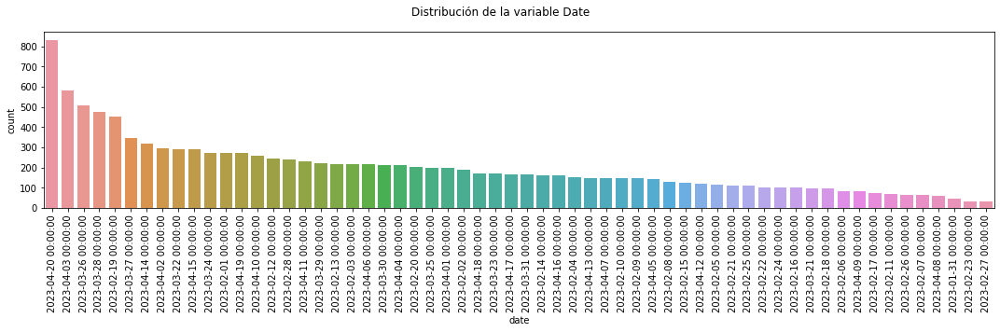

In [79]:
fig, axes = plt.subplots(figsize=(15,5))
sns.countplot(data=df1_, x='date', ax=axes, order = df1_['date'].value_counts().index)
plt.xlabel('date')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable Date")
plt.tight_layout()
plt.show() 

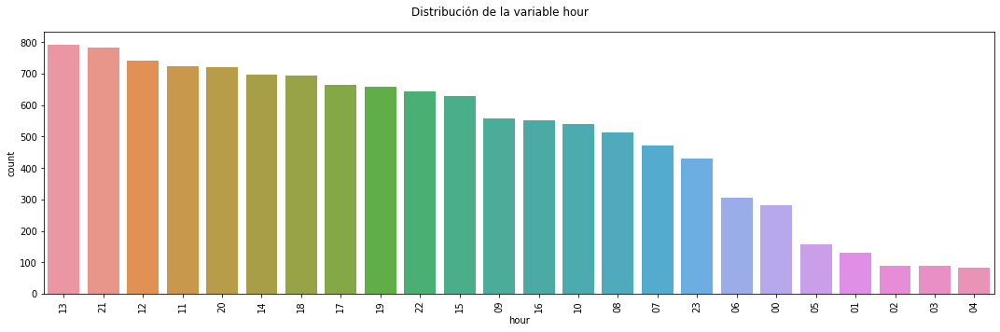

In [80]:
fig, axes = plt.subplots(figsize=(15,5))
sns.countplot(data=df1_, x='hour', ax=axes, order = df1_['hour'].value_counts().index)
plt.xlabel('hour')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable hour")
plt.tight_layout()
plt.show() 

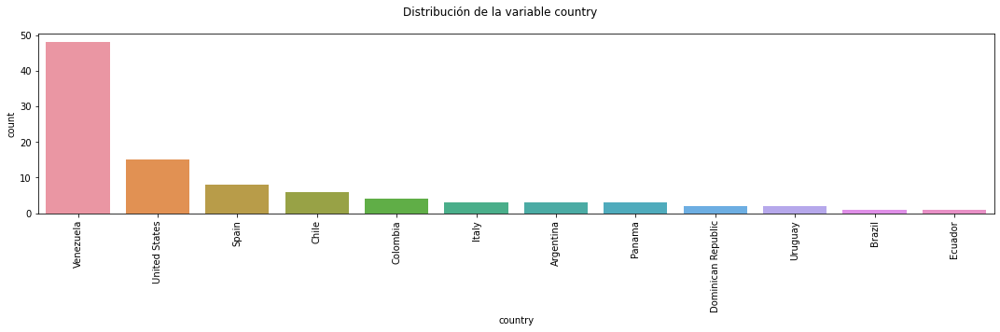

In [81]:
fig, axes = plt.subplots(figsize=(15,5))
sns.countplot(data=df1_, x='country', ax=axes, order = df1_['country'].value_counts().index)
plt.xlabel('country')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable country")
plt.tight_layout()
plt.show() 

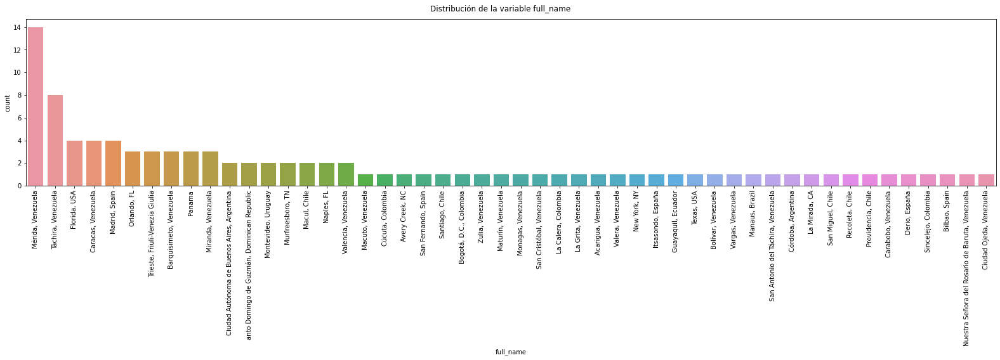

In [82]:
fig, axes = plt.subplots(figsize=(22,8))
sns.countplot(data=df1_, x='full_name', ax=axes, order = df1_['full_name'].value_counts().index)
plt.xlabel('full_name')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable full_name")
plt.tight_layout()
plt.show() 

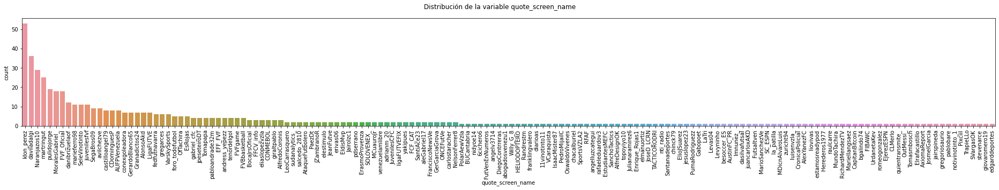

In [83]:
fig, axes = plt.subplots(figsize=(26,5))
sns.countplot(data=df1_, x='quote_screen_name', ax=axes, order = df1_['quote_screen_name'].value_counts().index)
plt.xlabel('quote_screen_name')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable quote_screen_name")
plt.tight_layout()
plt.show() 

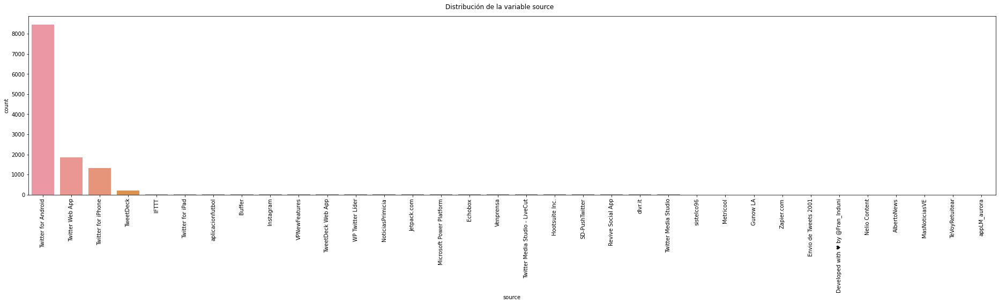

In [84]:
fig, axes = plt.subplots(figsize=(26,8))
sns.countplot(data=df1_, x='source', ax=axes, order = df1_['source'].value_counts().index)
plt.xlabel('source')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable source")
plt.tight_layout()
plt.show() 

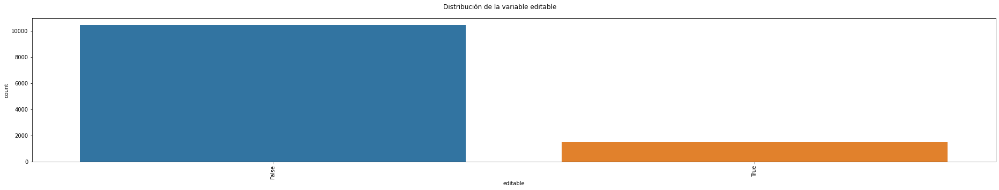

In [85]:
fig, axes = plt.subplots(figsize=(26,5))
sns.countplot(data=df1_, x='editable', ax=axes, order = df1_['editable'].value_counts().index)
plt.xlabel('editable')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable editable")
plt.tight_layout()
plt.show() 

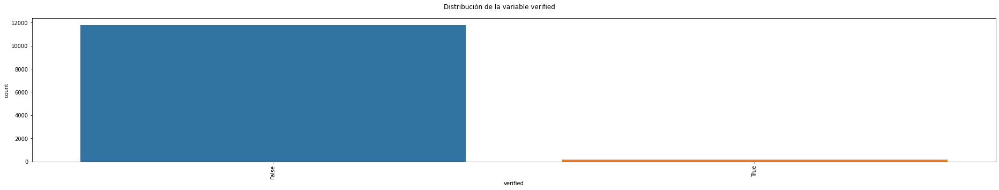

In [86]:
fig, axes = plt.subplots(figsize=(26,5))
sns.countplot(data=df1_, x='verified', ax=axes, order = df1_['verified'].value_counts().index)
plt.xlabel('verified')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable verified")
plt.tight_layout()
plt.show() 

In [87]:
# Porcentaje de cuentas verificadas por tipo
df1_.verified.value_counts(normalize=True)*100

False    98.660864
True      1.339136
Name: verified, dtype: float64

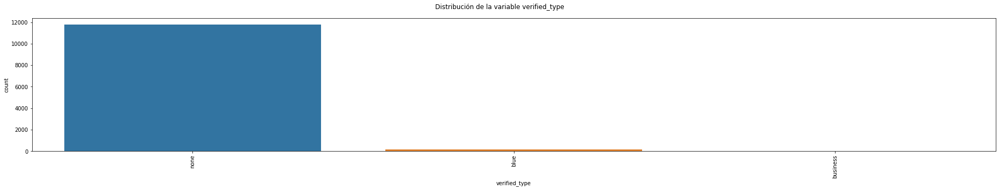

In [88]:
fig, axes = plt.subplots(figsize=(26,5))
sns.countplot(data=df1_, x='verified_type', ax=axes, order = df1_['verified_type'].value_counts().index)
plt.xlabel('verified_type')
plt.xticks(rotation=90)
plt.suptitle("Distribución de la variable verified_type")
plt.tight_layout()
plt.show() 

In [89]:
# Porcentaje de cuentas verificadas por tipo
df1_.verified_type.value_counts(normalize=True)*100

none        98.543689
blue         1.339136
business     0.117174
Name: verified_type, dtype: float64

**Nota: En Twitter, las cuentas verificadas son aquellas que han sido autenticadas y confirmadas como cuentas oficiales de figuras públicas, marcas o entidades de interés público. La verificación de una cuenta en Twitter no implica necesariamente que tengan una influencia especial o que el algoritmo de Twitter las haga más visibles de manera predeterminada.
La verificación de una cuenta tiene como objetivo principal garantizar la autenticidad y la legitimidad de la cuenta, evitando así la suplantación de identidad. Las cuentas verificadas generalmente están asociadas con personas o entidades reconocidas y suelen tener un gran número de seguidores.
En cuanto a la visibilidad en Twitter, el algoritmo de la plataforma se basa en diferentes factores para determinar qué contenido se muestra a los usuarios. Estos factores incluyen la relevancia del contenido, la interacción de los usuarios con el contenido (retweets, me gusta, respuestas), la temporalidad de los mensajes y otros elementos algorítmicos.
Si bien es posible que las cuentas verificadas tengan una mayor visibilidad en ciertos contextos, esto se debe más a su popularidad, seguidores y participación activa en la plataforma, en lugar de un trato preferencial por parte del algoritmo de Twitter.**
- **Como podemos apreciar son muy pocas las cuentas que cuentan con verificacion, son muy pocas apenas el 1.33% de las cuales existen dos tipos de verificacion: blue y business, con 1.33% y 0.11% respectivamente.**

In [90]:
print(sorted(df1_.columns))

['Fecha_completa', '_id', 'category', 'comments_count', 'contributors', 'contributors_enabled', 'coordinates', 'country', 'country_code', 'created_at', 'created_atuser', 'date', 'default_profile', 'default_profile_image', 'description', 'editable', 'entities', 'favorited', 'favourites_count', 'filter_level', 'follow_request_sent', 'followers', 'following', 'followings', 'frecuencia_fuente', 'full_name', 'geo', 'geo_enabled', 'hour', 'id_place', 'id_post', 'id_str', 'id_str_user', 'id_user', 'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'is_quote_status', 'is_translator', 'lang', 'lang_user', 'likes_count', 'link', 'link_comments', 'link_fuente', 'link_retweet', 'link_user', 'link_user_in_reply_to_screen_name', 'link_usuario_retweeted', 'listed_count', 'location', 'message', 'name', 'name_place', 'notifications', 'place', 'place_type', 'possibly_sensitive', 'profile_background_color', 'profile_backgroun

### 2.1.4 Variables Numericas

In [91]:
df1_[['favourites_count', 'followers', 'followings', 'likes_count', 'listed_count', 'quote_count', 'comments_count', 'reactions_count', 'retweet_count', 'statuses_count']]

,favourites_count,followers,followings,likes_count,listed_count,quote_count,comments_count,reactions_count,retweet_count,statuses_count
0,494,17771,4132,36,214,4,8,60,12,16772
1,8738,1430,1773,0,10,0,0,0,0,140642
2,1067,423,47,1,0,0,0,1,0,579
3,8266,336,2513,0,2,0,0,0,0,16260
4,809,867,765,0,38,0,0,0,0,94155
...,...,...,...,...,...,...,...,...,...,...
11943,43,15,50,0,0,0,0,0,0,267
11944,604,127,388,0,2,0,0,0,0,3873
11945,4202,756,798,0,5,0,0,0,0,35662
11946,258,1043,678,0,5,0,0,0,0,26010


In [92]:
df1_[['followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'reactions_count', 'statuses_count']].select_dtypes(include=np.number).describe()

,followers,followings,listed_count,favourites_count,likes_count,retweet_count,quote_count,comments_count,reactions_count,statuses_count
count,1.194800e+04,11948.000000,11948.000000,1.194800e+04,11948.000000,11948.000000,11948.000000,11948.000000,11948.000000,1.194800e+04
mean,1.782894e+04,1306.533981,65.744978,2.247837e+04,2.003683,0.665216,0.062688,0.283060,3.014647,6.467848e+04
std,1.926024e+05,3617.382191,572.749007,5.077176e+04,21.147946,12.065240,0.977012,4.116235,33.745998,1.980718e+05
min,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+00
25%,8.300000e+01,194.000000,0.000000,5.747500e+02,0.000000,0.000000,0.000000,0.000000,0.000000,5.214750e+03
50%,3.200000e+02,602.000000,1.000000,4.920000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,1.981300e+04
75%,1.213000e+03,1520.000000,8.000000,2.254300e+04,0.000000,0.000000,0.000000,0.000000,0.000000,5.253125e+04
max,5.548273e+06,208248.000000,19299.000000,1.087051e+06,1133.000000,636.000000,65.000000,316.000000,1951.000000,3.089672e+06


In [93]:
df1_[df1_['favourites_count']==1087051][['username']]

,username
3368,FerDrangosch


In [94]:
df1_[['favourites_count']].max()

favourites_count    1087051
dtype: int64

In [95]:
# Verificamos la distribuciones mediante los graficos de caja de las características numéricas en el conjunto de datos original.
def box_plot(cols, df):
    fig, axes = plt.subplots(5,2, figsize=(22,17))
    for col, ax in zip(cols, axes.ravel()):
        sns.boxplot(data=df, x=col, ax=ax)
        plt.xlabel(col)
    
    plt.suptitle("Box plots de las variables")
    #fig.delaxes(axes[1,2])
    plt.tight_layout()
    plt.show()

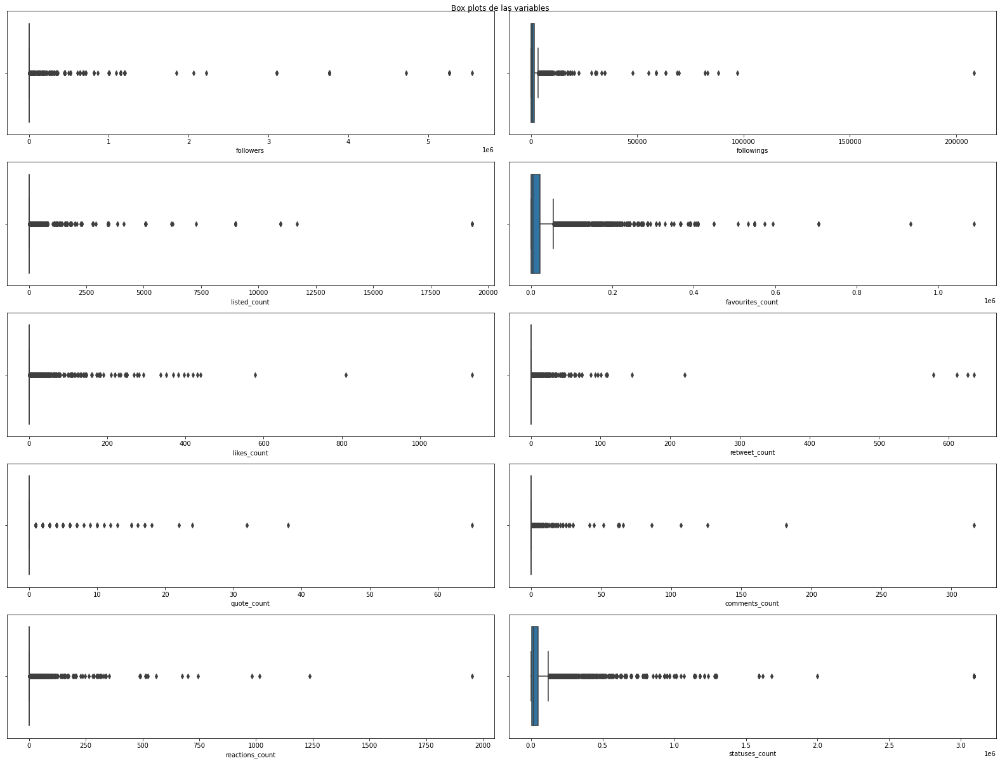

In [96]:
box_plot(['followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count','comments_count', 'reactions_count', 'statuses_count'], df1_)  

- **Nota: Se puede apreciar que las distribuciones de los valores son cercanas a cero (la mediana, los cuartiles), lo que habla de que si bien existen muchas publicaciones influir en tus seguidores o comunidades a realizar acciones (a traves de RTs, Favoritos (Likes), Citas (Quotes), O Replies (Comentarios)) no es tan sencillo, y este tipo de reacciones por publicaciones es normalmente bajo. De alli que no todo los usuarios influyan, asi como sus contenidos, puede hoy influyas pero mañana no. Tambien se puede apreciar que son mas frecuentes los usuarios / cuentas que tienen pocas publicaciones. Se puede apreciar los outliers presentes en cada uno de los conteos. Destacando que: pocas cuentas tienen muchos seguidores, son pocas las cuentas que realizan muchas publicaciones (si estas no tienen mucho tiempo, siguen comportamientos similares a las de BOTs), son pocos los usuarios a los que le han gustado muchas publicaciones distintas durante el tiempo de vida de las cuentas, esto habla de cuentas tienen tiempo en twitter,  por ejemplo FerDrangosch (favourites_count: 1087051) cuya cuenta se remonta al año 2014.**

### 2.1.5 Gráficos de distribución

In [97]:
# Verificamos la distribución de las características numéricas en el conjunto de datos original.
def distributions(cols, df):
    fig, axes = plt.subplots(3,3, figsize=(22,17))
    for col, ax in zip(cols, axes.ravel()):
        sns.histplot(data=df, x=col, ax=ax)
        plt.xlabel(col)
    
    plt.suptitle("Distribucion de caracteristicas")
    #fig.delaxes(axes[1,2])
    plt.tight_layout()
    plt.show()

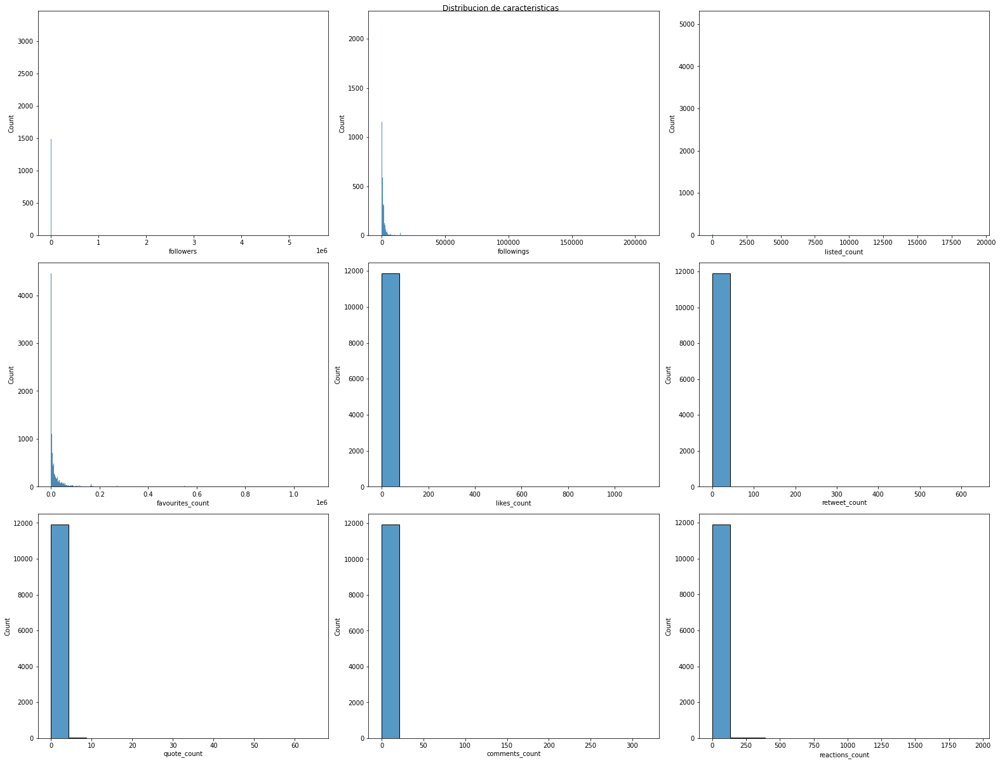

In [98]:
distributions(['followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count','comments_count', 'reactions_count', 'statuses_count'], df1_)    

- **Nota: Esto nos permite corroborar lo visualizado en los box plots, son pocas las publicaciones que resaltan, es decir las que generan influencia, siendo asi este comportamiento se puedo considerar atipico.**

### 2.1.6 Multi-collinearity

In [99]:
# Columnas numericas
#  retiramos reactions_count ya que es la suma de df['reactions_count'] = df['likes_count'] +  df['retweet_count'] +  df['quote_count'] + df['reply_count']
cols_num = ['followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count']

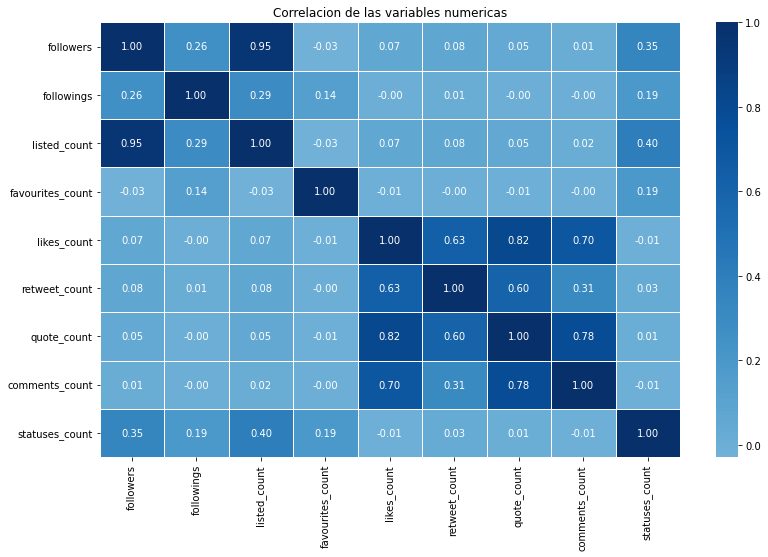

In [100]:
# Correlation of numerical features
plt.figure(figsize=(13,8))
plt.title('Correlacion de las variables numericas')
sns.heatmap(df1_[cols_num].corr(), annot=True, fmt='.2f', cmap='Blues',  center=0, linewidths=1)
plt.show()

- **Llamaba la atencion que la variable de mayor correlacion es la de listed_count (Hasta que averiguamos mas y citamos la informacion encontrada) y followers, lo que tiene logica por que al tener mas seguidores aumenta la probabilidad de que se incluya a ese usuario en una lista desde la cual se le puede hacer seguimiento a las cuentas de interes. Seguido por quote_count y likes_count / comments_count, lo que habla de que citar a alguien aumenta la probablidad de tener mas likes (favoritos) y comentarios (replies).** 

**Nota: El valor "listed_count" en Twitter se refiere al número de listas en las que un usuario ha sido incluido. Las listas en Twitter son una función que permite a los usuarios organizar y categorizar cuentas de Twitter en grupos específicos según temas, intereses o cualquier otro criterio.
El "listed_count" puede considerarse como una métrica que indica la relevancia y la influencia de una cuenta en la comunidad de Twitter. Cuanto mayor sea el "listed_count" de una cuenta, significa que ha sido incluida en más listas, lo cual puede interpretarse como un indicativo de que otros usuarios consideran que esa cuenta es importante, interesante o influyente en su campo o temática.
Sin embargo, es importante tener en cuenta que el "listed_count" no es el único factor determinante de la influencia en Twitter. Otros factores, como el número de seguidores, la participación activa, la interacción con otros usuarios y la calidad del contenido, también juegan un papel importante en la influencia de una cuenta en la plataforma.
En resumen, un alto valor de "listed_count" puede indicar que una cuenta es considerada relevante y de interés para otros usuarios en Twitter, lo que puede ser un indicio de su influencia en ciertos temas o áreas específicas. No obstante, es necesario considerar otros factores para tener una imagen más completa de la influencia de una cuenta en Twitter.**

### 2.1.7 Revision de variables para su eleccion posterior (como entrada al modelo a entrenar)

### 2.1.7.1 Idiomas: Revision de filas en las que el mensaje esta en otro idioma

In [101]:
df[['lang']].value_counts()

lang
es      11864
ca         69
eu          7
it          4
in          3
fr          1
dtype: int64

In [102]:
df[df['lang'] != 'es'][['message']]

,message
2636,@carlostaracher @FVF_Oficial @SouthamptonFC @SOLOVENEX_ Posible mundial sub17 serí convocado
2710,@carlostaracher @FVF_Oficial Rico?
3364,La Community de la FVF leyendo mi twt https://t.co/rejAPBSG2O https://t.co/Xjfvj6SXvj
3670,@11vinotinto11 @juvenilesfvf @FVF_Oficial Non me permite abrirlo el Link...\nIndica video privado 😟
4043,@juvenilesfvf @FVF_Oficial @TournoiMRevello La revancha
...,...
11674,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11705,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11707,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11714,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb


In [103]:
df[df['lang'] == 'ca'][['message']]

,message
2636,@carlostaracher @FVF_Oficial @SouthamptonFC @SOLOVENEX_ Posible mundial sub17 serí convocado
4923,rt Designaciones arbitrales para la Jornada 8️⃣ de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/7JjVyWXIw1
4966,rt Designaciones arbitrales para la Jornada 8️⃣ de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/7JjVyWXIw1
5012,rt Designaciones arbitrales para la Jornada 8️⃣ de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/7JjVyWXIw1
5018,rt Designaciones arbitrales para la Jornada 8️⃣ de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/7JjVyWXIw1
...,...
11674,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11705,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11707,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb
11714,rt Designaciones arbitrales para la Jornada 1 de la @LigaFUTVE 📄\n\n#Arbitraje 🇻🇪 https://t.co/bZodHCp7Yb


In [104]:
df[df['lang'] == 'eu'][['message']]

,message
4342,rt 🚨𝐄𝐬𝐩𝐚𝐢𝐧𝐢𝐚𝐤𝐨 𝐒𝐞𝐥𝐞𝐤𝐳𝐢𝐨 𝐀𝐮𝐭𝐨𝐧𝐨𝐦𝐢𝐤𝐨𝐞𝐧 𝐓𝐱𝐚𝐩𝐞𝐥𝐤𝐞𝐭𝐚🚨\n\n😉¡Nos vemos pronto amigos!\n\n🏆𝐒𝐮𝐛-𝟏𝟐 (@rfef)\n🗓️ Apirilak 29-1 Abril\n🏟️Madrid\n🆚 @FFIB_oficial - @FFCM_es - @asturfutbol - @fedfutnavarra \n\n#BatzenGaituelako https://t.co/MrpNIqqiSv
5051,rt 🚨𝐄𝐬𝐩𝐚𝐢𝐧𝐢𝐚𝐤𝐨 𝐒𝐞𝐥𝐞𝐤𝐳𝐢𝐨 𝐀𝐮𝐭𝐨𝐧𝐨𝐦𝐢𝐤𝐨𝐞𝐧 𝐓𝐱𝐚𝐩𝐞𝐥𝐤𝐞𝐭𝐚🚨\n\n😉¡Nos vemos pronto amigos!\n\n🏆𝐒𝐮𝐛-𝟏𝟐 (@rfef)\n🗓️ Apirilak 29-1 Abril\n🏟️Madrid\n🆚 @FFIB_oficial - @FFCM_es - @asturfutbol - @fedfutnavarra \n\n#BatzenGaituelako https://t.co/MrpNIqqiSv
5246,rt 🚨𝐄𝐬𝐩𝐚𝐢𝐧𝐢𝐚𝐤𝐨 𝐒𝐞𝐥𝐞𝐤𝐳𝐢𝐨 𝐀𝐮𝐭𝐨𝐧𝐨𝐦𝐢𝐤𝐨𝐞𝐧 𝐓𝐱𝐚𝐩𝐞𝐥𝐤𝐞𝐭𝐚🚨\n\n😉¡Nos vemos pronto amigos!\n\n🏆𝐒𝐮𝐛-𝟏𝟐 (@rfef)\n🗓️ Apirilak 29-1 Abril\n🏟️Madrid\n🆚 @FFIB_oficial - @FFCM_es - @asturfutbol - @fedfutnavarra \n\n#BatzenGaituelako https://t.co/MrpNIqqiSv
11354,rt 📰𝗛𝗔𝗠𝗔𝗜𝗞𝗔 𝗔𝗟𝗗𝗜𝗭𝗞𝗔𝗥𝗜𝗔 - 𝗥𝗘𝗩𝗜𝗦𝗧𝗔 𝗛𝗔𝗠𝗔𝗜𝗞𝗔📰\n\n✍️18. Zenbakia: 𝐉𝐀𝐑𝐑𝐀𝐈𝐓𝐔 𝐁𝐄𝐇𝐀𝐑𝐑𝐄𝐊𝐎 𝐁𝐈𝐃𝐄𝐀\n👀https://t.co/Z3jYPXqkcG\n\n✍️Número 18: 𝐂𝐀𝐌𝐈𝐍𝐎 𝐀 𝐒𝐄𝐆𝐔𝐈𝐑\n👀https://t.co/lecnKWZedz https://t.co/6vzA6rmdgO
11412,rt 📰𝗛𝗔𝗠𝗔𝗜𝗞𝗔 𝗔𝗟𝗗𝗜𝗭𝗞𝗔𝗥𝗜𝗔 - 𝗥𝗘𝗩𝗜𝗦𝗧𝗔 𝗛𝗔𝗠𝗔𝗜𝗞𝗔📰\n\n✍️18. Zenbakia: 𝐉𝐀𝐑𝐑𝐀𝐈𝐓𝐔 𝐁𝐄𝐇𝐀𝐑𝐑𝐄𝐊𝐎 𝐁𝐈𝐃𝐄𝐀\n👀https://t.co/Z3jYPXqkcG\n\n✍️Número 18: 𝐂𝐀𝐌𝐈𝐍𝐎 𝐀 𝐒𝐄𝐆𝐔𝐈𝐑\n👀https://t.co/lecnKWZedz https://t.co/6vzA6rmdgO
11421,rt 📰𝗛𝗔𝗠𝗔𝗜𝗞𝗔 𝗔𝗟𝗗𝗜𝗭𝗞𝗔𝗥𝗜𝗔 - 𝗥𝗘𝗩𝗜𝗦𝗧𝗔 𝗛𝗔𝗠𝗔𝗜𝗞𝗔📰\n\n✍️18. Zenbakia: 𝐉𝐀𝐑𝐑𝐀𝐈𝐓𝐔 𝐁𝐄𝐇𝐀𝐑𝐑𝐄𝐊𝐎 𝐁𝐈𝐃𝐄𝐀\n👀https://t.co/Z3jYPXqkcG\n\n✍️Número 18: 𝐂𝐀𝐌𝐈𝐍𝐎 𝐀 𝐒𝐄𝐆𝐔𝐈𝐑\n👀https://t.co/lecnKWZedz https://t.co/6vzA6rmdgO
11422,rt 📰𝗛𝗔𝗠𝗔𝗜𝗞𝗔 𝗔𝗟𝗗𝗜𝗭𝗞𝗔𝗥𝗜𝗔 - 𝗥𝗘𝗩𝗜𝗦𝗧𝗔 𝗛𝗔𝗠𝗔𝗜𝗞𝗔📰\n\n✍️18. Zenbakia: 𝐉𝐀𝐑𝐑𝐀𝐈𝐓𝐔 𝐁𝐄𝐇𝐀𝐑𝐑𝐄𝐊𝐎 𝐁𝐈𝐃𝐄𝐀\n👀https://t.co/Z3jYPXqkcG\n\n✍️Número 18: 𝐂𝐀𝐌𝐈𝐍𝐎 𝐀 𝐒𝐄𝐆𝐔𝐈𝐑\n👀https://t.co/lecnKWZedz https://t.co/6vzA6rmdgO


In [105]:
df[df['lang'] == 'it'][['message']]

,message
2710,@carlostaracher @FVF_Oficial Rico?
3364,La Community de la FVF leyendo mi twt https://t.co/rejAPBSG2O https://t.co/Xjfvj6SXvj
3670,@11vinotinto11 @juvenilesfvf @FVF_Oficial Non me permite abrirlo el Link...\nIndica video privado 😟
10954,@DiazSport2 @DvoRayoZuliano @FVF_Oficial @la_academiapc Jajajajjajajajajjsjsjsjjsjsja


In [106]:
df[df['lang'] == 'in'][['message']]

,message
8095,@irma_fvf 10/10 mi apa
8347,rt Aprendan @FVF_Oficial @jandresgimenez @JAntonioQ_ https://t.co/k1TQ1zi3j4
8357,Aprendan @FVF_Oficial @jandresgimenez @JAntonioQ_ https://t.co/k1TQ1zi3j4


In [107]:
df[df['lang'] == 'fr'][['message']]

,message
4043,@juvenilesfvf @FVF_Oficial @TournoiMRevello La revancha


- **Nota: No hay realmente mensajes en otro idioma.**

### 2.1.7.2 Source

In [108]:
# Verificar si hay alguna fuente reconocida y automatizada de generacion de contenido 
df[['source']].value_counts()

source                          
Twitter for Android                 8462
Twitter Web App                     1861
Twitter for iPhone                  1318
TweetDeck                            211
Twitter for iPad                      14
IFTTT                                 14
aplicacionfutbol                       9
Buffer                                 6
Instagram                              5
VPNewFeatures                          5
WP Twitter Líder                       4
TweetDeck Web App                      4
Jetpack.com                            3
NoticiasPrimicia                       3
Twitter Media Studio - LiveCut         2
Twitter Media Studio                   2
Venprensa                              2
SD-PushTwitter                         2
Revive Social App                      2
Microsoft Power Platform               2
Hootsuite Inc.                         2
Echobox                                2
dlvr.it                                2
Zapier.com              

### 2.1.7.3 Hashtags

In [26]:
# Funcion que agrega una columna con las etiquetas mas usadas
import re
import pandas as pd
# Crear copia del df utilizado
df_tmp_1 = df.copy()
# Define una función para extraer las etiquetas utilizadas
def extraer_etiquetas_1(texto):
    menciones = re.findall(r'#\w+', texto)  # Busca todas las etiquetas que comienzan con "#" y contienen al menos un carácter alfanumérico
    menciones = ' '.join(menciones)
    return menciones
# Agregar columna 'hashtags' con las etiquetas existentes en cada mensaje
df_tmp_1['hashtags'] = df_tmp_1['message'].apply(extraer_etiquetas_1)
# Verificamos los etiquetas mas usadas
df_tmp_1['hashtags'].value_counts()

                                                       8381
#Portuguesa                                             557
#EnVideo #ManoDeHierro                                  539
#Extraoficial #Maturin #Monagas #LogrosEnRevolución     116
#Arbitraje                                               89
                                                       ... 
#FutbolSala #AretoFutbola                                 1
#Vinotinto #FVF #selevinotinto                            1
#Brasil                                                   1
#pekerman #Lezcano                                        1
#Almeria2023 #SomValenciana                               1
Name: hashtags, Length: 510, dtype: int64

### 2.1.7.4 Hashtags v2

In [27]:
# Funcion que agrega una columna con las etiquetas mas usadas
import re
import pandas as pd
# Crear copia del df utilizado
df_tmp_2 = df.copy()
# Define una función para extraer las etiquetas utilizadas
def extraer_etiquetas(texto):
    menciones = re.findall(r'#\w+', texto)  # Busca todas las etiquetas que comienzan con "#" y contienen al menos un carácter alfanumérico
    return menciones
# Aplica la función de extracción de menciones a la columna "mensaje" del DataFrame
df_tmp_2['menciones'] = df_tmp_2['message'].apply(extraer_etiquetas)

# Cuenta el número de etiquetas del df evaluado
conteo_menciones = {}
for menciones in df_tmp_2['menciones']:
    for mencion in menciones:
        if mencion in conteo_menciones:
            conteo_menciones[mencion] += 1
        else:
            conteo_menciones[mencion] = 1

# Ordena los usuarios por número de menciones en orden descendente
usuarios_mencionados = sorted(conteo_menciones.items(), key=lambda x: x[1], reverse=True)
usuarios_mencionados = pd.DataFrame(usuarios_mencionados, columns=['Word', 'Frequency'] )

# Muestra los 10 usuarios más mencionados
print(usuarios_mencionados[:10])

            Word  Frequency
0    #Portuguesa        562
1       #EnVideo        539
2  #ManoDeHierro        539
3           #FVF        440
4     #Venezuela        152
5     #LigaFUTVE        152
6       #Maturin        119
7       #Monagas        117
8     #Arbitraje        117
9  #Extraoficial        116


In [111]:
df['date'].dtype

dtype('O')

In [112]:
df.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id',
       ...
       'category', 'id_place', 'url_place', 'place_type', 'name_place',
       'full_name', 'country_code', 'country', 'bounding_box', 'attributes'],
      dtype='object', length=115)

### 2.1.7.5 Menciones (Quotes)

In [28]:
import re
import pandas as pd
# Crear copia del df utilizado
df_tmp_3 = df.copy()
# Define una función para extraer las menciones de usuario
def extraer_menciones(texto):
    #menciones = re.findall(r'@\w+', texto)  # Busca todas las menciones que comienzan con "@" y contienen al menos un carácter alfanumérico
    menciones = re.findall(r'@[\w.]+', texto) 

    menciones_output = []
    for mencion in menciones:
        if mencion[-1] == '.':
            menciones_output.append(mencion[:-1])
        else:
            menciones_output.append(mencion)
    return menciones_output

# Aplica la función de extracción de menciones a la columna "mensaje" del DataFrame
df_tmp_3['menciones'] = df_tmp_3['message'].apply(extraer_menciones)

# Cuenta el número de menciones para cada usuario
conteo_menciones = {}
for menciones in df_tmp_3['menciones']:
    for mencion in menciones:
        if mencion in conteo_menciones:
            conteo_menciones[mencion] += 1
        else:
            conteo_menciones[mencion] = 1

# Ordena los usuarios por número de menciones en orden descendente
usuarios_mencionados_2 = sorted(conteo_menciones.items(), key=lambda x: x[1], reverse=True)
usuarios_mencionados_2 = pd.DataFrame(usuarios_mencionados_2, columns=['Word', 'Frequency'] )

# Muestra los 10 usuarios más mencionados
print(usuarios_mencionados_2[:10])

              Word  Frequency
0     @FVF_Oficial       4751
1  @jandresgimenez        777
2   @SeleVinotinto        741
3       @LigaFUTVE        638
4      @hugbelpsuv        557
5   @NicolasMaduro        433
6    @juvenilesfvf        429
7           @agdws        363
8     @pulidojorge        355
9         @EFF_FVF        295


### 2.1.7.6 Usuarios a quienes mas le responden (o mas comentarios poseen)

In [114]:
# Usuarios con mas comentarios
df.in_reply_to_screen_name.value_counts()[:10]

pulidojorge        254
FVF_Oficial        169
klon_perez         164
Naranjazos10        86
carlostaracher      60
TrapieLLo           41
foro_todofutbol     34
ErasmoProvenza      30
FFCV_info           28
CDominguesP         26
Name: in_reply_to_screen_name, dtype: int64

In [115]:
# validamos a los usuarios con mas comentarios
df.in_reply_to_user_id.value_counts()

6.328484e+07    254
3.606713e+08    169
2.218299e+08    164
1.475198e+18     86
4.096021e+08     60
               ... 
3.045961e+08      1
3.258138e+08      1
1.389879e+09      1
1.640331e+18      1
2.999182e+08      1
Name: in_reply_to_user_id, Length: 767, dtype: int64

In [116]:
# Numero de comentarios totales
df.comments_count.value_counts()[:10]

0     10881
1       745
2       155
3        48
4        35
9        10
6         9
8         9
5         9
23        4
Name: comments_count, dtype: int64

### 2.1.7.7 Usuarios que recibieron mas retweets a sus mensajes

In [117]:
# Usuarios con mas retweet
df.retweet_screen_name.value_counts()[:10]

klon_perez         997
MariaGArocha       556
VTVcanal8          538
zuricht94          489
FVF_Oficial        430
delcyrodriguezv    360
Naranjazos10       287
MervinMaldonad0    209
SOLOVENEX_         200
amarcanopsuv       163
Name: retweet_screen_name, dtype: int64

In [118]:
df['retweet_count'].max()

636

In [119]:
df['retweet_count'].mean()

0.6652159357214597

In [120]:
df['retweet_count'].min()

0

### 2.1.7.8 Usuarios mas citados (quotes)

In [121]:
# Usuarios mas citados
df.quote_screen_name.value_counts()[:10]

klon_perez         53
daviladalgi        36
Naranjazos10       29
martringut         25
pulidojorge        19
MoralesGabriel_    18
FVF_Oficial        18
danibrizuelaof     12
marieferro98       11
SeleVinotinto      11
Name: quote_screen_name, dtype: int64

### 2.1.7.9 Usuarios que recibieron mas likes (favoritos)

In [122]:
# Usuarios que recibieron mas likes (favoritos)
df_lc = df.groupby('username')['likes_count'].sum().reset_index().sort_values(['likes_count'], ascending=False)
df_lc[:10]

,username,likes_count
5242,klon_perez,4521
2520,Naranjazos10,1688
3021,SOLOVENEX_,1360
4551,foro_todofutbol,822
3952,carlostaracher,609
4818,idiomafutve,608
2198,Luis_MontillaG,558
1213,FVF_Oficial,558
5993,pulidojorge,544
2352,MarioSanchezVe,531


In [123]:
df.groupby(['id_post', 'username', 'message'])['retweet_count'].sum().reset_index().sort_values(['retweet_count'], ascending=False)[:10]

,id_post,username,message,retweet_count
7414,1642691764489187328,MariaGArocha,"Hablando de bienes ROBADOS......\n Qué será de la sede ""EXPROPIADA"" a Multinacional de Seguros en la AV 30 de Acarigua y adjudicada a panas de @hugbelpsuv de la FVF en #Portuguesa?. Curiosamente se trata de los mismos que ""pasaron raqueta"" en Anzoátegui, Guayana y Trujillo. https://t.co/DX2qqWMypX",636
2669,1627339576472702978,klon_perez,"El expresidente del Deportivo Lara, Khalil Yusef, se fue del país dejando un montón de deudas, habiendo estafado jugadores del FUTVE y de paso dejando tirados sin poder volver a su país a varios importados que pretendía fichar para este año... \n\nTodo esto es PERMITIDO por la FVF. https://t.co/Z04J0vBRcA",627
11165,1649077390394400768,VTVcanal8,"#EnVideo📹| Pdte. de la @FVF_Oficial Jorge Jiménez subrayó que el Estadio de Fútbol de Camurí Chico, en el mcpio. Vargas del edo. La Guaira, es el primero en inaugurarse del proyecto en marcha de todas las entidades del país, para el impulso del deporte nacional.\n\n#ManoDeHierro https://t.co/N4dBJqAMkl",612
5165,1640017979495645184,zuricht94,"Laydeker Navas operador Número uno de Hugbel Roa y Tareck El Aissami en el Fútbol, actualmente Gerente General del equipo Academia Anzoategui y también directivo de la FVF y Diputado por el Estado Portuguesa. \n\nFue Gerente también de los equipos Mineros de Guayana y Trujillanos… https://t.co/YLASI03JTU",578
7126,1642293509947367425,MervinMaldonad0,"¡La GUAIRA tendrá su nuevo estadio de FÚTBOL profesional! ⚽️🥇\n\nSe estrenará en los V Juegos Deportivos del ALBA, y está quedando bello 😍\n\nGracias Presidente @NicolasMaduro\nGobernador @Jateranoficial @FVF_Oficial 💪\n\n¡El deporte en Venezuela brillando! 👏 https://t.co/Nh8zl6l0Kn",221
5687,1640338386589212674,SOLOVENEX_,🇻🇪🥲 • El 𝒆𝒎𝒐𝒕𝒊𝒗𝒐 𝒎𝒆𝒏𝒔𝒂𝒋𝒆 de Fernando Batista a los venezolanos en el exterior… \n\n. @bochabatista trabaja junto a la @selevinotinto en suelo árabe por la Fecha FIFA del mes de marzo.\n\n♥️ ¡𝗟𝗶𝗸𝗲 si te sentiste identificado/a! \n\n🎥 | Comunicaciones @FVF_Oficial | https://t.co/HgVG2cGPe1,145
665,1621690321426849795,ManoloDavilatv,Señores de la liga Futve y @FVF_Oficial recuerden que no se puede trasmitir nuestro Fútbol por canales internacionales por suscripción solamente. Es una obligación que se vea en Venezuela en señal abierta…es una de las normas que tiene que cumplir la Federación de Fútbol..,110
8993,1645392663728848896,EnsedeCiencia,Se replican por métodos que sólo habían sido observados a nivel molecular 🤯\n\nhttps://t.co/anMMFC7pEF,108
11774,1649167446887002116,SOLOVENEX_,__ ¿VAMOS AL MUNDIAL?\n\n__ ¡𝗩𝗔𝗠𝗢𝗦 𝗔𝗟 𝗠𝗨𝗡𝗗𝗜𝗔𝗟!\n\nLa reacción tras el pitazo final: 😭🇻🇪\n\n.@juvenilesfvf • @FVF_Oficial https://t.co/WI56VgVH6o,101
10840,1648529733385351168,amarcanopsuv,Dios bendice nuestro estado Bolívar!!! Vamos por más en el Cachamay @FVF_Oficial @NicolasMaduro @delcyrodriguezv @pinfantea @MervinMaldonad0 https://t.co/yx6WfvF3SF,96


In [124]:
df.groupby(['id_post', 'username', 'message'])['retweet_count'].sum().reset_index().sort_values(['retweet_count'], ascending=False)[:10]

,id_post,username,message,retweet_count
7414,1642691764489187328,MariaGArocha,"Hablando de bienes ROBADOS......\n Qué será de la sede ""EXPROPIADA"" a Multinacional de Seguros en la AV 30 de Acarigua y adjudicada a panas de @hugbelpsuv de la FVF en #Portuguesa?. Curiosamente se trata de los mismos que ""pasaron raqueta"" en Anzoátegui, Guayana y Trujillo. https://t.co/DX2qqWMypX",636
2669,1627339576472702978,klon_perez,"El expresidente del Deportivo Lara, Khalil Yusef, se fue del país dejando un montón de deudas, habiendo estafado jugadores del FUTVE y de paso dejando tirados sin poder volver a su país a varios importados que pretendía fichar para este año... \n\nTodo esto es PERMITIDO por la FVF. https://t.co/Z04J0vBRcA",627
11165,1649077390394400768,VTVcanal8,"#EnVideo📹| Pdte. de la @FVF_Oficial Jorge Jiménez subrayó que el Estadio de Fútbol de Camurí Chico, en el mcpio. Vargas del edo. La Guaira, es el primero en inaugurarse del proyecto en marcha de todas las entidades del país, para el impulso del deporte nacional.\n\n#ManoDeHierro https://t.co/N4dBJqAMkl",612
5165,1640017979495645184,zuricht94,"Laydeker Navas operador Número uno de Hugbel Roa y Tareck El Aissami en el Fútbol, actualmente Gerente General del equipo Academia Anzoategui y también directivo de la FVF y Diputado por el Estado Portuguesa. \n\nFue Gerente también de los equipos Mineros de Guayana y Trujillanos… https://t.co/YLASI03JTU",578
7126,1642293509947367425,MervinMaldonad0,"¡La GUAIRA tendrá su nuevo estadio de FÚTBOL profesional! ⚽️🥇\n\nSe estrenará en los V Juegos Deportivos del ALBA, y está quedando bello 😍\n\nGracias Presidente @NicolasMaduro\nGobernador @Jateranoficial @FVF_Oficial 💪\n\n¡El deporte en Venezuela brillando! 👏 https://t.co/Nh8zl6l0Kn",221
5687,1640338386589212674,SOLOVENEX_,🇻🇪🥲 • El 𝒆𝒎𝒐𝒕𝒊𝒗𝒐 𝒎𝒆𝒏𝒔𝒂𝒋𝒆 de Fernando Batista a los venezolanos en el exterior… \n\n. @bochabatista trabaja junto a la @selevinotinto en suelo árabe por la Fecha FIFA del mes de marzo.\n\n♥️ ¡𝗟𝗶𝗸𝗲 si te sentiste identificado/a! \n\n🎥 | Comunicaciones @FVF_Oficial | https://t.co/HgVG2cGPe1,145
665,1621690321426849795,ManoloDavilatv,Señores de la liga Futve y @FVF_Oficial recuerden que no se puede trasmitir nuestro Fútbol por canales internacionales por suscripción solamente. Es una obligación que se vea en Venezuela en señal abierta…es una de las normas que tiene que cumplir la Federación de Fútbol..,110
8993,1645392663728848896,EnsedeCiencia,Se replican por métodos que sólo habían sido observados a nivel molecular 🤯\n\nhttps://t.co/anMMFC7pEF,108
11774,1649167446887002116,SOLOVENEX_,__ ¿VAMOS AL MUNDIAL?\n\n__ ¡𝗩𝗔𝗠𝗢𝗦 𝗔𝗟 𝗠𝗨𝗡𝗗𝗜𝗔𝗟!\n\nLa reacción tras el pitazo final: 😭🇻🇪\n\n.@juvenilesfvf • @FVF_Oficial https://t.co/WI56VgVH6o,101
10840,1648529733385351168,amarcanopsuv,Dios bendice nuestro estado Bolívar!!! Vamos por más en el Cachamay @FVF_Oficial @NicolasMaduro @delcyrodriguezv @pinfantea @MervinMaldonad0 https://t.co/yx6WfvF3SF,96


In [125]:
df.groupby(['id_post', 'username', 'message'])['retweet_count'].sum().reset_index().sort_values(['retweet_count'], ascending=False)[:10]

,id_post,username,message,retweet_count
7414,1642691764489187328,MariaGArocha,"Hablando de bienes ROBADOS......\n Qué será de la sede ""EXPROPIADA"" a Multinacional de Seguros en la AV 30 de Acarigua y adjudicada a panas de @hugbelpsuv de la FVF en #Portuguesa?. Curiosamente se trata de los mismos que ""pasaron raqueta"" en Anzoátegui, Guayana y Trujillo. https://t.co/DX2qqWMypX",636
2669,1627339576472702978,klon_perez,"El expresidente del Deportivo Lara, Khalil Yusef, se fue del país dejando un montón de deudas, habiendo estafado jugadores del FUTVE y de paso dejando tirados sin poder volver a su país a varios importados que pretendía fichar para este año... \n\nTodo esto es PERMITIDO por la FVF. https://t.co/Z04J0vBRcA",627
11165,1649077390394400768,VTVcanal8,"#EnVideo📹| Pdte. de la @FVF_Oficial Jorge Jiménez subrayó que el Estadio de Fútbol de Camurí Chico, en el mcpio. Vargas del edo. La Guaira, es el primero en inaugurarse del proyecto en marcha de todas las entidades del país, para el impulso del deporte nacional.\n\n#ManoDeHierro https://t.co/N4dBJqAMkl",612
5165,1640017979495645184,zuricht94,"Laydeker Navas operador Número uno de Hugbel Roa y Tareck El Aissami en el Fútbol, actualmente Gerente General del equipo Academia Anzoategui y también directivo de la FVF y Diputado por el Estado Portuguesa. \n\nFue Gerente también de los equipos Mineros de Guayana y Trujillanos… https://t.co/YLASI03JTU",578
7126,1642293509947367425,MervinMaldonad0,"¡La GUAIRA tendrá su nuevo estadio de FÚTBOL profesional! ⚽️🥇\n\nSe estrenará en los V Juegos Deportivos del ALBA, y está quedando bello 😍\n\nGracias Presidente @NicolasMaduro\nGobernador @Jateranoficial @FVF_Oficial 💪\n\n¡El deporte en Venezuela brillando! 👏 https://t.co/Nh8zl6l0Kn",221
5687,1640338386589212674,SOLOVENEX_,🇻🇪🥲 • El 𝒆𝒎𝒐𝒕𝒊𝒗𝒐 𝒎𝒆𝒏𝒔𝒂𝒋𝒆 de Fernando Batista a los venezolanos en el exterior… \n\n. @bochabatista trabaja junto a la @selevinotinto en suelo árabe por la Fecha FIFA del mes de marzo.\n\n♥️ ¡𝗟𝗶𝗸𝗲 si te sentiste identificado/a! \n\n🎥 | Comunicaciones @FVF_Oficial | https://t.co/HgVG2cGPe1,145
665,1621690321426849795,ManoloDavilatv,Señores de la liga Futve y @FVF_Oficial recuerden que no se puede trasmitir nuestro Fútbol por canales internacionales por suscripción solamente. Es una obligación que se vea en Venezuela en señal abierta…es una de las normas que tiene que cumplir la Federación de Fútbol..,110
8993,1645392663728848896,EnsedeCiencia,Se replican por métodos que sólo habían sido observados a nivel molecular 🤯\n\nhttps://t.co/anMMFC7pEF,108
11774,1649167446887002116,SOLOVENEX_,__ ¿VAMOS AL MUNDIAL?\n\n__ ¡𝗩𝗔𝗠𝗢𝗦 𝗔𝗟 𝗠𝗨𝗡𝗗𝗜𝗔𝗟!\n\nLa reacción tras el pitazo final: 😭🇻🇪\n\n.@juvenilesfvf • @FVF_Oficial https://t.co/WI56VgVH6o,101
10840,1648529733385351168,amarcanopsuv,Dios bendice nuestro estado Bolívar!!! Vamos por más en el Cachamay @FVF_Oficial @NicolasMaduro @delcyrodriguezv @pinfantea @MervinMaldonad0 https://t.co/yx6WfvF3SF,96


In [126]:
df[df['id_post'] == 1627339576472702978]['retweet_count']

9278    627
Name: retweet_count, dtype: int64

In [127]:
df[df['id_post'] == 1642691764489187328]['retweet_count']

4533    636
Name: retweet_count, dtype: int64

In [128]:
df[df['id_post'] == 1642691764489187328]['retweet_count']

4533    636
Name: retweet_count, dtype: int64

In [129]:
df.iloc[4533]

_id                                                                                                                                                                                                                                                                                                6442afc53c00c6c014a48ba2
created_at                                                                                                                                                                                                                                                                                              2023-04-03 00:53:31
id_post                                                                                                                                                                                                                                                                                                 1642691764489187328
id_str                                              

In [130]:
# Filtrando el df en funcion de los usuarios que aparecen mas de una vez en el df
df.groupby(['id_post', 'username', 'message'])['retweet_count'].sum().reset_index().sort_values(['retweet_count'], ascending=False)[:10]

,id_post,username,message,retweet_count
7414,1642691764489187328,MariaGArocha,"Hablando de bienes ROBADOS......\n Qué será de la sede ""EXPROPIADA"" a Multinacional de Seguros en la AV 30 de Acarigua y adjudicada a panas de @hugbelpsuv de la FVF en #Portuguesa?. Curiosamente se trata de los mismos que ""pasaron raqueta"" en Anzoátegui, Guayana y Trujillo. https://t.co/DX2qqWMypX",636
2669,1627339576472702978,klon_perez,"El expresidente del Deportivo Lara, Khalil Yusef, se fue del país dejando un montón de deudas, habiendo estafado jugadores del FUTVE y de paso dejando tirados sin poder volver a su país a varios importados que pretendía fichar para este año... \n\nTodo esto es PERMITIDO por la FVF. https://t.co/Z04J0vBRcA",627
11165,1649077390394400768,VTVcanal8,"#EnVideo📹| Pdte. de la @FVF_Oficial Jorge Jiménez subrayó que el Estadio de Fútbol de Camurí Chico, en el mcpio. Vargas del edo. La Guaira, es el primero en inaugurarse del proyecto en marcha de todas las entidades del país, para el impulso del deporte nacional.\n\n#ManoDeHierro https://t.co/N4dBJqAMkl",612
5165,1640017979495645184,zuricht94,"Laydeker Navas operador Número uno de Hugbel Roa y Tareck El Aissami en el Fútbol, actualmente Gerente General del equipo Academia Anzoategui y también directivo de la FVF y Diputado por el Estado Portuguesa. \n\nFue Gerente también de los equipos Mineros de Guayana y Trujillanos… https://t.co/YLASI03JTU",578
7126,1642293509947367425,MervinMaldonad0,"¡La GUAIRA tendrá su nuevo estadio de FÚTBOL profesional! ⚽️🥇\n\nSe estrenará en los V Juegos Deportivos del ALBA, y está quedando bello 😍\n\nGracias Presidente @NicolasMaduro\nGobernador @Jateranoficial @FVF_Oficial 💪\n\n¡El deporte en Venezuela brillando! 👏 https://t.co/Nh8zl6l0Kn",221
5687,1640338386589212674,SOLOVENEX_,🇻🇪🥲 • El 𝒆𝒎𝒐𝒕𝒊𝒗𝒐 𝒎𝒆𝒏𝒔𝒂𝒋𝒆 de Fernando Batista a los venezolanos en el exterior… \n\n. @bochabatista trabaja junto a la @selevinotinto en suelo árabe por la Fecha FIFA del mes de marzo.\n\n♥️ ¡𝗟𝗶𝗸𝗲 si te sentiste identificado/a! \n\n🎥 | Comunicaciones @FVF_Oficial | https://t.co/HgVG2cGPe1,145
665,1621690321426849795,ManoloDavilatv,Señores de la liga Futve y @FVF_Oficial recuerden que no se puede trasmitir nuestro Fútbol por canales internacionales por suscripción solamente. Es una obligación que se vea en Venezuela en señal abierta…es una de las normas que tiene que cumplir la Federación de Fútbol..,110
8993,1645392663728848896,EnsedeCiencia,Se replican por métodos que sólo habían sido observados a nivel molecular 🤯\n\nhttps://t.co/anMMFC7pEF,108
11774,1649167446887002116,SOLOVENEX_,__ ¿VAMOS AL MUNDIAL?\n\n__ ¡𝗩𝗔𝗠𝗢𝗦 𝗔𝗟 𝗠𝗨𝗡𝗗𝗜𝗔𝗟!\n\nLa reacción tras el pitazo final: 😭🇻🇪\n\n.@juvenilesfvf • @FVF_Oficial https://t.co/WI56VgVH6o,101
10840,1648529733385351168,amarcanopsuv,Dios bendice nuestro estado Bolívar!!! Vamos por más en el Cachamay @FVF_Oficial @NicolasMaduro @delcyrodriguezv @pinfantea @MervinMaldonad0 https://t.co/yx6WfvF3SF,96


In [131]:
# Numero de filas totales
df.shape[0]

11948

In [132]:
# Filtrar tweets que tienen mas de 0 rts
df[df['retweet_count']>0].shape[0]

840

In [133]:
# Filtrar tweets que tienen mas de 1 rts
df[df['retweet_count']>1].shape[0]

466

In [134]:
# Filtrar tweets que tienen mas de 2 rts
df[df['retweet_count']>2].shape[0]

332

In [135]:
# Filtrar tweets que tienen mas de 3 rts
df[df['retweet_count']>3].shape[0]

263

### 2.1.7.10 Revision de Fechas

In [136]:
df['date'] = pd.to_datetime(df['date'])

In [137]:
df['date'].min()

Timestamp('2023-01-31 00:00:00')

In [138]:
df['date'].max()

Timestamp('2023-04-20 00:00:00')

In [139]:
df.groupby(['date']).size().reset_index().sort_values(by=[0],ascending=False)

,date,0
59,2023-04-20,830
42,2023-04-03,581
34,2023-03-26,509
36,2023-03-28,476
19,2023-02-19,454
35,2023-03-27,345
53,2023-04-14,317
41,2023-04-02,295
30,2023-03-22,291
54,2023-04-15,288


In [140]:
def total_publicaciones_por_dia(df,  width=800, height=500, 
                                color_line='#eba710' ,color_font="#000e28", gridcolor='#000e28', zerolinecolor="#000e28",
                                save=False, name='Linea_Tiempo_Publicacion_dia'):
        '''
        Esta función generá un gráfico de línea donde se podrá observar una serie de tiempo con
        la cantidad de publicaciones realizadas durante el periodo de estudio.
        
        ###**Parameters:**
        ----------
        * **df (dataframe):**
            dataframe con el conjunto de mensajes a graficar
        * **width (int):**
            se especifica el ancho de la grafica 
        * **height (int):**
            se especifica el alto de la grafica 
        * **color_line (hex|string):**
            se especifica el color de la linea del gráfico
        * **color_font (hex|string):**
            se especifica el color del texto
        * **gridcolor (hex|string):**
            se especifica el color de la grilla
        * **zerolinecolor (hex|string):**
            se especifica el color de los ejes
        * **save (boolean):**
            se especifica si la imagen se guardara automaticamente
        * **name (string):**
            nombre que se le establecera a la imagen guardada

    
        ###**Returns:**
        ----------
        * **fig:**
            gráfico de línea con las publicaciones por día

        ###**Example:**
        -----------
        ```python
        >>> import NucleoAnalitico.visualization as nav
        >>> nav.total_publicaciones_por_dia(df,  width=800, height=500, 
                                            color_line='#eba710' ,color_font="#000e28", gridcolor='#000e28', zerolinecolor="#000e28",
                                            save=False, name='Linea_Tiempo_Publicacion_dia')
        ```  
        '''
#         options =  {"_data": True,
#                     "empty": True,
#                     "variables":['date']}

#         Utilities._check(df, **options)

        df1 = pd.DataFrame()
        df1 = df.groupby(['date']).size().reset_index()
        df1 = df1.rename(columns = {0:"quantity"})
        
        fig = go.Figure(data=[
            go.Scatter(x=df1['date'].astype(str), y=df1['quantity'],text=df1['quantity'], 
                       marker_color=color_line,mode='lines')])
    
        fig.update_layout(
            title={
                'text': "<b>Publicaciones durante el período de estudio</b>",
                'y':0.9,
                'x':0.5,
                'xanchor': 'center',
                'yanchor': 'top'},
            xaxis = dict(
                title = "<i>Fecha</i>",
                tickangle = -45,
                titlefont = dict(
                    family = 'Raleway, monospace',
                    size = 22,
                    color = color_font),
                tickfont = dict(
                    family = 'Arial',
                    size = 15,
                    color = color_font),
                type='category',
                gridcolor = gridcolor),
            yaxis= dict(
                title = "<i>Frecuencia</i>",
                titlefont = dict(
                    family = 'Raleway, monospace',
                    size = 22,
                    color = color_font),
                tickfont = dict(
                    family = 'Arial',
                    size = 15,
                    color = color_font),
                gridcolor = gridcolor),
            legend=dict(
                font=dict(
                    family = 'Raleway, monospace',
                    size = 16,
                    color = color_font)),
                barmode='stack',
             width=width,
             height=height)
        fig.update_xaxes(zeroline=True, zerolinewidth=1.5, zerolinecolor=zerolinecolor)
        fig.update_yaxes(zeroline=True, zerolinewidth=1.5, zerolinecolor=zerolinecolor)
    
        fig.update_traces(textfont_color=color_font)
    
        fig.layout.plot_bgcolor = 'rgba(0,0,0,0)'
        fig.layout.paper_bgcolor = 'rgba(0,0,0,0)'

#         fig.write_image(os.path.join(directorio, name+'.png'), engine="orca")

        return fig.show()

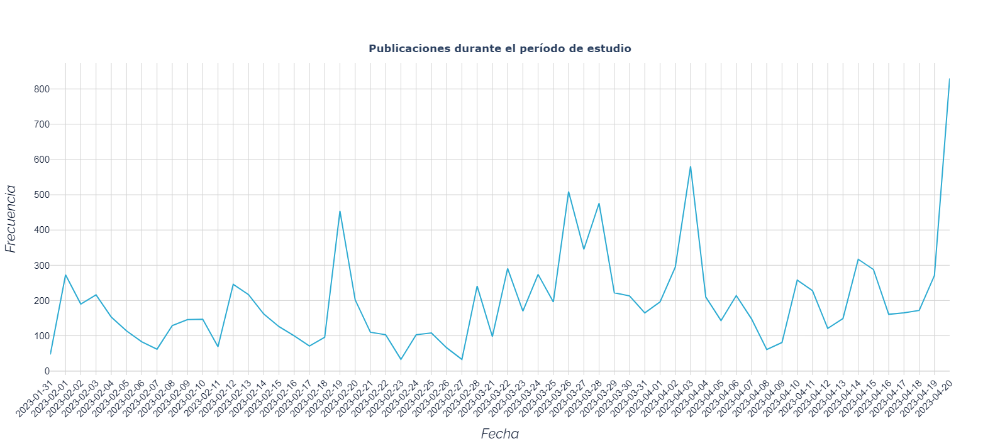

In [141]:
total_publicaciones_por_dia(df,  width=1530, height=710, 
                                color_line='#2dabd2' ,color_font="#000e28", gridcolor='#D3D3D3', zerolinecolor="#D3D3D3",
                                save=False, name='Linea_Tiempo_Publicacion_dia')

# 3. Ingenieria de datos

In [142]:
df.shape

(11948, 115)

In [143]:
# Crear copia del df utilizado
df1_2 = df1_.copy()
df1_2.shape

(11948, 98)

### 3.1 Imputacion de valores faltantes

In [144]:
# funcion para imputar los valores faltantes con 0's de las columnas de interes que se detallan a continuacion
def progephi(data_df):
    
    data_df['id_post'] = data_df['id_post'].fillna(0)
    data_df['retweet_screen_name'] = data_df['retweet_screen_name'].fillna(0)
    data_df['in_reply_to_screen_name'] = data_df['in_reply_to_screen_name'].fillna(0)
    data_df['quote_screen_name'] = data_df['quote_screen_name'].fillna(0)
#     data_df['reactions_screen_name'] = data_df['reactions_screen_name'].fillna(0)
    
    # Para df's grandes, los cuales pasan a ser grandes grafos.
    # Para limpiar el grafo, eliminalos los usuarios que unicamente tienen una unica publicacion dentro del estudio
#     data_df['count_user'] = data_df.groupby('id_post')['id_post'].transform('count')
#     data_df_filtro = data_df[data_df['count_user']>1]
#     data_df_filtro.text = data_df_filtro.apply(lambda x: x['message'].replace('\n', ''),axis=1)

    return(data_df)

In [145]:
dpg = progephi(df1_2)
dpg.shape

(11948, 98)

In [146]:
# # Verificacion de valores faltantes
cols_nan = list()
for i, value in enumerate(dpg.isna().sum()):
    if value != 0:
        cols_nan.append(dpg.isna().sum().index[i])
        print('{} tiene {} valores faltantes y representa el {:.2f}%'.format(dpg.isna().sum().index[i], value, (value/dpg.shape[0])*100))

in_reply_to_status_id tiene 9550 valores faltantes y representa el 79.93%
in_reply_to_status_id_str tiene 9550 valores faltantes y representa el 79.93%
in_reply_to_user_id tiene 9465 valores faltantes y representa el 79.22%
in_reply_to_user_id_str tiene 9465 valores faltantes y representa el 79.22%
geo tiene 11948 valores faltantes y representa el 100.00%
contributors tiene 11948 valores faltantes y representa el 100.00%
possibly_sensitive tiene 9899 valores faltantes y representa el 82.85%
quoted_status_id tiene 11397 valores faltantes y representa el 95.39%
quoted_status_id_str tiene 11397 valores faltantes y representa el 95.39%
location tiene 4590 valores faltantes y representa el 38.42%
url_user tiene 9684 valores faltantes y representa el 81.05%
description tiene 2955 valores faltantes y representa el 24.73%
utc_offset tiene 11948 valores faltantes y representa el 100.00%
time_zone tiene 11948 valores faltantes y representa el 100.00%
lang_user tiene 11948 valores faltantes y rep

In [147]:
cols_nan_30 = [var for var in dpg.isnull().sum().index if dpg.isnull().sum()[var]/dpg.shape[0] > 0.3]
print('Lista de variables con mas de 30% de valores faltantes: \n',cols_nan_30)

Lista de variables con mas de 30% de valores faltantes: 
 ['in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'geo', 'contributors', 'possibly_sensitive', 'quoted_status_id', 'quoted_status_id_str', 'location', 'url_user', 'utc_offset', 'time_zone', 'lang_user', 'profile_banner_url', 'following', 'follow_request_sent', 'notifications', 'retweet_userid_str', 'retweet_status_id_str', 'quote_userid_str', 'quote_status_id_str', 'word', 'category', 'id_place', 'url_place', 'place_type', 'name_place', 'full_name', 'country_code', 'country']


### 3.2 Eliminacion de variables con mas de 30% de valores faltantes.
- **Deberan eliminarse las variables con el 30% o mas de valores faltantes debido a la magnitud, los que poseean menos deberan ser imputados. Excepto algunas variables que imputaremos posteriormente**

In [148]:
# Seleccion de las variables a eliminar
cols_nan_30_ = ['in_reply_to_status_id_str', 'in_reply_to_user_id_str',  'contributors', 'possibly_sensitive', 'quoted_status_id_str', 'url_user', 'utc_offset', 'time_zone', 'lang_user', 'profile_banner_url', 'follow_request_sent', 'notifications', 'retweet_userid_str', 'retweet_status_id_str', 'quote_userid_str', 'quote_status_id_str', 'id_place', 'url_place', 'place_type', 'name_place']

In [149]:
# Eliminamos las columnas cuyas columnas tienen >30% de valores missing o nulos
# dpg.drop(cols_nan_30, axis=1, inplace = True)
dpg1 = dpg.drop(cols_nan_30_, axis=1)
dpg1.shape

(11948, 78)

In [150]:
dpg1.shape

(11948, 78)

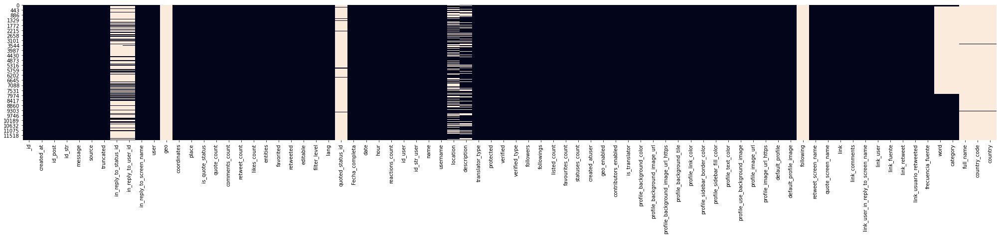

In [151]:
# Graficamos nuevamente las columnas con valores faltantes
plt.figure(figsize=(35,5))
sns.heatmap(dpg1.isnull(), cbar=False)
plt.show()

In [152]:
# Repetimos el proceso de verificacion de valores faltantes
cols_nan = list()
for i, value in enumerate(dpg1.isna().sum()):
    if value != 0:
        cols_nan.append(dpg1.isna().sum().index[i])
        print('{} tiene {} valores faltantes y representa el {:.2f}%'.format(dpg1.isna().sum().index[i], value, (value/dpg1.shape[0])*100))

in_reply_to_status_id tiene 9550 valores faltantes y representa el 79.93%
in_reply_to_user_id tiene 9465 valores faltantes y representa el 79.22%
geo tiene 11948 valores faltantes y representa el 100.00%
quoted_status_id tiene 11397 valores faltantes y representa el 95.39%
location tiene 4590 valores faltantes y representa el 38.42%
description tiene 2955 valores faltantes y representa el 24.73%
following tiene 11948 valores faltantes y representa el 100.00%
word tiene 7748 valores faltantes y representa el 64.85%
category tiene 7748 valores faltantes y representa el 64.85%
full_name tiene 11852 valores faltantes y representa el 99.20%
country_code tiene 11852 valores faltantes y representa el 99.20%
country tiene 11852 valores faltantes y representa el 99.20%


In [153]:
cols_nan_30 = [var for var in dpg1.isnull().sum().index if dpg1.isnull().sum()[var]/dpg1.shape[0] > 0.3]
print('Lista de variables con mas de 30% de valores faltantes: \n',cols_nan_30)

Lista de variables con mas de 30% de valores faltantes: 
 ['in_reply_to_status_id', 'in_reply_to_user_id', 'geo', 'quoted_status_id', 'location', 'following', 'word', 'category', 'full_name', 'country_code', 'country']


- **Eliminacion de variables: Se eliminaron las variables con el 30% o mas de valores faltantes debido a la magnitud, impuntando las que tienen un mayor porcentaje de valores nulos o extraviados. Excepto las columnas:**

    - in_reply_to_status_id tiene 9550 valores faltantes y representa el 79.93%
    - in_reply_to_user_id tiene 9465 valores faltantes y representa el 79.22%
    - geo tiene 11948 valores faltantes y representa el 100.00%
    - quoted_status_id tiene 11397 valores faltantes y representa el 95.39%
    - location tiene 4590 valores faltantes y representa el 38.42%
    - description tiene 2955 valores faltantes y representa el 24.73%
    - followers tiene 4100 valores faltantes y representa el 34.32%
    - following tiene 11948 valores faltantes y representa el 100.00%
    - word tiene 7748 valores faltantes y representa el 64.85%
    - category tiene 7748 valores faltantes y representa el 64.85%
    - full_name tiene 11852 valores faltantes y representa el 99.20%
    - country_code tiene 11852 valores faltantes y representa el 99.20%
    - country tiene 11852 valores faltantes y representa el 99.20%

### 3.3 Limpieza de Datos

In [154]:
dpg1.shape

(11948, 78)

In [155]:
# Crear copia del df utilizado
dpg2 = dpg1.copy()
dpg2.shape

(11948, 78)

#### 3.3.1 Eliminar enlaces: Puedes utilizar expresiones regulares para identificar y eliminar los enlaces de los mensajes. Por ejemplo:

In [156]:
import re

def remove_links(text):
    # Expresión regular para identificar enlaces
    link_pattern = re.compile(r'http\S+|www\S+')
    
    # Eliminar enlaces del texto
    text_without_links = re.sub(link_pattern, '', text)
    
    return text_without_links

dpg2['mensaje_sin_enlaces'] = dpg2['message'].apply(remove_links)

In [157]:
dpg2['mensaje_sin_enlaces'].head(4)

0                                                                                  Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\n
1      rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....
2                                                                                            Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial 
3    rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y Juán Pabón🇻🇪(PA), adem

#### 3.3.2 Eliminar hashtags: Utiliza expresiones regulares para identificar y eliminar los hashtags de los mensajes. Por ejemplo:

In [158]:
def remove_hashtags(text):
    # Expresión regular para identificar hashtags
    hashtag_pattern = re.compile(r'#\w+')
    
    # Eliminar hashtags del texto
    text_without_hashtags = re.sub(hashtag_pattern, '', text)
    
    return text_without_hashtags

dpg2['mensaje_sin_hashtags'] = dpg2['message'].apply(remove_hashtags)

In [159]:
dpg2['mensaje_sin_hashtags'].head(4)

0                                                         Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW
1    rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....
2                                                                   Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA
3                  rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y Juán Pabón🇻🇪(P

#### 3.3.3 Eliminar emojis: Puedes utilizar librerías como emoji para identificar y eliminar los emojis de los mensajes. Por ejemplo:

In [160]:
import emoji

def remove_emojis(text):
    # Eliminar emojis del texto
    text_without_emojis = emoji.get_emoji_regexp().sub(r'', text)
    
    return text_without_emojis

dpg2['mensaje_sin_emojis'] = dpg2['message'].apply(remove_emojis)

In [161]:
dpg2['mensaje_sin_emojis'].head(4)

0                                                                         Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW
1                    rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....
2                                                                                      Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA  @fvf_oficial https://t.co/46H8K9p2GA
3    rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño (DT), Marco Capetillo(AT), José P

#### 3.3.4 Limpiar citas (@): Puedes utilizar expresiones regulares para eliminar las citas de los mensajes. Por ejemplo:

In [162]:
def remove_mentions(text):
    # Expresión regular para identificar citas (@)
    mention_pattern = re.compile(r'@\w+')
    
    # Eliminar citas del texto
    text_without_mentions = re.sub(mention_pattern, '', text)
    
    return text_without_mentions

dpg2['mensaje_sin_citas'] = dpg2['message'].apply(remove_mentions)

In [163]:
dpg2['mensaje_sin_citas'].head(4)

0                                                                                  Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de \n\nhttps://t.co/hY1QJjNlQW
1                 rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....
2                                                                                            Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷  https://t.co/46H8K9p2GA
3    rt Exigimos a la  que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y J

#### 3.3.5 Eliminar acentos: Puedes utilizar la librería unidecode para eliminar los acentos de los mensajes. Por ejemplo:

In [164]:
from unidecode import unidecode

def remove_accents(text):
    # Eliminar acentos del texto
    text_without_accents = unidecode(text)
    
    return text_without_accents

dpg2['mensaje_sin_acentos'] = dpg2['message'].apply(remove_accents)

In [165]:
dpg2['mensaje_sin_acentos'].head(4)

0                                                                         Declaraciones de Ricardo Valino luego de la clasificacion de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesia de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW
1                    rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n?Imaginense que tuviesemos una FVF seria? \n\nIriamos a todos los mundiales juveniles... y eso seria un gran comienzo....
2                                                                                      Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoategui fue fundamental para este gran objetivo de nuestra seleccion nacional.\n\nVIVA VENEZUELA  @fvf_oficial https://t.co/46H8K9p2GA
3    rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valino (DT), Marco Capetillo(AT), Jose P

#### 3.3.6 Eliminar stopwords: Puedes utilizar la librería nltk para eliminar las stopwords de los mensajes. Primero, necesitarás descargar el conjunto de stopwords si no lo has hecho previamente:

In [166]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [167]:
stopwords_spanish = stopwords.words('spanish')

def remove_stopwords(text):
    # Tokenizar el texto en palabras
    words = text.split()
    
    # Eliminar las stopwords del texto
    words_without_stopwords = [word for word in words if word.lower() not in stopwords_spanish]
    
    # Unir las palabras nuevamente en un texto
    text_without_stopwords = ' '.join(words_without_stopwords)
    
    return text_without_stopwords

dpg2['mensaje_sin_stopwords'] = dpg2['message'].apply(remove_stopwords)

In [168]:
dpg2['mensaje_sin_stopwords'].head(4)

0                                                                                     Declaraciones Ricardo Valiño luego clasificación Venezuela mundial Sub17. Pueden disfrutarla completa canal Youtube. Video cortesía @FVF_Oficial https://t.co/hY1QJjNlQW
1                                                                                            rt Venezuela DEMASIADO TALENTO... mejor prueba chamos Sub17... apoyo, sacaron adelante... ¿Imagínense FVF seria? Iríamos mundiales juveniles... gran comienzo....
2                                                                                                        pupilo, David Martinez nativo Tigre, Anzoátegui fundamental gran objetivo selección nacional. VIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA
3    rt Exigimos @FVF_Oficial contrato multianual CT Sub-17, conformado Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) Juán Pabón🇻🇪(PA), además control Sub-20 Sub-23. #Caracas #CaracasFC #Venezuela #LaVintinto 👇 http

#### 3.3.7 Remover los RT (retweets) de los mensajes, puedes agregar otro paso al proceso de preprocesamiento. Aquí tienes un ejemplo de cómo hacerlo:

In [169]:
def remove_retweets(text):
    # Expresión regular para identificar retweets (RT)
    retweet_pattern = re.compile(r'^(RT|rt|Rt|rT)[\s]+')
    
    # Eliminar retweets del texto
    text_without_retweets = re.sub(retweet_pattern, '', text)
    
    return text_without_retweets

dpg2['mensaje_sin_retweets'] = dpg2['message'].apply(remove_retweets)

In [170]:
dpg2['mensaje_sin_retweets'].head(4)

0                                                                               Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW
1                             En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....
2                                                                                         Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA
3    Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Cape

#### 3.3.8 Agrupando todas estas funciones de Limpieza de Datos

In [171]:
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
from nltk.stem import WordNetLemmatizer
from unidecode import unidecode
import emoji
import spacy

nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /home/gabrielarcangelbol/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [172]:
dpg1.shape

(11948, 78)

In [173]:
# Crear copia del df utilizado
dpg3 = dpg1.copy()
dpg3.shape

(11948, 78)

In [174]:
# Funcion de prepocesamiento del texto:
''' 
Remover enlaces y almacenarlos en una columna aparte.
Remover emojis y almacenarlos en una columna aparte.
Remover emojis
Remover RTs
Remover citas (@) y almacenarlas en una columna aparte
Remover hashtags y almacenarlos en una columna aparte
Remover caracteres especiales y puntuación
Eliminar los acentos conservando la letra base
Tokenización de palabras y remover stopwords
Sin lematizacion, ya que preferimos conservar la palabra completa
'''
def preprocess_text(text):
    # Pasar todo a minúsculas
    text = text.lower()
    
    # Remover enlaces y almacenarlos en una columna aparte
    links = re.findall(r"http\S+|www\S+|https\S+", text)
    text = re.sub(r"http\S+|www\S+|https\S+", "", text)
    
    # Remover emojis y almacenarlos en una columna aparte
    emojis = re.findall(r'(' + '|'.join(re.escape(c) for c in emoji.UNICODE_EMOJI['en']) + ')', text)
    text = re.sub(r'(' + '|'.join(re.escape(c) for c in emoji.UNICODE_EMOJI['en']) + ')', '', text)
    
    # Remover RTs
    text = re.sub(r'^(RT|rt|Rt|rT)[\s]+', '', text)
    
    # Remover citas (@) y almacenarlas en una columna aparte
    citas = re.findall(r'@\w+', text)
    text = re.sub(r'@\w+', '', text)
    
    # Remover hashtags y almacenarlos en una columna aparte
    hashtags = re.findall(r'#\w+', text)
    text = re.sub(r'#\w+', '', text)
    
    # Remover caracteres especiales y puntuación
    text = re.sub(r'[^\w\s]', '', text)
    
    # Eliminar los acentos conservando la letra base
    text = unidecode(text)
    
    # Tokenización de palabras y remover stopwords
    tokenizer = TweetTokenizer()
    stop_words = set(stopwords.words('spanish'))
    words = tokenizer.tokenize(text)
    words = [word for word in words if word not in stop_words]
    
    #################################################################################
    # Sin lematizar comentamos las lineas siguientes
    
#     def get_wordnet_pos(word):
#         # Mapear etiquetas POS de Treebank a etiquetas POS de WordNet
#         tag = nltk.pos_tag([word])[0][1][0].upper()
#         tag_dict = {'J': 'a', 'N': 'n', 'V': 'v', 'R': 'r'}
#         return tag_dict.get(tag, 'n')
    
    # Lematización de palabras
#     lemmatizer = WordNetLemmatizer()
#     lemmas = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in words]

    # Reconstructar el texto limpio
#     cleaned_text = ' '.join(lemmas) 
    #################################################################################
    # Reconstructar el texto limpio
    cleaned_text = ' '.join(words)
    
    return cleaned_text, links, emojis, citas, hashtags

In [175]:
# Aplicar la función preprocess_text a la columna 'message' del DataFrame
dpg3['message_clean'], dpg3['enlaces'], dpg3['emojis'], dpg3['citas'], dpg3['hashtags'] = zip(*dpg3['message'].apply(preprocess_text))

In [176]:
# En este caso como es futbol vamos a dejar los numeros referentes a las categorias sub-15, sub-17, sub-20...etc
# Variable mensajes limpios
dpg3['message_clean'].head(4)

0                               declaraciones ricardo valino luego clasificacion venezuela mundial sub 17 pueden disfrutarla completa canal youtube video cortesia
1    venezuela demasiado talento mejor prueba chamos sub 17 apoyo sacaron adelante imaginense tuviesemos fvf seria iriamos mundiales juveniles seria gran comienzo
2                                                        pupilo david martinez nativo tigre anzoategui fundamental gran objetivo seleccion nacional viva venezuela
3                  exigimos contrato multianual ct sub 17 conformado ricardo valino dt marco capetilloat jose paciullopf juan pabonpa ademas control sub 20 sub 23
Name: message_clean, dtype: object

In [177]:
# Varianle enlaces (links)
dpg3['enlaces'].head(4)

0    [https://t.co/hy1qjjnlqw]
1                           []
2    [https://t.co/46h8k9p2ga]
3    [https://t.co/g5szqpgxwu]
Name: enlaces, dtype: object

In [178]:
# Varianle emojis
dpg3['emojis'].head(4)

0                     []
1                     []
2                [🇻🇪, 🍷]
3    [🇦🇷, 🇲🇽, 🇦🇷, 🇻🇪, 👇]
Name: emojis, dtype: object

In [179]:
# Varianle citas (quotes)
dpg3['citas'].head(4)

0    [@fvf_oficial]
1                []
2    [@fvf_oficial]
3    [@fvf_oficial]
Name: citas, dtype: object

In [180]:
# Variables etiquetas (hashtags)
dpg3['hashtags'].head(4)

0                                                 []
1                                                 []
2                                                 []
3    [#caracas, #caracasfc, #venezuela, #lavintinto]
Name: hashtags, dtype: object

In [181]:
dpg1.shape

(11948, 78)

In [182]:
dpg2.shape

(11948, 85)

In [183]:
dpg2.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

In [184]:
dpg3.shape

(11948, 83)

In [185]:
dpg3.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

- **Nota: De acuerdo a la naturaleza de los datos no se balancean los datos para equilibrar las cargas, ya que lo que se quiere modelar de alguna forma son a los usuarios influyentes, los cuales parecen tener un comportamiento atipico (outlier)**

### 3.4 Insercion datos limpios / procesados en MongoDB

In [186]:
# Verificar en que directorio nos encontramos
os.getcwd()

'/home/gabrielarcangelbol/notebooks/tfm'

In [187]:
# Definimos la variable directorio
directorio = os.getcwd()

In [668]:
# Definicion de parametros de carga
collection_name = 't_fvf_progephi_v2'
insert_mongo (client, database, collection_name, dpg3)

Los datos fueron insertados correctamente en la coleccion t_fvf_progephi_v2, de la base de datos GNN.


In [188]:
print(sorted(dpg1.columns))

['Fecha_completa', '_id', 'category', 'comments_count', 'contributors_enabled', 'coordinates', 'country', 'country_code', 'created_at', 'created_atuser', 'date', 'default_profile', 'default_profile_image', 'description', 'editable', 'entities', 'favorited', 'favourites_count', 'filter_level', 'followers', 'following', 'followings', 'frecuencia_fuente', 'full_name', 'geo', 'geo_enabled', 'hour', 'id_post', 'id_str', 'id_str_user', 'id_user', 'in_reply_to_screen_name', 'in_reply_to_status_id', 'in_reply_to_user_id', 'is_quote_status', 'is_translator', 'lang', 'likes_count', 'link', 'link_comments', 'link_fuente', 'link_retweet', 'link_user', 'link_user_in_reply_to_screen_name', 'link_usuario_retweeted', 'listed_count', 'location', 'message', 'name', 'place', 'profile_background_color', 'profile_background_image_url', 'profile_background_image_url_https', 'profile_background_tile', 'profile_image_url', 'profile_image_url_https', 'profile_link_color', 'profile_sidebar_border_color', 'profi

In [189]:
dpg1[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name']]

,username,followers,followings,listed_count,favourites_count,likes_count,retweet_count,quote_count,comments_count,statuses_count,retweet_screen_name,in_reply_to_screen_name,quote_screen_name
0,foro_todofutbol,17771,4132,214,494,36,12,4,8,16772,0,0,0
1,miguel28gangel,1430,1773,10,8738,0,0,0,0,140642,klon_perez,0,0
2,FutbolAnz,423,47,0,1067,1,0,0,0,579,0,FutbolAnz,0
3,edgardo0512,336,2513,2,8266,0,0,0,0,16260,CaracasFC1967,0,0
4,666rjrv,867,765,38,809,0,0,0,0,94155,luistorres167,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,xavierdorta,15,50,0,43,0,0,0,0,267,0,0,0
11944,johnny_ledezma,127,388,2,604,0,0,0,0,3873,Karlapgil,0,0
11945,Gustavo_BHR,756,798,5,4202,0,0,0,0,35662,Karlapgil,0,0
11946,Lord11_BHR,1043,678,5,258,0,0,0,0,26010,0,jorgearmandogs,0


In [190]:
dpg3[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name']]

,username,followers,followings,listed_count,favourites_count,likes_count,retweet_count,quote_count,comments_count,statuses_count,retweet_screen_name,in_reply_to_screen_name,quote_screen_name
0,foro_todofutbol,17771,4132,214,494,36,12,4,8,16772,0,0,0
1,miguel28gangel,1430,1773,10,8738,0,0,0,0,140642,klon_perez,0,0
2,FutbolAnz,423,47,0,1067,1,0,0,0,579,0,FutbolAnz,0
3,edgardo0512,336,2513,2,8266,0,0,0,0,16260,CaracasFC1967,0,0
4,666rjrv,867,765,38,809,0,0,0,0,94155,luistorres167,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,xavierdorta,15,50,0,43,0,0,0,0,267,0,0,0
11944,johnny_ledezma,127,388,2,604,0,0,0,0,3873,Karlapgil,0,0
11945,Gustavo_BHR,756,798,5,4202,0,0,0,0,35662,Karlapgil,0,0
11946,Lord11_BHR,1043,678,5,258,0,0,0,0,26010,0,jorgearmandogs,0


In [191]:
dpg1[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11948 entries, 0 to 11947
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   username                 11948 non-null  object
 1   followers                11948 non-null  int64 
 2   followings               11948 non-null  int64 
 3   listed_count             11948 non-null  int64 
 4   favourites_count         11948 non-null  int64 
 5   likes_count              11948 non-null  int64 
 6   retweet_count            11948 non-null  int64 
 7   quote_count              11948 non-null  int64 
 8   comments_count           11948 non-null  int64 
 9   statuses_count           11948 non-null  int64 
 10  retweet_screen_name      11948 non-null  object
 11  in_reply_to_screen_name  11948 non-null  object
 12  quote_screen_name        11948 non-null  object
dtypes: int64(9), object(4)
memory usage: 1.3+ MB


In [192]:
dpg3[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11948 entries, 0 to 11947
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   username                 11948 non-null  object
 1   followers                11948 non-null  int64 
 2   followings               11948 non-null  int64 
 3   listed_count             11948 non-null  int64 
 4   favourites_count         11948 non-null  int64 
 5   likes_count              11948 non-null  int64 
 6   retweet_count            11948 non-null  int64 
 7   quote_count              11948 non-null  int64 
 8   comments_count           11948 non-null  int64 
 9   statuses_count           11948 non-null  int64 
 10  retweet_screen_name      11948 non-null  object
 11  in_reply_to_screen_name  11948 non-null  object
 12  quote_screen_name        11948 non-null  object
dtypes: int64(9), object(4)
memory usage: 1.3+ MB


In [193]:
dpg1.shape

(11948, 78)

In [194]:
dpg3.shape

(11948, 83)

### 3.5 Generar grafo y exportarlo para su posterior tratamiento
   - **Formato:**
        - **.gexf**
        - **.graphml**

In [676]:
# Funcion para generar el grafo.
def exporToGephi(data, collection_name, directorio, database):

    import networkx as nx
    G=nx.DiGraph()
    G.clear()
    G.add_nodes_from(data['username'].tolist())

    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['followers'].tolist())), 'followers' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['followings'].tolist())), 'followings' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['listed_count'].tolist())), 'listed_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['favourites_count'].tolist())), 'favourites_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['likes_count'].tolist())), 'likes_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['retweet_count'].tolist())), 'retweet_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['quote_count'].tolist())), 'quote_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['comments_count'].tolist())), 'comments_count' 
                          )
    nx.set_node_attributes(G, 
                           dict(zip(data['username'].tolist(), data['statuses_count'].tolist())), 'statuses_count' 
                          )
    
    for index, row in data.iterrows():
        node = row['username']
        if pd.notnull(row['retweet_screen_name']) and row['retweet_screen_name']!=0: # si reply, le agregamos un loop
            G.add_edge(node, row['retweet_screen_name'], weight = 0.5)


    for index, row in data.iterrows():
        node = row['username']
        if pd.notnull(row['in_reply_to_screen_name']) and row['in_reply_to_screen_name']!=0: # si reply, le agregamos un loop
#         if row['in_reply_to_screen_name']!=0: # si es RT, le agregamos un loop
            G.add_edge(node, row['in_reply_to_screen_name'], weight = 1.0)

    for index, row in data.iterrows():
        node = row['username']
        if pd.notnull(row['quote_screen_name']) and row['quote_screen_name']!=0: # si reply, le agregamos un loop
                G.add_edge(node, row['quote_screen_name'], weight = 2.0)

    nx.write_gexf(G, directorio+"/b_"+database+"_experimental_2.gexf")
    nx.write_graphml(G, directorio+"/b_"+database+"_experimental_2.graphml")
    print("Se crearon satisfactoriamentos los archivos para usar en Gephi")
    print("Se creo el archivo b_{}.gexf en el directorio {}/".format(database, directorio))
    print("Se creo el archivo b_{}.graphml en el directorio {}/".format(database, directorio))

In [677]:
exporToGephi(dpg3, collection_name, directorio, database)

Se crearon satisfactoriamentos los archivos para usar en Gephi
Se creo el archivo b_GNN.gexf en el directorio /home/gabrielarcangelbol/notebooks/tfm/
Se creo el archivo b_GNN.graphml en el directorio /home/gabrielarcangelbol/notebooks/tfm/


### 3.6 Exportar DF en formato .xlsx (Respaldo)

In [195]:
# Compruebe qué columnas tienen zonas horarias datetime64 [ns, UTC]
dpg3.dtypes

_id                      object
created_at       datetime64[ns]
id_post                   int64
id_str                   object
message                  object
                      ...      
message_clean            object
enlaces                  object
emojis                   object
citas                    object
hashtags                 object
Length: 83, dtype: object

In [196]:
dpg3.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

In [197]:
dpg3.Fecha_completa

0              2023-04-20 23:58:40
1              2023-04-20 23:57:49
2              2023-04-20 23:56:18
3              2023-04-20 23:55:48
4              2023-04-20 23:54:56
                   ...            
11943    2023-01-31 20:25:23-04:00
11944    2023-01-31 20:20:08-04:00
11945    2023-01-31 20:19:41-04:00
11946    2023-01-31 20:16:25-04:00
11947    2023-01-31 20:06:44-04:00
Name: Fecha_completa, Length: 11948, dtype: object

In [198]:
# Crear copia del df utilizado
dpg3_2 = dpg3.copy()
dpg3_2.shape

(11948, 83)

In [199]:
# Remover timezone de la columna de fechas
dpg3_2['created_at'] = dpg3_2['created_at'].astype(str)
dpg3_2['Fecha_completa'] = dpg3_2['Fecha_completa'].astype(str)
dpg3_2['date'] = dpg3_2['date'].astype(str)

In [200]:
# dpgbb significa data procesada(o) gephi busqueda
# df.to_csv(directorio+'/dpgb'+database+'.csv', index = False, encoding='utf-8')
# exportar dpg a archivo en formato .xlsx (Excel)
dpg3_2.to_excel(directorio+'/dpgb_v2'+database+'.xlsx', encoding='utf8', index = False) 
# # Cuando la data ya ha sido procesada sin el procesamiento para gephi
# dfgephi_filtrado.to_csv(directorio+'/dpgb'+database+'.csv', index = False, encoding='utf-8')
print("Se creo el archivo dpgb{}.xlsx dentro del directorio {}/".format(database, directorio))

Se creo el archivo dpgbGNN.xlsx dentro del directorio /home/gabrielarcangelbol/notebooks/tfm/


### 3.7 Generar metricas de centralidad usando NetworkX
- Nota: tomaremos como referencia la guia **Análisis de redes con Python y NetworkX** desarollada por **Joaquín Amat Rodrigo y Fernando Carazo Melo**, publicada en Mayo, 2023 encontrada para desarrollar esta seccion en: https://www.cienciadedatos.net/documentos/pygml03-analisis-redes-python-networkx

In [201]:
# Crear copia del df utilizado
data = dpg3.copy()
data.shapev

(11948, 83)

**Cuentas oficiales en Twitter pertenecientes a la FVF:**
   1. **@FVF_Oficial**
   2. **@SeleVinotinto**
   3. **@FemeninoFVF**
   4. **@juvenilesfvf**
   5. **@FutsalFVF**
   6. **@vinotintoplaya**
   7. **@FVFeSports**

In [273]:
print(data[data['username']=='FVF_Oficial'].shape[0]) # Numero de publicaciones en el periodo de estudio
print(data[data['retweet_screen_name']=='FVF_Oficial'].shape[0]) 
print(data[data['in_reply_to_screen_name']=='FVF_Oficial'].shape[0]) 
print(data[data['quote_screen_name']=='FVF_Oficial'].shape[0]) 

9
430
169
18


In [238]:
data[data['username']=='SeleVinotinto'].shape[0] # Numero de publicaciones en el periodo de estudio

0

In [239]:
data[data['username']=='FemeninoFVF'].shape[0] # Numero de publicaciones en el periodo de estudio

2

In [240]:
data[data['username']=='juvenilesfvf'].shape[0] # Numero de publicaciones en el periodo de estudio

0

In [241]:
data[data['username']=='FutsalFVF'].shape[0] # Numero de publicaciones en el periodo de estudio

0

In [242]:
data[data['username']=='vinotintoplaya'].shape[0] # Numero de publicaciones en el periodo de estudio

0

In [243]:
data[data['username']=='FVFeSports'].shape[0] # Numero de publicaciones en el periodo de estudio

1

In [247]:
data.shape

(11948, 83)

In [277]:
# Creamos una lista con las cuentas oficiales de la federacion
cuentas_fvf = ['FVF_Oficial', 'SeleVinotinto', 'FemeninoFVF', 'juvenilesfvf', 'FutsalFVF', 'vinotintoplaya', 'FVFeSports']
# Filtramos el df con las publicaciones realizadas por estas cuentas oficiales
data_sin_fvf = data[~data['username'].isin(cuentas_fvf)]
print(data_sin_fvf.shape[0])
data_sin_fvf_1 = data_sin_fvf[~data_sin_fvf['retweet_screen_name'].isin(cuentas_fvf)]
print(data_sin_fvf_1.shape[0])
data_sin_fvf_2 = data_sin_fvf_1[~data_sin_fvf_1['in_reply_to_screen_name'].isin(cuentas_fvf)]
print(data_sin_fvf_2.shape[0])
data_sin_fvf_3 = data_sin_fvf_2[~data_sin_fvf_2['quote_screen_name'].isin(cuentas_fvf)]
print(data_sin_fvf_3.shape[0])
data_sin_fvf_3.shape

11936
11509
11316
11276


(11276, 83)

- **Procedemos a eliminbar de este DF (data) las publicaciones generadas por alguna cuenta oficial perteneciente a la FVF, asicmo los RTs, los comentarios y las citas, para emular lo generado en GEPHI y contrastar las metricas.**

In [ ]:
# Eliminar cuentas de la FVF, ya que queremos ver que hay debajo de ellas.

In [202]:
# Importar librerias requeridas
import networkx as nx
import netwulf as nw
import networkx.algorithms.community as nx_comm
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors
import itertools
from networkx.algorithms import community
from networkx.algorithms.community.modularity_max import greedy_modularity_communities

#### 3.7.1 Creación de la red

In [278]:
# Creamos el grafo, agregando los atributos y aristas
G=nx.DiGraph()
G.clear()
G.add_nodes_from(data['username'].tolist())

nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['followers'].tolist())), 'followers' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['followings'].tolist())), 'followings' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['listed_count'].tolist())), 'listed_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['favourites_count'].tolist())), 'favourites_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['likes_count'].tolist())), 'likes_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['retweet_count'].tolist())), 'retweet_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['quote_count'].tolist())), 'quote_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['comments_count'].tolist())), 'comments_count' 
                      )
nx.set_node_attributes(G, 
                       dict(zip(data_sin_fvf_3['username'].tolist(), data_sin_fvf_3['statuses_count'].tolist())), 'statuses_count' 
                      )

for index, row in data.iterrows():
    node = row['username']
    if pd.notnull(row['retweet_screen_name']) and row['retweet_screen_name']!=0: # si reply, le agregamos un loop
        G.add_edge(node, row['retweet_screen_name'], weight = 0.5)


for index, row in data.iterrows():
    node = row['username']
    if pd.notnull(row['in_reply_to_screen_name']) and row['in_reply_to_screen_name']!=0: # si reply, le agregamos un loop
#         if row['in_reply_to_screen_name']!=0: # si es RT, le agregamos un loop
        G.add_edge(node, row['in_reply_to_screen_name'], weight = 1.0)

for index, row in data.iterrows():
    node = row['username']
    if pd.notnull(row['quote_screen_name']) and row['quote_screen_name']!=0: # si reply, le agregamos un loop
            G.add_edge(node, row['quote_screen_name'], weight = 2.0)

In [279]:
# Mostrar la información de cada nodo
dict(G.nodes(data=True))

{'foro_todofutbol': {'followers': 17743,
  'followings': 4114,
  'listed_count': 214,
  'favourites_count': 494,
  'likes_count': 18,
  'retweet_count': 1,
  'quote_count': 0,
  'comments_count': 8,
  'statuses_count': 16743},
 'miguel28gangel': {'followers': 1430,
  'followings': 1773,
  'listed_count': 10,
  'favourites_count': 8738,
  'likes_count': 0,
  'retweet_count': 0,
  'quote_count': 0,
  'comments_count': 0,
  'statuses_count': 140642},
 'FutbolAnz': {'followers': 423,
  'followings': 47,
  'listed_count': 0,
  'favourites_count': 1067,
  'likes_count': 1,
  'retweet_count': 0,
  'quote_count': 0,
  'comments_count': 0,
  'statuses_count': 579},
 'edgardo0512': {'followers': 336,
  'followings': 2513,
  'listed_count': 2,
  'favourites_count': 8266,
  'likes_count': 0,
  'retweet_count': 0,
  'quote_count': 0,
  'comments_count': 0,
  'statuses_count': 16260},
 '666rjrv': {'followers': 867,
  'followings': 765,
  'listed_count': 38,
  'favourites_count': 809,
  'likes_count'

In [290]:
# Acceder a la información de un nodo especifico (en este caso el nodo con id=1)
G.nodes(data=True)['FutbolAnz']

{'followers': 423,
 'followings': 47,
 'listed_count': 0,
 'favourites_count': 1067,
 'likes_count': 1,
 'retweet_count': 0,
 'quote_count': 0,
 'comments_count': 0,
 'statuses_count': 579}

#### 3.7.2 Análisis de centralidad

*El análisis de centralidad es un conjunto de métodos utilizados en el análisis de redes para determinar la importancia o influencia relativa de los nodos de una red. La idea básica que subyace al análisis de centralidad es que determinados nodos de una red son más centrales que otros y, por tanto, tienen un mayor impacto en la estructura y la dinámica de la red.
Existen varios tipos de medidas de centralidad que pueden utilizarse para evaluar la importancia de los nodos de una red. Algunas de las más comunes son: la centralidad de grado, la centralidad de interrelación, la centralidad de proximidad y la centralidad de vector propio. En el siguiente apartado se describen brevemente y se muestra cómo calcularlas con networkx.*

##### 3.7.2.1 Grado (Degree)
*El grado (degree) es una medida sencilla que se basa en el número de enlaces que tiene un nodo. Acorde a esta métrica, los nodos con un alto grado de centralidad son los que están conectados directamente a muchos otros nodos de la red.*

In [293]:
# Degree de cada nodo
degree = dict(nx.degree(G))
degree

{'foro_todofutbol': 105,
 'miguel28gangel': 1,
 'FutbolAnz': 2,
 'edgardo0512': 1,
 '666rjrv': 1,
 'RichardZapata8': 2,
 'correajorge': 2,
 'luiyi70400222': 1,
 'LeafarPetit': 4,
 'LaDivinaDiva': 15,
 'luistorres167': 3,
 'Inferno_Milans': 1,
 'malleakike': 2,
 'lindurten': 1,
 'SotoCaldex': 4,
 'AngelGTP': 1,
 'frankdelgadojim': 1,
 'ojec1234': 19,
 'AntonioJQR': 3,
 'supernova_2010': 7,
 'juanjose3736076': 8,
 'marquezedgar1': 2,
 'RengifoPedro': 0,
 'marcanbal': 1,
 'AntonioVctorSo1': 2,
 'David2095_Sport': 3,
 'gdso02': 7,
 'Ignacio250429': 1,
 'LuisAlejandroVM': 3,
 'earg1975': 2,
 'cink182': 1,
 'Mariaaaa1712': 1,
 'klon_perez': 961,
 'SoyOtroLucho': 4,
 'Gregori35469472': 1,
 'regamers10': 5,
 'Kevingerardo77': 1,
 'JoanVillarroel6': 8,
 'Leitoo23_': 1,
 'jackeli59632735': 1,
 'Darwinvanegas18': 5,
 'exchichero': 1,
 'alfonzo_38825': 4,
 'Lalejandro_99': 3,
 'gura_vinotinto': 4,
 'raykar57': 20,
 'otglifuentes': 1,
 'argenisgallardo': 9,
 'eldetacha': 1,
 'Deividforero': 1,
 'al

##### 3.7.2.2 Betweenness
*El betweenness centrality de un nodo o enlace se define como el número de caminos más cortos del grafo que pasan por él dividido por el número total de caminos más cortos. Aquellos nodos y enlaces con alta centralidad pueden tener una influencia considerable dentro de una red por la cantidad de información que pasa por ellos.*

In [294]:
# Betweenness de cada nodo
betweenness = nx.betweenness.betweenness_centrality(G)
betweenness

{'foro_todofutbol': 0.0012564610662873102,
 'miguel28gangel': 0.0,
 'FutbolAnz': 0.0,
 'edgardo0512': 0.0,
 '666rjrv': 0.0,
 'RichardZapata8': 0.0,
 'correajorge': 0.0,
 'luiyi70400222': 0.0,
 'LeafarPetit': 7.972062900550844e-07,
 'LaDivinaDiva': 0.0001312161032777869,
 'luistorres167': 6.169069265528298e-08,
 'Inferno_Milans': 0.0,
 'malleakike': 0.0,
 'lindurten': 0.0,
 'SotoCaldex': 0.0,
 'AngelGTP': 0.0,
 'frankdelgadojim': 0.0,
 'ojec1234': 0.0,
 'AntonioJQR': 7.279501733323392e-06,
 'supernova_2010': 0.0001017051853853198,
 'juanjose3736076': 7.320628861760247e-06,
 'marquezedgar1': 0.0,
 'RengifoPedro': 0.0,
 'marcanbal': 0.0,
 'AntonioVctorSo1': 0.0,
 'David2095_Sport': 0.0,
 'gdso02': 0.0,
 'Ignacio250429': 0.0,
 'LuisAlejandroVM': 0.0,
 'earg1975': 0.0,
 'cink182': 0.0,
 'Mariaaaa1712': 0.0,
 'klon_perez': 0.007504389830545765,
 'SoyOtroLucho': 0.0,
 'Gregori35469472': 0.0,
 'regamers10': 0.0,
 'Kevingerardo77': 0.0,
 'JoanVillarroel6': 4.664273332833137e-06,
 'Leitoo23_': 0

##### 3.7.2.3 Eigenvector
*La centralidad basada en eigenvectors, también conocida como eigencentrality o prestige score es una medida que tiene en cuenta, no sólo el número de conexiones que tiene un nodo, sino también la importancia de los nodos a los que se conectan. Es decir, los nodos se consideran más importantes si están conectados a nodos que, a su vez, son importantes*

In [295]:
# Eigenvector de cada nodo
eigenvector = nx.eigenvector_centrality(G)
eigenvector

{'foro_todofutbol': 0.11757984262264393,
 'miguel28gangel': 7.81354555328306e-18,
 'FutbolAnz': 5.120685213799587e-13,
 'edgardo0512': 7.81354555328306e-18,
 '666rjrv': 7.81354555328306e-18,
 'RichardZapata8': 7.81354555328306e-18,
 'correajorge': 7.81354555328306e-18,
 'luiyi70400222': 7.81354555328306e-18,
 'LeafarPetit': 1.32830274405812e-16,
 'LaDivinaDiva': 0.0005236100441775159,
 'luistorres167': 6.397027075867683e-05,
 'Inferno_Milans': 7.81354555328306e-18,
 'malleakike': 7.81354555328306e-18,
 'lindurten': 7.81354555328306e-18,
 'SotoCaldex': 7.81354555328306e-18,
 'AngelGTP': 7.81354555328306e-18,
 'frankdelgadojim': 7.81354555328306e-18,
 'ojec1234': 7.81354555328306e-18,
 'AntonioJQR': 1.32830274405812e-16,
 'supernova_2010': 0.00014319736170781186,
 'juanjose3736076': 1.0241292292143644e-12,
 'marquezedgar1': 7.81354555328306e-18,
 'RengifoPedro': 7.81354555328306e-18,
 'marcanbal': 7.81354555328306e-18,
 'AntonioVctorSo1': 7.81354555328306e-18,
 'David2095_Sport': 7.81354

##### 3.7.2.4 PageRank
*La métrica de PageRank está basada en el concepto de paseo aleatorio (random walks). Acorde a esta métrica, la importancia de un nodo es proporcional a la probabilidad límite de llegar a ducho nodo si se navega de forma aleatoria por la red.*

In [296]:
# Pagerank de cada nodo
pagerank = nx.pagerank(G, max_iter=100)
pagerank

{'foro_todofutbol': 0.004883999271190418,
 'miguel28gangel': 4.5836936688550155e-05,
 'FutbolAnz': 0.0002935484078118115,
 'edgardo0512': 4.5836936688550155e-05,
 '666rjrv': 4.5836936688550155e-05,
 'RichardZapata8': 4.5836936688550155e-05,
 'correajorge': 4.5836936688550155e-05,
 'luiyi70400222': 4.5836936688550155e-05,
 'LeafarPetit': 5.1423041903709397e-05,
 'LaDivinaDiva': 0.000999371908280498,
 'luistorres167': 0.0002521659687872538,
 'Inferno_Milans': 4.5836936688550155e-05,
 'malleakike': 4.5836936688550155e-05,
 'lindurten': 4.5836936688550155e-05,
 'SotoCaldex': 4.5836936688550155e-05,
 'AngelGTP': 4.5836936688550155e-05,
 'frankdelgadojim': 4.5836936688550155e-05,
 'ojec1234': 4.5836936688550155e-05,
 'AntonioJQR': 5.3657483989773096e-05,
 'supernova_2010': 0.00012146845962248231,
 'juanjose3736076': 9.672331095059828e-05,
 'marquezedgar1': 4.5836936688550155e-05,
 'RengifoPedro': 4.5836936688550155e-05,
 'marcanbal': 4.5836936688550155e-05,
 'AntonioVctorSo1': 4.583693668855

##### 3.7.2.5 Comparación metricas de centralidad
*Son varias las métricas de centralidad que tratan de cuantificar la importancia de los nodos dentro de una red, y no todas ellas tienen por qué coincidir. Por esta razón, es conveniente calcular varias métricas y explorar en qué nodos coinciden y en cuáles no.*

In [297]:
# Métricas de centralidad
degree      = pd.Series(dict(nx.degree(G)), name='degree')
eigenvector =  pd.Series(nx.eigenvector_centrality(G), name='eigenvector')
pagerank    =  pd.Series(nx.pagerank(G), name='pagerank')
betweenness =  pd.Series(nx.betweenness_centrality(G), name='betweenness')
centralidad = pd.concat([degree, eigenvector, pagerank, betweenness], axis=1)
centralidad.index.name = 'node'
centralidad.head(4)

,degree,eigenvector,pagerank,betweenness
node,,,,
foro_todofutbol,105,1.175798e-01,0.004884,0.001256
miguel28gangel,1,7.813546e-18,0.000046,0.000000
FutbolAnz,2,5.120685e-13,0.000294,0.000000
edgardo0512,1,7.813546e-18,0.000046,0.000000


In [306]:
G.nodes['FVF_Oficial']

{}

In [311]:
centralidad.loc['FVF_Oficial']

degree         420.000000
eigenvector      0.121803
pagerank         0.019204
betweenness      0.000000
Name: FVF_Oficial, dtype: float64

In [314]:
# Creamos una lista con las cuentas oficiales de la federacion que aun permanecen en la informacion del Grafo
cuentas_fvf_2 = ['FVF_Oficial', 'SeleVinotinto', 'FemeninoFVF', 'juvenilesfvf', 'FVFeSports']
# Borramos las filas pertenecientes a las cuentas oficiales de la FVF
centralidad = centralidad.drop(cuentas_fvf_2)
centralidad.shape

(6970, 4)

##### 3.7.2.6 Top 5 nodos para cada métrica de centralidad

In [315]:
# Top 5 de nodos con mayor valor para cada métrica
for col in centralidad.columns:
    top_nodos = centralidad[col].sort_values(ascending=False).head(5).index.to_list()
    top_nodos.sort()
    print(f"Nodos con mayor {col}: {top_nodos}")

Nodos con mayor degree: ['MariaGArocha', 'VTVcanal8', 'klon_perez', 'pulidojorge', 'zuricht94']
Nodos con mayor eigenvector: ['LuisReyemp77', 'ManoloDavilatv', 'Naranjazos10', 'foro_todofutbol', 'pulidojorge']
Nodos con mayor pagerank: ['SOLOVENEX_', 'VTVcanal8', 'klon_perez', 'pulidojorge', 'zuricht94']
Nodos con mayor betweenness: ['Naranjazos10', 'SegaBros09', 'antonio_ceballo', 'klon_perez', 'pulidojorge']


- **Nota: los valores varian un poco respecto a los obtenidos en GEPHI, por lo que confiamos mas en las metricas obtenidas usando esta ultima herramienta (GEPHI)**

#### 3.7.3 Conectividad

##### 3.7.3.1 Fuertemente conectado 
**¿Se puede acceder a todos los nodos desde todos los demás nodos de la red?**

In [458]:
# Encontrar si un grafo es fuertemente conexo o no
print("Are all the nodes reachable from every other node in the network?",
      nx.is_strongly_connected(G))

Are all the nodes reachable from every other node in the network? False


##### 3.7.3.2 Debilmente conectado
**Si no se considera la dirección de las conexiones, ¿el grafo es conexo?**

In [459]:
# Encontrar si un grafo es debilmente conexo o no
print("If not considering the direction of the connections, is the graph is connected?",
      nx.is_weakly_connected(G))

If not considering the direction of the connections, is the graph is connected? False


#### 3.7.4 Medidas de distancia

##### 3.7.4.1 Distancia promedio
**Longitud promedio de la ruta más corta: la ruta promedio más corta de todos los pares de nodos conectados. En promedio, qué tan lejos están los nodos entre sí.**

In [464]:
# math.ceil(nx.average_shortest_path_length(G)) # No se puede por: NetworkXError: Graph is not weakly connected.

##### 3.7.4.2 Excentricidad
** Para un nodo n, la excentricidad es la distancia más grande entre n y todos los demás nodos. Para cada nodo, ¿cuál es la distancia más lejana para conectar un nodo?**

In [465]:
# Obtengamos el DF del coeficiente de clúster local
def get_eccentricity_df(graph):
    try:
        nx.is_strongly_connected(directed_graph)
        eccentricity_df = pd.DataFrame(sorted(nx.eccentricity(graph).items(), 
                                       key=lambda item: -item[1]), 
                                       columns=["node", "eccentricity"])
        return eccentricty_df
    except:
        print("Unable to find eccentricity for not strongly connected directed graph")
        return []

In [466]:
# get sorted accentricty df
eccentricity_df = get_eccentricity_df(G)

Unable to find eccentricity for not strongly connected directed graph


- **En la red, la red no está fuertemente conectada. Por lo tanto, no podemos encontrar la excentricidad, el radio, el diámetro, el centro y la periferia debido al requisito de que un grafo esté fuertemente conectado.**
- **Sin embargo en GEPHI se determino que el Network Diameter es 13, por lo que nos quedamos con la informacion obtenido en GEPHI**

#### 3.7.5 Medidas de Robustez
**La capacidad de una red para mantener sus propiedades estructurales generales cuando enfrenta fallas o ataques.**

##### 3.7.5.1 Densidad
**la relación entre el recuento de bordes existentes y el recuento de todos los bordes posibles. Cuánto por ciento del total de bordes posibles se observan en una red dada; ayúdenos a comprender qué tan conectada está la red en comparación con qué tan conectada podría estar. En segundo lugar, al comparar dos redes con el mismo número de nodos y el mismo tipo de relaciones, puede decirnos en qué se diferencian las redes. Los grafos con gran conectividad de nodos y bordes son más resistentes a la pérdida de nodos y bordes.**


In [467]:
nx.density(G)

0.00017947899212602316

- **La densidad del grafo es 0.00017. Implica que el grafo tiene el 0.017% del total de aristas posibles que se observan en la red. Es decir, es un valor extremadamente bajo**

##### 3.7.5.2 Conectividad de nodos y corte mínimo de nodos:
**¿Número mínimo de nodos a eliminar para desconectar un grafo?. ¿Qué nodos se pueden eliminar para desconectar un grafo?**

In [468]:
nx.node_connectivity(G)

0

In [470]:
# nx.minimum_node_cut(G) # NetworkXError: Input graph is not connected

- **Debido a que la red no está fuertemente conectada, la cantidad mínima de nodos que se deben quitar para desconectar un grafo es 0.**

#### 3.7.6  Detección de comunidades
Existen dos tipos principales de técnicas de detección de comunidades, aglomerativas y divisorias.

Los métodos aglomerativos generalmente comienzan con una red que contiene solo los nodos de la red original. Las conexiones (enlaces) se agregan una por una, dándole prioridad a las más fuertes sobre las más débiles. La fuerza de las conexiones, o peso, se calcula de manera diferente según la implementación específica del algoritmo.

Por otro lado, los métodos divisorios se basan en el proceso de eliminar enlaces de la red original de forma iterativa. Los enlaces más fuertes se eliminan antes que los más débiles. En cada paso, se repite el cálculo del peso del enlace, ya que el peso de los enlaces restantes cambia después de cada eliminación. Después de un cierto número de pasos, se obtienen agrupaciones de nodos densamente conectados, también conocidas como comunidades.

Dos de los algoritmos más empleados para encontrar comunidades son el algoritmo Girvan-Newman y el algoritmo de Louvain.

##### 3.7.3.1 Algoritmo de Girvan-Newman
El algoritmo de Girvan-Newman se basa en la eliminación iterativa de los enlaces por los que pasa el mayor número de caminos más cortos de la red (mayor métrica de betweenness). Al eliminar enlaces uno a uno, la red se descompone en trozos más pequeños, las llamadas comunidades. El algoritmo Girvan-Newman puede dividirse en cuatro pasos principales:

    1. Calcular la centralidad (betweenness) de cada enlace de la red.

    2. Eliminar el enlace con mayor centralidad. Si todos son iguales, se elige aleatoriamente.

    3. Calcular de nuevo la centralidad de los enlaces restantes.

    4. Repetir los pasos 2-4 hasta que no queden enlaces.

In [256]:
# Algoritmo Girvan-Newman
communities_generator = nx_comm.girvan_newman(G, most_valuable_edge=None)

In [257]:
# Comunidades tras la primera iteración del algoritmo
communities = next(communities_generator)
communities

({'montserratleal',
  'ROSALIAMUJICAFI',
  'FjMa_AgRaZ',
  'Miguel801010',
  'MilangelaVegas',
  'csosa1983',
  'lugoc2008',
  'laprensalara',
  'ObiiWanGarcia',
  'luistorres167',
  'franjpp8',
  'pablomoreno21',
  'ciudadaurinegra',
  'ajciarrochi',
  'JuniorSrz',
  'gabogf3',
  'TEQUIEROVNZUELA',
  'privas55',
  '289rico33',
  'roselys15979425',
  'adrinico11',
  'ajmendozac',
  'dt_vzla',
  'DinaCamargoOro1',
  'YormanJoseph',
  'Repillosa21',
  'ashantyroots',
  'JoseFer24027367',
  'rondonl',
  'reieliett',
  'quetalnoe',
  'myolandapereza',
  'josesrr',
  'AtaqueFutbolero',
  'Ignacio250429',
  'giselby',
  'arbpuma',
  'douglasg02',
  'zuricht94CM',
  'rojasalarcon23',
  'Grisel78629740',
  'rangelniki4',
  'hugoflo99028316',
  'abuelomimo1',
  'Danbriel',
  'orillono',
  'Richard5699',
  'macu482',
  'witosports',
  'angelmonsalve2',
  'LeonidasVilla34',
  'FrankPerezG1',
  'ana87karinag',
  'Lfog2310',
  'Cronoeaz29',
  'DouglasJoseLeo3',
  'mawanda2706',
  'Joaquin1960',
  '

In [ ]:
# Se pueden obtener los resultados de las n primeras iteraciones del algoritmo utilizando itertools.islice
# Comunidades tras las 3 primeras iteraciones del algoritmo
communities_generator = nx_comm.girvan_newman(G, most_valuable_edge=None)
for communities in itertools.islice(communities_generator, 3):
    print(communities)

({'montserratleal', 'ROSALIAMUJICAFI', 'FjMa_AgRaZ', 'Miguel801010', 'MilangelaVegas', 'csosa1983', 'lugoc2008', 'laprensalara', 'ObiiWanGarcia', 'luistorres167', 'franjpp8', 'pablomoreno21', 'ciudadaurinegra', 'ajciarrochi', 'JuniorSrz', 'gabogf3', 'TEQUIEROVNZUELA', 'privas55', '289rico33', 'roselys15979425', 'adrinico11', 'ajmendozac', 'dt_vzla', 'DinaCamargoOro1', 'YormanJoseph', 'Repillosa21', 'ashantyroots', 'JoseFer24027367', 'rondonl', 'reieliett', 'quetalnoe', 'myolandapereza', 'josesrr', 'AtaqueFutbolero', 'Ignacio250429', 'giselby', 'arbpuma', 'douglasg02', 'zuricht94CM', 'rojasalarcon23', 'Grisel78629740', 'rangelniki4', 'hugoflo99028316', 'abuelomimo1', 'Danbriel', 'orillono', 'Richard5699', 'macu482', 'witosports', 'angelmonsalve2', 'LeonidasVilla34', 'FrankPerezG1', 'ana87karinag', 'Lfog2310', 'Cronoeaz29', 'DouglasJoseLeo3', 'mawanda2706', 'Joaquin1960', 'Lauraso05158646', 'EnmanuelS7', 'Od_Toothache', 'bustilloRivas', 'lavinotinto1986', '8_zaidaE', 'RobertoStekman5', '

- **Nota: Una sola iteracion tomo alrededor de 2hs, 3 iteraciones facilmente pueden llevar mas de 14 hs (y aun no terminan), razon por la cual los pasos para detectar las comunidades se detuvieron hasta aqui.**

**Por lo tanto te se recomienda realizar este tipo de analisis con otra herramienta como GEPHI. Se aconseja evitar NetworkX cuando:** 

   - **1. Se requieren enfoques eficientes frente a problemas de larga escala.**
   - **2. Al igual que cuando se requiera un mejor uso de la memoria.**
   - **3. De igual forma las visualizaciones es mejor manejarlas con otras herramientas profesionales.**

In [214]:
# Acceder a las comunidades generadas en una determinada iteración
iteracion = 0
communities_generator = nx_comm.girvan_newman(G, most_valuable_edge=None)
communities = next(itertools.islice(communities_generator, iteracion, None))
communities

##### 3.7.3.2 Louvain Algorithm

El algoritmo de Louvain es uno de los algoritmos más populares y eficientes para detectar comunidades en grafos. Se basa en la idea de maximizar el número de enlaces dentro de una comunidad y minimizar el número de enlaces entre comunidades (optimización de modularidad). Su funcionamiento se divide en dos fases: una fase de agrupamiento y una fase de refinamiento.

   1. Fase de agrupamiento: En la fase de agrupamiento, cada nodo se asigna a su propia comunidad. Luego, se itera sobre cada nodo del grafo y se calcula la ganancia en modularidad que se obtendría al mover el nodo a una comunidad diferente. Si se obtiene una ganancia positiva, se mueve el nodo a la comunidad correspondiente. Esto se repite hasta que ya no se pueden obtener ganancias adicionales.

   2. Fase de refinamiento: La segunda fase consiste en construir una nueva red cuyos nodos son las comunidades encontradas en la primera fase. Los pesos de los enlaces entre los nuevos nodos se calculan sumando del peso de los enlaces entre los nodos de las dos comunidades correspondientes. Al final de esta fase, se obtiene una partición del grafo con comunidades más compactas y mejor definidas que las obtenidas en la fase de agrupamiento.

Las dos fases anteriores se ejecutan hasta que no se obtiene ninguna ganancia de modularidad (o es inferior a un umbral). El resultado final es una partición del grafo en comunidades.

In [ ]:
# Louvain Algorithm
communities = nx_comm.louvain_communities(G, weight='weight ', resolution=0.5)
communities

In [ ]:
# Suele ser más útil almacenar los resultados en forma de diccionario donde, cada nodo tiene asociado el identificador de la comunidad a la que pertenece.
communities_map = {}
for i in range(len(communities)):
    communities_map.update(dict.fromkeys(communities[i], i))

---
¿Cómo citar este documento?:

**Análisis de redes con Python y NetworkX by Joaquín Amat Rodrigo and Javier Escobar Ortiz, available under a Attribution 4.0 International (CC BY 4.0) at https://www.cienciadedatos.net/documentos/pygml03-analisis-redes-python-networkx.html**

---

In [317]:
# Creamos una lista con las cuentas oficiales de la federacion que aun permanecen en la informacion del Grafo para ser eliminadas directamente del Grafo
cuentas_fvf_2 = ['FVF_Oficial', 'SeleVinotinto', 'FemeninoFVF', 'juvenilesfvf', 'FVFeSports']
# Eliminar nodos del grafo
G.remove_nodes_from(cuentas_fvf_2)

**Notas**
- **Ya que estos procesos toman bastante tiempo mediante el uso de NetworkX, decidimos realizar estos calculos usando la herramienta GEPHI.**
- **En Gephi se eliminaron las conexiones a las cuentas oficiales de la FVF en Twitter, para evitar el sesgo al que puede llevar tener esta informacion**

#### 3.7.7 Agrupamos las medidas de Centralidad / Importancia del nodo

In [318]:
# Degree centrality (degree_centrality): Es un valor normalizado en el rango de 0 a 1. Representa la proporción de nodos a los que está conectado un nodo dado.
degree_centrality_df = pd.DataFrame(nx.degree_centrality(G).items(), 
                                       columns=["node", "degree_centrality"])
degree_centrality_df.sort_values("degree_centrality", ascending=False).head(5)

,node,degree_centrality
32,klon_perez,0.137896
3154,MariaGArocha,0.079782
743,VTVcanal8,0.077199
3497,zuricht94,0.070168
91,pulidojorge,0.053810


In [319]:
# Indegree centrality (indegree_centrality): Es un valor normalizado en el rango de 0 a 1. Representa la cantidad de arcos que apuntan hacia un nodo en particular.
in_degree_centrality_df = pd.DataFrame(nx.in_degree_centrality(G).items(), 
                                       columns=["node", "in_degree_centrality"])
in_degree_centrality_df.sort_values("in_degree_centrality", ascending=False).head(5)

,node,in_degree_centrality
32,klon_perez,0.134596
3154,MariaGArocha,0.079782
743,VTVcanal8,0.077199
3497,zuricht94,0.070024
91,pulidojorge,0.042474


In [320]:
# Outdegree centrality (outdegree_centrality): Es un valor normalizado en el rango de 0 a 1. Representa la cantidad de arcos que se originan desde un nodo en particular.
out_degree_centrality_df = pd.DataFrame(nx.out_degree_centrality(G).items(), 
                                       columns=["node", "out_degree_centrality"])
out_degree_centrality_df.sort_values("out_degree_centrality", ascending=False).head(5)

,node,out_degree_centrality
91,pulidojorge,0.011336
762,LuisAle26902437,0.004161
224,LuisMed86143055,0.003444
32,klon_perez,0.003300
1149,Naranjazos10,0.002870


In [321]:
# Betweenness centrality (betweenness_centrality): Es un valor normalizado en el rango de 0 a 1. Representa la cantidad de veces que un nodo está presente en los caminos más cortos entre otros nodos.
betweenness_centrality_df = pd.DataFrame(nx.betweenness_centrality(G).items(), 
                                       columns=["node", "betweenness_centrality"])
betweenness_centrality_df.sort_values("betweenness_centrality", ascending=False).head(5)

,node,betweenness_centrality
91,pulidojorge,0.009273
32,klon_perez,0.007460
1149,Naranjazos10,0.002748
227,antonio_ceballo,0.002509
62,SegaBros09,0.001962


In [322]:
# Edge Betweenness centrality (edge_betweenness_centrality) o Centralidad de intermediación de borde: aplicamos el mismo marco para encontrar un borde importante que tenga nodos s y nodos t que pasen por el borde en lugar de un nodo
edge_betweenness_centrality_df = pd.DataFrame(nx.edge_betweenness_centrality(G).items(), 
                                       columns=["edge", "edge_betweenness_centrality"])
edge_betweenness_centrality_df.sort_values("edge_betweenness_centrality", ascending=False).head(5)

,edge,edge_betweenness_centrality
102,"(klon_perez, antonio_ceballo)",0.002091
99,"(klon_perez, NCeGon1)",0.001922
87,"(klon_perez, DonGochoK)",0.001368
292,"(pulidojorge, LuisMed86143055)",0.001327
2087,"(Naranjazos10, pulidojorge)",0.001168


In [323]:
# Eigenvector centrality (eigenvector_centrality): Es un valor normalizado en el rango de 0 a 1. Representa la importancia relativa de un nodo en la red, considerando también la importancia de los nodos vecinos.
eigenvector_centrality_df = pd.DataFrame(nx.eigenvector_centrality(G).items(), 
                                       columns=["node", "eigenvector_centrality"])
eigenvector_centrality_df.sort_values("eigenvector_centrality", ascending=False).head(5)

,node,eigenvector_centrality
91,pulidojorge,0.643598
0,foro_todofutbol,0.118725
1203,ManoloDavilatv,0.112803
1149,Naranjazos10,0.112572
2155,LuisReyemp77,0.105707


In [324]:
# PageRank (pagerank): Es un valor normalizado en el rango de 0 a 1. Representa la importancia relativa de un nodo en la red basándose en la estructura de enlaces.
pagerank_centrality_df = pd.DataFrame(nx.pagerank(G).items(), 
                                       columns=["node", "pagerank_centrality"])
pagerank_centrality_df.sort_values("pagerank_centrality", ascending=False).head(5)

,node,pagerank_centrality
3497,zuricht94,0.103869
159,SOLOVENEX_,0.041026
32,klon_perez,0.036475
91,pulidojorge,0.024052
743,VTVcanal8,0.019650


In [327]:
# Autoridad (authority)  Es un valor normalizado en el rango de 0 a 1. Una buena autoridad (toma) representa una página que está vinculada por muchos buenos centros
hub_scores, auth_scores = nx.hits(G)
hub_centrality_df = pd.DataFrame(hub_scores.items(), 
                           columns=["node", "hub_centrality"])
auth_centrality_df = pd.DataFrame(auth_scores.items(), 
                           columns=["node", "auth_centrality"])
auth_centrality_df.sort_values("auth_centrality", ascending=False).head(5)

,node,auth_centrality
32,klon_perez,0.287214
91,pulidojorge,0.067123
1149,Naranjazos10,0.058507
1910,carlostaracher,0.015975
159,SOLOVENEX_,0.015391


- **Nota: De estas meidas, las dos penultimas medidas varian respecto a GEPHI: siendo el nodo con mayor valore de eigenvector_centrality y PageRank klon_perez con 1.0 y 0.03324 respectivamente. Para la Autoridad varian los valores para el primer lugar, luego el usuario que ocupa la segunda casilla se invierte con el del tercer lugar en GEPHI.**

#### 3.7.8 Resumen de centralidad

In [331]:
# COmbinar en un DF los valores de las medidas de centralidad
centrality_summary = degree_centrality_df\
    .merge(in_degree_centrality_df, on="node")\
    .merge(out_degree_centrality_df, on="node")\
    .merge(betweenness_centrality_df, on="node")\
    .merge(eigenvector_centrality_df, on="node")\
    .merge(pagerank_centrality_df, on="node")\
    .merge(auth_centrality_df, on="node")
centrality_summary

,node,degree_centrality,in_degree_centrality,out_degree_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,auth_centrality
0,foro_todofutbol,0.014780,0.013775,0.001004,0.001245,1.187248e-01,0.007284,1.436453e-02
1,miguel28gangel,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
2,FutbolAnz,0.000287,0.000143,0.000143,0.000000,5.170547e-13,0.000291,1.125084e-112
3,edgardo0512,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
4,666rjrv,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
...,...,...,...,...,...,...,...,...
6965,AUFPVenezuela,0.001148,0.001148,0.000000,0.000000,1.463737e-02,0.001189,5.291572e-03
6966,aleGabriel17,0.000287,0.000287,0.000000,0.000000,1.899676e-03,0.000175,5.851505e-04
6967,BUCantabria,0.000143,0.000143,0.000000,0.000000,1.341237e-16,0.000084,2.720285e-88
6968,Randrestm,0.000143,0.000143,0.000000,0.000000,1.341237e-16,0.000076,9.698487e-06


In [335]:
# Clasificar la importancia del nodo por medida de centralidad
centrality_ranks = centrality_summary.rank(ascending=False, 
                                           numeric_only=True, 
                                           method="dense").astype(int)
centrality_ranks.insert(loc=0, column='node', value=centrality_summary["node"])
centrality_ranks.sort_values("in_degree_centrality").style.background_gradient(subset=list(centrality_ranks.columns[1:]))

#### 3.7.9 Clasificación promedio

In [336]:
# Con tantas medidas, es difícil estudiar cuál es importante. Usamos el enfoque de conjunto tomando la centralidad promedio para estudiar cuál es el nodo más importante.
average_ranks = pd.DataFrame(round(centrality_ranks.mean(axis=1)).astype(int), columns=["average_rank"])
average_ranks.insert(loc=0, column='node', value=centrality_summary["node"])
average_ranks.sort_values("average_rank").reset_index(drop=True)\
    .style.background_gradient(subset=["average_rank"])

,node,average_rank
0,pulidojorge,3
1,Naranjazos10,6
2,klon_perez,6
3,foro_todofutbol,12
4,ManoloDavilatv,13
5,carlostaracher,17
6,gregarces,24
7,idiomafutve,24
8,AlfredoCoronis,26
9,antonio_ceballo,33


In [341]:
# Fusionamos el DataFrame de centralidad con tu DataFrame original utilizando la columna 'username' como clave
merged_df = pd.merge(data, centrality_summary, left_on='username', right_on='node', right_index=False, how='left')
merged_df.shape

(11948, 91)

In [342]:
merged_df.head(2)

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_user_id,in_reply_to_screen_name,...,citas,hashtags,node,degree_centrality,in_degree_centrality,out_degree_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,auth_centrality
0,6442ae573c00c6c014a47988,2023-04-20 23:58:40,1649200946419826688,1649200946419826688,Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW,Twitter for Android,True,NaN,NaN,0,...,[@fvf_oficial],[],foro_todofutbol,0.014780,0.013775,0.001004,0.001245,1.187248e-01,0.007284,0.014365
1,6442ae573c00c6c014a47989,2023-04-20 23:57:49,1649200732233424896,1649200732233424896,"rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....",Twitter for Android,False,NaN,NaN,0,...,[],[],miguel28gangel,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000


In [347]:
# Observemos el DF resultante
merged_df[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'reactions_count', 'degree_centrality','in_degree_centrality','out_degree_centrality','betweenness_centrality','eigenvector_centrality','pagerank_centrality','auth_centrality']].head(8)

,username,followers,followings,listed_count,favourites_count,likes_count,retweet_count,quote_count,comments_count,reactions_count,degree_centrality,in_degree_centrality,out_degree_centrality,betweenness_centrality,eigenvector_centrality,pagerank_centrality,auth_centrality
0,foro_todofutbol,17771,4132,214,494,36,12,4,8,60,0.014780,0.013775,0.001004,0.001245,1.187248e-01,0.007284,1.436453e-02
1,miguel28gangel,1430,1773,10,8738,0,0,0,0,0,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
2,FutbolAnz,423,47,0,1067,1,0,0,0,1,0.000287,0.000143,0.000143,0.000000,5.170547e-13,0.000291,1.125084e-112
3,edgardo0512,336,2513,2,8266,0,0,0,0,0,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
4,666rjrv,867,765,38,809,0,0,0,0,0,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00
5,RichardZapata8,2236,2418,6,21815,0,0,0,0,0,0.000287,0.000000,0.000287,0.000000,7.889629e-18,0.000045,0.000000e+00
6,correajorge,130,100,1,1865,0,0,0,0,0,0.000287,0.000000,0.000287,0.000000,7.889629e-18,0.000045,0.000000e+00
7,luiyi70400222,13,23,0,68,0,0,0,0,0,0.000143,0.000000,0.000143,0.000000,7.889629e-18,0.000045,0.000000e+00


# 4. Analisis

### 4.1 Importamos los datos desde la BD->Coleccion y gephi en formato .csv / .xlsx

In [348]:
# Importar datos limpios almacenados en MongoDB en un dataframe
# df_30days = extract_mongo(client, database, collection_name)
dpg_ = extract_mongo(client, database, 't_fvf_progephi_v2')
dpg_.shape

Los datos de la coleccion t_fvf_progephi_v2 de la base de datos GNN fueron extraidos satisfactoriamente!


(11948, 83)

In [349]:
dpg_.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

In [350]:
dpg_[['username', 'followers', 'followings', 'listed_count', 'favourites_count', 'likes_count', 'retweet_count', 'quote_count', 'comments_count', 'statuses_count', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name']]

,username,followers,followings,listed_count,favourites_count,likes_count,retweet_count,quote_count,comments_count,statuses_count,retweet_screen_name,in_reply_to_screen_name,quote_screen_name
0,foro_todofutbol,17771,4132,214,494,36,12,4,8,16772,0,0,0
1,miguel28gangel,1430,1773,10,8738,0,0,0,0,140642,klon_perez,0,0
2,FutbolAnz,423,47,0,1067,1,0,0,0,579,0,FutbolAnz,0
3,edgardo0512,336,2513,2,8266,0,0,0,0,16260,CaracasFC1967,0,0
4,666rjrv,867,765,38,809,0,0,0,0,94155,luistorres167,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,xavierdorta,15,50,0,43,0,0,0,0,267,0,0,0
11944,johnny_ledezma,127,388,2,604,0,0,0,0,3873,Karlapgil,0,0
11945,Gustavo_BHR,756,798,5,4202,0,0,0,0,35662,Karlapgil,0,0
11946,Lord11_BHR,1043,678,5,258,0,0,0,0,26010,0,jorgearmandogs,0


In [351]:
# Verificacion de que no hay usuarios sin su numero de seguidores
dpg_[['followers']]

,followers
0,17771
1,1430
2,423
3,336
4,867
...,...
11943,15
11944,127
11945,756
11946,1043


In [352]:
print(dpg_[['followers']].isna().sum())

followers    0
dtype: int64


In [353]:
# Subir el archivo en excel (.xlsx) ya que al exportar de gephi el archivo de nodos 
# la columna seguidores aparece como d0, hay que colocarlo en minuscula al hacer el cambio de nombre de columna
# usuarios = pd.read_excel(directorio+'/nodos'+database+'.xlsx', index_col=None)  
# usuarios = pd.read_excel('/nodos'+database+'.xlsx', index_col=None)  
# usuarios = pd.read_csv('nodos'+database+'.csv')
usuarios = pd.read_csv(directorio+'/nodosExperimental.csv')
# usuarios = pd.read_excel(directorio+'/nodosExperimental.xlsx', index_col=None)
usuarios.shape

(6971, 28)

In [354]:
usuarios.iloc[:, :11]

,Id,Label,d8,d7,d6,d5,d4,d3,d2,d1,d0
0,foro_todofutbol,foro_todofutbol,16743.0,8.0,0.0,1.0,18.0,494.0,214.0,4114.0,17743.0
1,miguel28gangel,miguel28gangel,140642.0,0.0,0.0,0.0,0.0,8738.0,10.0,1773.0,1430.0
2,FutbolAnz,FutbolAnz,579.0,0.0,0.0,0.0,1.0,1067.0,0.0,47.0,423.0
3,edgardo0512,edgardo0512,16260.0,0.0,0.0,0.0,0.0,8266.0,2.0,2513.0,336.0
4,666rjrv,666rjrv,94155.0,0.0,0.0,0.0,0.0,809.0,38.0,765.0,867.0
...,...,...,...,...,...,...,...,...,...,...,...
6966,AUFPVenezuela,AUFPVenezuela,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6967,aleGabriel17,aleGabriel17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6968,BUCantabria,BUCantabria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6969,Randrestm,Randrestm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [355]:
# usuarios.rename(columns={'d0':'followers'}, inplace=True)
usuarios.rename(columns={'d8':'statuses_count', 
                         'd7':'comments_count', 
                         'd6':'quote_count', 
                         'd5':'retweet_count', 
                         'd4':'likes_count', 
                         'd3':'favourites_count',
                         'd2':'listed_count', 
                         'd1':'followings', 
                         'd0':'followers',
                        }, inplace=True)

In [356]:
usuarios.head()

,Id,Label,statuses_count,comments_count,quote_count,retweet_count,likes_count,favourites_count,listed_count,followings,...,betweenesscentrality,eigencentrality,pageranks,Authority,Hub,Comunidades,X,Y,Size,Color
0,foro_todofutbol,foro_todofutbol,16743.0,8.0,0.0,1.0,18.0,494.0,214.0,4114.0,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1,miguel28gangel,miguel28gangel,140642.0,0.0,0.0,0.0,0.0,8738.0,10.0,1773.0,...,0.000000,0.000000,0.000044,0.000000,0.031260,klon_perez,0.717404,0.699044,0.001041,#36ae00
2,FutbolAnz,FutbolAnz,579.0,0.0,0.0,0.0,1.0,1067.0,0.0,47.0,...,0.000000,0.000988,0.000044,0.000000,0.000000,0,0.778539,0.912495,0.002081,#c0c0c0
3,edgardo0512,edgardo0512,16260.0,0.0,0.0,0.0,0.0,8266.0,2.0,2513.0,...,0.000000,0.000000,0.000044,0.000000,0.000012,pulidojorge,0.155210,0.788291,0.001041,#da5ed6
4,666rjrv,666rjrv,94155.0,0.0,0.0,0.0,0.0,809.0,38.0,765.0,...,0.000000,0.000000,0.000044,0.000000,0.000000,137,0.124792,0.795771,0.001041,#c0c0c0


In [357]:
usuarios.columns

Index(['Id', 'Label', 'statuses_count', 'comments_count', 'quote_count',
       'retweet_count', 'likes_count', 'favourites_count', 'listed_count',
       'followings', 'followers', 'indegree', 'outdegree', 'Degree',
       'modularity_class', 'Eccentricity', 'closnesscentrality',
       'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',
       'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size',
       'Color'],
      dtype='object')

In [358]:
# Seleccionamos unicamente las columnas de interes, obviando los 'xxxxx_count' ya que los valores en el grafo habian cambiado
# usuarios_ = usuarios.iloc[:, []11:]
usuarios_ = usuarios[['Label','indegree', 'outdegree', 'Degree','modularity_class', 'Eccentricity', 'closnesscentrality','harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',
       'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size','Color']]
usuarios_.shape

(6971, 18)

In [359]:
usuarios_.index

RangeIndex(start=0, stop=6971, step=1)

In [360]:
# dpg.merge(usuarios_, how="inner", left_index=True, right_index=True)

In [361]:
# Merge del df procesado y el .xlsx exportado de gephi / o la base datoos usada para realizar el grafo (dpg)
dftotal = dpg_.merge(usuarios_, how='left', left_on='username', right_on='Label').reset_index(drop=True)
# dftotal.head()
dftotal.shape

(11948, 101)

In [362]:
dftotal.head()

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_user_id,in_reply_to_screen_name,...,betweenesscentrality,eigencentrality,pageranks,Authority,Hub,Comunidades,X,Y,Size,Color
0,6442ae573c00c6c014a47988,2023-04-20 23:58:40,1649200946419826688,1649200946419826688,Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW,Twitter for Android,True,NaN,NaN,0,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1,6442ae573c00c6c014a47989,2023-04-20 23:57:49,1649200732233424896,1649200732233424896,"rt En Venezuela hay DEMASIADO TALENTO...\n\nLa mejor prueba son estos chamos de la Sub17... sin apoyo, sin nada sacaron esto adelante... \n\n¿Imagínense que tuviésemos una FVF seria? \n\nIríamos a todos los mundiales juveniles... y eso sería un gran comienzo....",Twitter for Android,False,NaN,NaN,0,...,0.000000,0.000000,0.000044,0.000000,0.031260,klon_perez,0.717404,0.699044,0.001041,#36ae00
2,6442ae573c00c6c014a4798a,2023-04-20 23:56:18,1649200347645194243,1649200347645194243,"Nuestro pupilo, David Martinez nativo del El Tigre, Estado Anzoátegui fue fundamental para este gran objetivo de nuestra selección nacional.\n\nVIVA VENEZUELA 🇻🇪🍷 @fvf_oficial https://t.co/46H8K9p2GA",Twitter for Android,True,1.649200e+18,1.454169e+18,FutbolAnz,...,0.000000,0.000988,0.000044,0.000000,0.000000,0,0.778539,0.912495,0.002081,#c0c0c0
3,6442ae573c00c6c014a4798b,2023-04-20 23:55:48,1649200224773046277,1649200224773046277,"rt Exigimos a la @FVF_Oficial que le de contrato multianual al CT de la Sub-17, conformado por Ricardo Valiño🇦🇷 (DT), Marco Capetillo🇲🇽(AT), José Paciullo🇦🇷(PF) y Juán Pabón🇻🇪(PA), además el control de Sub-20 y Sub-23. #Caracas #CaracasFC #Venezuela #LaVintinto 👇 https://t.co/G5szqpgxWu",Twitter Web App,False,NaN,NaN,0,...,0.000000,0.000000,0.000044,0.000000,0.000012,pulidojorge,0.155210,0.788291,0.001041,#da5ed6
4,6442ae573c00c6c014a4798c,2023-04-20 23:54:56,1649200005834522626,1649200005834522626,rt @LaDivinaDiva La FVF es un dinosaurio echado encima de nuestros futbolistas.,Twitter for Android,False,NaN,NaN,0,...,0.000000,0.000000,0.000044,0.000000,0.000000,137,0.124792,0.795771,0.001041,#c0c0c0


In [363]:
dftotal.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name',
       ...
       'betweenesscentrality', 'eigencentrality', 'pageranks', 'Authority',
       'Hub', 'Comunidades', 'X', 'Y', 'Size', 'Color'],
      dtype='object', length=101)

In [364]:
dpg_[:1]

,_id,created_at,id_post,id_str,message,source,truncated,in_reply_to_status_id,in_reply_to_user_id,in_reply_to_screen_name,...,word,category,full_name,country_code,country,message_clean,enlaces,emojis,citas,hashtags
0,6442ae573c00c6c014a47988,2023-04-20 23:58:40,1649200946419826688,1649200946419826688,Declaraciones de Ricardo Valiño luego de la clasificación de Venezuela al mundial Sub17.\n\nPueden disfrutarla completa en nuestro canal de Youtube.\n\nVideo cortesía de @FVF_Oficial\n\nhttps://t.co/hY1QJjNlQW,Twitter for Android,True,NaN,NaN,0,...,fvf lang:es,Busqueda30days_21042023,NaN,NaN,NaN,declaraciones ricardo valino luego clasificacion venezuela mundial sub 17 pueden disfrutarla completa canal youtube video cortesia,[https://t.co/hy1qjjnlqw],[],[@fvf_oficial],[]


In [365]:
dpg_.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

- **Nota: Validacion respecto a las columnas 'statuses_count', 'comments_count', 'quote_count','retweet_count', 'likes_count', 'favourites_count', 'listed_count','followings', 'followers'. Las cuales pueden tener distintos valores en particular: 'statuses_count', 'listed_count','followings', 'followers' de acuerdo a la fecha en la que se posteo el tweet, haciendo que el conteo en estas metricas crezca o decrezca dependiento del dia en el que se consultaron los datos, por esta razon y para efectos de este estudio nos quedaremos con el valor mas reciente (Fecha mas reciente)**

In [366]:
dpg_[['username']][:1]

,username
0,foro_todofutbol


- **Nota: Verificamos que ambos dfs contienen la misma estructura es decir que los valores que tenian un dia se mantienen en el tiempo.**

In [367]:
dpg_[dpg_.username == 'foro_todofutbol'][['username', 'date', 'retweet_screen_name', 'quote_screen_name', 'statuses_count', 'comments_count', 'quote_count',
       'retweet_count', 'likes_count', 'favourites_count', 'listed_count',
       'followings', 'followers']]

,username,date,retweet_screen_name,quote_screen_name,statuses_count,comments_count,quote_count,retweet_count,likes_count,favourites_count,listed_count,followings,followers
0,foro_todofutbol,2023-04-20,0,0,16772,8,4,12,36,494,214,4132,17771
1291,foro_todofutbol,2023-04-17,foro_todofutbol,0,16772,0,0,0,0,494,214,4132,17771
1292,foro_todofutbol,2023-04-17,foro_todofutbol,0,16772,0,0,0,0,494,214,4132,17771
1293,foro_todofutbol,2023-04-17,foro_todofutbol,0,16772,0,0,0,0,494,214,4132,17771
1302,foro_todofutbol,2023-04-17,0,0,16772,1,0,1,13,494,214,4132,17771
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7508,foro_todofutbol,2023-03-22,0,0,16772,1,0,1,6,494,214,4132,17771
7742,foro_todofutbol,2023-03-22,FVF_Oficial,0,16772,0,0,0,0,494,214,4132,17771
7745,foro_todofutbol,2023-03-22,0,0,16772,1,0,7,33,494,214,4132,17771
10393,foro_todofutbol,2023-02-10,0,0,16743,1,0,0,0,494,214,4114,17743


In [368]:
dftotal[dftotal.Label == 'foro_todofutbol'][['username', 'retweet_screen_name', 'quote_screen_name','Label', 'statuses_count', 'comments_count', 'quote_count', 'retweet_count', 'likes_count', 
                                            'favourites_count', 'listed_count','followings', 'followers', 'indegree', 'outdegree', 'Degree','modularity_class', 'Eccentricity', 'closnesscentrality',
                                             'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',  'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size','Color'
                                            ]]

,username,retweet_screen_name,quote_screen_name,Label,statuses_count,comments_count,quote_count,retweet_count,likes_count,favourites_count,...,betweenesscentrality,eigencentrality,pageranks,Authority,Hub,Comunidades,X,Y,Size,Color
0,foro_todofutbol,0,0,foro_todofutbol,16772,8,4,12,36,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1291,foro_todofutbol,foro_todofutbol,0,foro_todofutbol,16772,0,0,0,0,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1292,foro_todofutbol,foro_todofutbol,0,foro_todofutbol,16772,0,0,0,0,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1293,foro_todofutbol,foro_todofutbol,0,foro_todofutbol,16772,0,0,0,0,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
1302,foro_todofutbol,0,0,foro_todofutbol,16772,1,0,1,13,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7508,foro_todofutbol,0,0,foro_todofutbol,16772,1,0,1,6,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
7742,foro_todofutbol,FVF_Oficial,0,foro_todofutbol,16772,0,0,0,0,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
7745,foro_todofutbol,0,0,foro_todofutbol,16772,1,0,7,33,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0
10393,foro_todofutbol,0,0,foro_todofutbol,16743,1,0,0,0,494,...,60835.171301,0.139298,0.005057,0.032597,0.001246,152,0.245088,0.400068,0.108221,#c0c0c0


In [369]:
dpg_.shape

(11948, 83)

In [370]:
usuarios_.shape

(6971, 18)

In [371]:
dftotal.shape

(11948, 101)

In [372]:
dpg_[dpg_.username == 'klon_perez'][['username', 'retweet_screen_name', 'quote_screen_name', 'statuses_count', 'comments_count', 'quote_count', 'retweet_count', 'likes_count', 
                                            'favourites_count', 'listed_count','followings', 'followers'
                                            ]].shape

(47, 12)

In [373]:
dpg_[dpg_.username == 'klon_perez'][['username', 'retweet_screen_name', 'quote_screen_name', 'statuses_count', 'comments_count', 'quote_count', 'retweet_count', 'likes_count', 
                                            'favourites_count', 'listed_count','followings', 'followers'
                                            ]]

,username,retweet_screen_name,quote_screen_name,statuses_count,comments_count,quote_count,retweet_count,likes_count,favourites_count,listed_count,followings,followers
34,klon_perez,0,0,55133,1,0,0,0,25479,62,614,21151
37,klon_perez,0,0,55133,0,0,0,0,25479,62,614,21151
43,klon_perez,0,0,55133,2,0,0,3,25479,62,614,21151
49,klon_perez,0,0,55133,0,0,0,2,25479,62,614,21151
52,klon_perez,0,0,55133,0,0,0,1,25479,62,614,21151
74,klon_perez,0,0,55133,52,7,69,397,25479,62,614,21151
797,klon_perez,0,0,55133,1,0,1,0,25479,62,614,21151
903,klon_perez,0,0,55133,1,0,0,1,25479,62,614,21151
1037,klon_perez,0,0,55133,11,1,17,77,25479,62,614,21151
1196,klon_perez,klon_perez,0,55133,0,0,0,0,25479,62,614,21151


In [374]:
dftotal[dftotal.Label == 'klon_perez'][['username', 'retweet_screen_name', 'quote_screen_name','Label', 'statuses_count', 'comments_count', 'quote_count', 'retweet_count', 'likes_count', 
                                            'favourites_count', 'listed_count','followings', 'followers', 'indegree', 'outdegree', 'Degree','modularity_class', 'Eccentricity', 'closnesscentrality',
                                             'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',  'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size','Color'
                                            ]].shape

(47, 30)

In [375]:
dftotal[dftotal.Label == 'klon_perez'][['username', 'retweet_screen_name', 'quote_screen_name','Label', 'statuses_count', 'comments_count', 'quote_count', 'retweet_count', 'likes_count', 
                                            'favourites_count', 'listed_count','followings', 'followers', 'indegree', 'outdegree', 'Degree','modularity_class', 'Eccentricity', 'closnesscentrality',
                                             'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',  'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size','Color'
                                            ]]

,username,retweet_screen_name,quote_screen_name,Label,statuses_count,comments_count,quote_count,retweet_count,likes_count,favourites_count,...,betweenesscentrality,eigencentrality,pageranks,Authority,Hub,Comunidades,X,Y,Size,Color
34,klon_perez,0,0,klon_perez,55133,1,0,0,0,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
37,klon_perez,0,0,klon_perez,55133,0,0,0,0,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
43,klon_perez,0,0,klon_perez,55133,2,0,0,3,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
49,klon_perez,0,0,klon_perez,55133,0,0,0,2,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
52,klon_perez,0,0,klon_perez,55133,0,0,0,1,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
74,klon_perez,0,0,klon_perez,55133,52,7,69,397,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
797,klon_perez,0,0,klon_perez,55133,1,0,1,0,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
903,klon_perez,0,0,klon_perez,55133,1,0,0,1,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
1037,klon_perez,0,0,klon_perez,55133,11,1,17,77,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00
1196,klon_perez,klon_perez,0,klon_perez,55133,0,0,0,0,25479,...,363068.276269,1.0,0.03324,0.972579,0.000423,klon_perez,0.603649,0.62257,1.0,#36ae00


In [376]:
dftotal.followers.isna().sum()

0

In [778]:
# Definicion de parametros de carga
collection_name = 't_fvf_progephi_merge_v2'
insert_mongo (client, database, collection_name, dftotal)

Los datos fueron insertados correctamente en la coleccion t_fvf_progephi_merge_v2, de la base de datos GNN.


In [6]:
# Importar datos limpios almacenados en MongoDB en un dataframe
# df_30days = extract_mongo(client, database, collection_name)
dpg1_ = extract_mongo(client, database, 't_fvf_progephi_v2')
print(dpg1_.shape)
# df_30days = extract_mongo(client, database, collection_name)
dftotal = extract_mongo(client, database, 't_fvf_progephi_merge_v2')
print(dftotal.shape)

Los datos de la coleccion t_fvf_progephi_v2 de la base de datos GNN fueron extraidos satisfactoriamente!
(11948, 83)
Los datos de la coleccion t_fvf_progephi_merge_v2 de la base de datos GNN fueron extraidos satisfactoriamente!
(11948, 101)


#### Nota: Medidas de Centralidad
- Sugerencias: 
    - Hacer el calculo de estas metricas usando NetworkX directamente y luego hacer un merge con el df procesado utilizado para generar el grafo (dpg). (Listo)
    - Graficar medidas de centralidad como: Degree - Indegree - Outdegree - Betweenness - Pagerank  y otras metricas obtenidas en Gephi. Ya las obtuve de GEPHI y aqui usando  NetworkX sin embargo se pueden realizar aqui mismo. Pero se hace muy complejo para graficarlo, por lo que se toma lo realizado en GEPHI (Listo)

In [7]:
dpg1_.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'is_quote_status', 'quote_count', 'comments_count', 'retweet_count',
       'likes_count', 'entities', 'favorited', 'retweeted', 'editable',
       'filter_level', 'lang', 'quoted_status_id', 'Fecha_completa', 'date',
       'hour', 'reactions_count', 'id_user', 'id_str_user', 'name', 'username',
       'location', 'description', 'translator_type', 'protected', 'verified',
       'verified_type', 'followers', 'followings', 'listed_count',
       'favourites_count', 'statuses_count', 'created_atuser', 'geo_enabled',
       'contributors_enabled', 'is_translator', 'profile_background_color',
       'profile_background_image_url', 'profile_background_image_url_https',
       'profile_background_tile', 'profile_link_color',
       'profile_sidebar_border_color', 'profile_side

In [8]:
len(dpg1_.username.unique())

6627

### 4.2 Validacion de las etiquetas (hashtags) mas usadas

In [29]:
# Funcion que agregauna columna con las etiquetas mas usadas
import re
import pandas as pd
# Crear copia del df utilizado
df_tmp_dpg_1 = dpg1_.copy()
# Define una función para extraer las etiquetas utilizadas
def extraer_etiquetas(texto):
    menciones = re.findall(r'#\w+', texto)  # Busca todas las etiquetas que comienzan con "#" y contienen al menos un carácter alfanumérico
    return menciones

# Aplica la función de extracción de menciones a la columna "mensaje" del DataFrame
df_tmp_dpg_1['menciones'] = df_tmp_dpg_1['message'].apply(extraer_etiquetas)

# Cuenta el número de etiquetas del df evaluado
conteo_menciones_dpg_1 = {}
for menciones in df_tmp_dpg_1['menciones']:
    for mencion in menciones:
        if mencion in conteo_menciones:
            conteo_menciones[mencion] += 1
        else:
            conteo_menciones[mencion] = 1

# Ordena los usuarios por número de menciones en orden descendente
usuarios_mencionados_dpg_1 = sorted(conteo_menciones_dpg_1.items(), key=lambda x: x[1], reverse=True)
usuarios_mencionados_dpg_1 = pd.DataFrame(usuarios_mencionados_dpg_1, columns=['Word', 'Frequency'] )

# Muestra los 10 usuarios más mencionados
print(usuarios_mencionados[:10])

            Word  Frequency
0    #Portuguesa        562
1       #EnVideo        539
2  #ManoDeHierro        539
3           #FVF        440
4     #Venezuela        152
5     #LigaFUTVE        152
6       #Maturin        119
7       #Monagas        117
8     #Arbitraje        117
9  #Extraoficial        116


- **Nota: podemos contrastar que se mantienen las mismas etiquetas**

### 4.3 Validacion de la variable entities para contrastar las etiquetas

In [381]:
# Verificamos si la variale entities trae los hashtags correspondientes por 'message'
df_tmp_dpg_1.entities

0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 {'hashtags': [], 'urls': [{'url': 'https://t.co/HPvhz3PzVP', 'expanded_url': 'https://twitter.com/i/web/status/1649200946419826688', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}], 'user_mentions': [], 'symbols': []}
1                                                                                                                                     

In [382]:
dpg1_.message.iloc[11943]

'Los colores no pueden borrarse @AdolfoP_Oficial @LigaFUTVE @FVF_Oficial @EdgardoCDL13_HR @DeportivoLara  #KHALILENTREGAELEQUIPO https://t.co/tZ8zO8LUm0'

In [383]:
dpg1_.hashtags.iloc[11943]

['#khalilentregaelequipo']

In [384]:
df_tmp_dpg_1.entities.iloc[11943]

"{'hashtags': [], 'urls': [{'url': 'https://t.co/9HhAkl3W7d', 'expanded_url': 'https://twitter.com/i/web/status/1620579026099392513', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [105, 128]}], 'user_mentions': [{'screen_name': 'AdolfoP_Oficial', 'name': 'Adolfo Pereira Gobernador', 'id': 1322169685387993089, 'id_str': '1322169685387993089', 'indices': [31, 47]}, {'screen_name': 'LigaFUTVE', 'name': 'Liga FUTVE', 'id': 3242137713, 'id_str': '3242137713', 'indices': [48, 58]}, {'screen_name': 'FVF_Oficial', 'name': 'FVF', 'id': 360671330, 'id_str': '360671330', 'indices': [59, 71]}, {'screen_name': 'EdgardoCDL13_HR', 'name': 'Edgardo Freitez', 'id': 41658550, 'id_str': '41658550', 'indices': [72, 88]}, {'screen_name': 'DeportivoLara', 'name': 'Deportivo Lara', 'id': 72552062, 'id_str': '72552062', 'indices': [89, 103]}], 'symbols': []}"

- **Nota: podemos corroborar que twitter "al parecer no detecta bien las etiquetas (hashtags)" en los mensajes, lo que confirma que nuesto enfoque para extraer las etiquetas es importante..**

# 5. Post - Procesamiento de Datos
- Dado que los resultados al principio no parecian satisfactorios realizamos esta etapa en la que generamos nuevas metricas y medidas aplicando imputaciones y nuevos claculos que le añaden mayor valor a los datos

### 5.1 Imputacion de valores faltantes: en este caso para los efectos de otros calculos como la Aceptacion - Relacion - Indice de Influencia se descartaron las filas o usuarios con menos de una publicacion en el DF estudiado

In [30]:
# Funcion para imputar los valores faltantes con 0's de las columnas de interes que se detallan a continuacion, filtrando a los usuarios que tienen menos de una publicacion en el df
def progephi_2(data_df):
    
    data_df['id_post'] = data_df['id_post'].fillna(0)
    data_df['retweet_screen_name'] = data_df['retweet_screen_name'].fillna(0)
    data_df['in_reply_to_screen_name'] = data_df['in_reply_to_screen_name'].fillna(0)
    data_df['quote_screen_name'] = data_df['quote_screen_name'].fillna(0)
#     data_df['reactions_screen_name'] = data_df['reactions_screen_name'].fillna(0)
    # Crear columna con los valores asociados al numero de publicaciones por usuarios en el df (lo que se traduce en el numero de publicaciones realizadas en el periodo de estudio)
    data_df['count_user'] = data_df.groupby('username')['username'].transform('count')
    
    data_df_filtro = data_df[data_df['count_user']>1]
#     data_df_filtro = data_df_filtro.dropna(subset=['message'])
    data_df_filtro.text = data_df_filtro.apply(lambda x: x['message'].replace('\n', ''),axis=1)

    return(data_df_filtro)

In [31]:
dftotal_2 = progephi_2(dftotal)
dftotal_2.shape

(7085, 102)

In [387]:
# Contar
dftotal_2['count_user'].value_counts()

2      1836
3       915
4       724
5       430
6       396
7       343
8       280
9       189
11      187
12      144
15      120
10      110
103     103
16       96
27       81
19       76
25       75
14       70
13       65
64       64
21       63
20       60
58       58
56       56
18       54
54       54
26       52
47       47
22       44
39       39
38       38
37       37
17       34
34       34
33       33
31       31
24       24
23       23
Name: count_user, dtype: int64

In [90]:
# Usuarios con una publicacion
dftotal[dftotal.count_user == 1].shape

(4863, 103)

In [91]:
# Usuarios con una publicacion o mas 
dftotal[dftotal.count_user >= 1].shape

(11948, 103)

In [92]:
# Usuarios con mas de una publicacion
dftotal[dftotal.count_user > 1].shape

(7085, 103)

In [86]:
# Usuarios con una o mas de una publicacion en la busqueda o una reaccion o mas
dftotal[(dftotal['count_user'] >= 1) | (dftotal['reactions_count'] > 1)].shape

(11948, 103)

In [87]:
# Usuarios con una o mas de una publicacion en la busqueda o una reaccion o mas
dftotal[(dftotal['count_user'] > 1) | (dftotal['reactions_count'] > 1)].shape

(7380, 103)

In [88]:
# Usuarios con una o mas de una publicacion en la busqueda o una reaccion o mas
dftotal[(dftotal['count_user'] >= 1) | (dftotal['reactions_count'] >= 1)].shape

(11948, 103)

In [89]:
# Usuarios con una o mas de una publicacion en la busqueda o una reaccion o mas
dftotal[(dftotal['count_user'] > 1) | (dftotal['reactions_count'] >= 1)].shape

(7640, 103)

In [111]:
filtro_1 = dftotal[(dftotal['count_user'] > 1)].sort_values(['reactions_count'], ascending=False)
filtro_1[['username', 'count_user', 'reactions_count']]

,username,count_user,reactions_count
9278,klon_perez,47,1951
2067,klon_perez,47,1237
6782,zuricht94,2,1015
6260,SOLOVENEX_,6,744
8070,klon_perez,47,701
...,...,...,...
4992,JGC16_1,9,0
4991,joelcasanova,15,0
4990,hugo_dugarte,2,0
4988,Stev2njpz,19,0


In [114]:
filtro_2 = dftotal[((dftotal['count_user'] > 1) | (dftotal['reactions_count'] > 1))].sort_values(['reactions_count'], ascending=False)
filtro_2[['username', 'count_user', 'reactions_count']]

,username,count_user,reactions_count
9278,klon_perez,47,1951
2067,klon_perez,47,1237
6782,zuricht94,2,1015
4533,MariaGArocha,1,981
6260,SOLOVENEX_,6,744
...,...,...,...
5043,Ruiz_Pedro7,19,0
5041,Ruiz_Pedro7,19,0
5038,Drottodr,3,0
5037,PlazaPodcast,2,0


- **Nota: MariaGArocha es la excepciond e la regla que con este nuevo filtro se atrapa, tienje una unica publicacion pero en esa unica publicacion genero mas de una reaccion en este caso 981 reacciones.**

In [112]:
filtro_3 = dftotal[((dftotal['count_user'] > 1) & (dftotal['reactions_count'] > 1))].sort_values(['reactions_count'], ascending=False)
filtro_3[['username', 'count_user', 'reactions_count']]

,username,count_user,reactions_count
9278,klon_perez,47,1951
2067,klon_perez,47,1237
6782,zuricht94,2,1015
6260,SOLOVENEX_,6,744
8070,klon_perez,47,701
...,...,...,...
7300,armandotrampxxx,3,2
7293,gura_vinotinto,3,2
7291,pulidojorge,103,2
7286,pulidojorge,103,2


In [115]:
# Funcion para imputar los valores faltantes con 0's de las columnas de interes que se detallan a continuacion, filtrando a los usuarios que tienen menos de una publicacion en el df
def progephi_3(data_df):
    
    data_df['id_post'] = data_df['id_post'].fillna(0)
    data_df['retweet_screen_name'] = data_df['retweet_screen_name'].fillna(0)
    data_df['in_reply_to_screen_name'] = data_df['in_reply_to_screen_name'].fillna(0)
    data_df['quote_screen_name'] = data_df['quote_screen_name'].fillna(0)
    data_df['reactions_name'] = data_df.apply(lambda row: row['retweet_screen_name'] if row['retweet_screen_name'] != 0 else
                                                         row['in_reply_to_screen_name'] if row['in_reply_to_screen_name'] != 0 else
                                                         row['quote_screen_name'] if row['quote_screen_name'] != 0 else 0, axis=1)
    # Crear columna con los valores asociados al numero de publicaciones por usuarios en el df (lo que se traduce en el numero de publicaciones realizadas en el periodo de estudio)
    data_df['count_user'] = data_df.groupby('username')['username'].transform('count')
    # version 2 del filtrado
    data_df_filtro = data_df[(data_df['count_user']>1)]
    # Usuarios con mas de una publicacion en la busqueda o mas de una reaccion
    # Se aplica el primer filtro
#     data_df_filtro = data_df[(data_df['count_user'] >= 1) | (data_df['reactions_count'] >= 1)]
    # O se aplica el segundo filtro (Pudiendo tener una publicacion y mas de una reaccion, estos son casos atipicos pero aqui podemos observar publicaciones o usuario virales, 
    # como un fenomeno que da inicio a la generacion de influencia al mantener alimentada a su comunidad)
    data_df_filtro = data_df[(data_df['count_user'] > 1) | (data_df['reactions_count'] > 1)]
#     data_df_filtro = data_df_filtro.dropna(subset=['message'])
    data_df_filtro.text = data_df_filtro.apply(lambda x: x['message'].replace('\n', ''),axis=1)

    return(data_df_filtro)

In [116]:
dftotal_3 = progephi_3(dftotal)
dftotal_3.shape

(7380, 103)

In [117]:
dftotal_3['reactions_name'].isna().sum()

0

In [118]:
dftotal_3['reactions_name'].value_counts()

0                  1077
klon_perez          677
FVF_Oficial         438
delcyrodriguezv     315
Naranjazos10        314
                   ... 
FlorencGuti           1
Jolar236              1
cbayone89             1
Libertadores          1
jorgearmandogs        1
Name: reactions_name, Length: 871, dtype: int64

In [120]:
dftotal_3[['username', 'retweet_screen_name', 'in_reply_to_screen_name', 'quote_screen_name', 'reactions_name', 'reactions_count']].sort_values(['reactions_count'], ascending=False)

,username,retweet_screen_name,in_reply_to_screen_name,quote_screen_name,reactions_name,reactions_count
9278,klon_perez,0,0,0,0,1951
2067,klon_perez,0,0,0,0,1237
6782,zuricht94,0,0,0,0,1015
4533,MariaGArocha,0,0,0,0,981
6260,SOLOVENEX_,0,0,0,0,744
...,...,...,...,...,...,...
5043,Ruiz_Pedro7,Naranjazos10,0,0,Naranjazos10,0
5041,Ruiz_Pedro7,MarioSanchezVe,0,0,MarioSanchezVe,0
5038,Drottodr,FVF_Oficial,0,0,FVF_Oficial,0
5037,PlazaPodcast,0,0,0,0,0


In [123]:
dftotal_3[dftotal_3.reactions_name == 'MariaGArocha'].shape

(141, 103)

In [124]:
# Repetimos el proceso para validar si hay valores nulos o extraviados
cols_nan = list()
for i, value in enumerate(dftotal_2.isna().sum()):
    if value != 0:
        cols_nan.append(dftotal_2.isna().sum().index[i])
        print('{} tiene {} valores faltantes y representa el {:.2f}%'.format(dftotal_2.isna().sum().index[i], value, (value/dftotal_2.shape[0])*100))

in_reply_to_status_id tiene 5474 valores faltantes y representa el 77.26%
in_reply_to_user_id tiene 5426 valores faltantes y representa el 76.58%
geo tiene 7085 valores faltantes y representa el 100.00%
quoted_status_id tiene 6725 valores faltantes y representa el 94.92%
location tiene 2349 valores faltantes y representa el 33.15%
description tiene 1416 valores faltantes y representa el 19.99%
following tiene 7085 valores faltantes y representa el 100.00%
word tiene 4332 valores faltantes y representa el 61.14%
category tiene 4332 valores faltantes y representa el 61.14%
full_name tiene 7023 valores faltantes y representa el 99.12%
country_code tiene 7023 valores faltantes y representa el 99.12%
country tiene 7023 valores faltantes y representa el 99.12%
Label tiene 11 valores faltantes y representa el 0.16%
indegree tiene 11 valores faltantes y representa el 0.16%
outdegree tiene 11 valores faltantes y representa el 0.16%
Degree tiene 11 valores faltantes y representa el 0.16%
modular

### 5.2 Eliminacion de variables con mas de 11% de valores faltantes:
- **En este caso no se elimina otra columna de las obtenidas en el preprocesamiento por que aunque hay variables con mas de 11% faltantes (incluso con mas de 30%), se mantienen ya que pueden ser utilizadas para analisis posteriores.** 
- **En el tratamiento del grafo se eliminaron las filas en las que el usuario que genero el contenido esta representado por alguna de las cuentas de la FVF, por o que esas filas se eliminaran del dataframe**:
    - Label tiene 11 valores faltantes y representa el 0.16%
    - indegree tiene 11 valores faltantes y representa el 0.16%
    - outdegree tiene 11 valores faltantes y representa el 0.16%
    - Degree tiene 11 valores faltantes y representa el 0.16%
    - modularity_class tiene 11 valores faltantes y representa el 0.16%
    - Eccentricity tiene 11 valores faltantes y representa el 0.16%
    - closnesscentrality tiene 11 valores faltantes y representa el 0.16%
    - harmonicclosnesscentrality tiene 11 valores faltantes y representa el 0.16%
    - betweenesscentrality tiene 11 valores faltantes y representa el 0.16%
    - eigencentrality tiene 11 valores faltantes y representa el 0.16%
    - pageranks tiene 11 valores faltantes y representa el 0.16%
    - Authority tiene 11 valores faltantes y representa el 0.16%
    - Hub tiene 11 valores faltantes y representa el 0.16%
    - Comunidades tiene 11 valores faltantes y representa el 0.16%
    - X tiene 11 valores faltantes y representa el 0.16%
    - Y tiene 11 valores faltantes y representa el 0.16%
    - Size tiene 11 valores faltantes y representa el 0.16%
    - Color tiene 11 valores faltantes y representa el 0.16%

In [125]:
# Eliminamos las columnas mencionadas anteriormente
# dftotal_2_2 = dftotal_2.dropna(subset=['indegree', 'outdegree', 'Degree',
#        'modularity_class', 'Eccentricity', 'closnesscentrality',
#        'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',
#        'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size',
#        'Color']).reset_index(drop=True)
dftotal_2_2 = dftotal_3.dropna(subset=['indegree', 'outdegree', 'Degree',
       'modularity_class', 'Eccentricity', 'closnesscentrality',
       'harmonicclosnesscentrality', 'betweenesscentrality', 'eigencentrality',
       'pageranks', 'Authority', 'Hub', 'Comunidades', 'X', 'Y', 'Size',
       'Color']).reset_index(drop=True)
dftotal_2_2.shape

(7369, 103)

In [126]:
dftotal_2_2.shape

(7369, 103)

In [127]:
# Ver metricas de conteo de retweets y pagerank por usuario y/u observacion
dftotal_2_2[['username', 'retweet_count', 'Degree', 'indegree', 'outdegree', 'pageranks']].sort_values(['pageranks'], ascending=False)

,username,retweet_count,Degree,indegree,outdegree,pageranks
238,klon_perez,1,961.0,938.0,23.0,0.033240
3360,klon_perez,0,961.0,938.0,23.0,0.033240
5403,klon_perez,627,961.0,938.0,23.0,0.033240
6048,klon_perez,1,961.0,938.0,23.0,0.033240
6047,klon_perez,0,961.0,938.0,23.0,0.033240
...,...,...,...,...,...,...
3384,2001OnLine,0,0.0,0.0,0.0,0.000044
3381,CaracasFCVenex,0,5.0,1.0,4.0,0.000044
368,Comanche963,0,2.0,0.0,2.0,0.000044
3379,Ruiz_Pedro7,0,11.0,0.0,11.0,0.000044


### 5.3 Publicaciones resultantes por numero de RTs

In [128]:
# Numero maximo de RTs
dftotal_2_2['retweet_count'].max()

636

In [129]:
# Promedio de RTs
dftotal_2_2['retweet_count'].mean()

1.0669018862803636

In [130]:
# Numero minimo de RTs
dftotal_2_2['retweet_count'].min()

0

In [131]:
# Numero de publicaciones con 0 Rts o mas
dftotal_2_2[dftotal_2_2['retweet_count']>=0].shape[0]

7369

In [132]:
# Numero de publicaciones con 1 RT o mas
dftotal_2_2[dftotal_2_2['retweet_count']>=1].shape[0]

812

In [133]:
# Numero de publicaciones con 2 RTs o mas
dftotal_2_2[dftotal_2_2['retweet_count']>=2].shape[0]

457

In [134]:
# Numero de publicaciones con 3 RTs o mas
dftotal_2[dftotal_2['retweet_count']>=3].shape[0]

284

In [135]:
# Numero de publicaciones con 4 RTs o mas
dftotal_2_2[dftotal_2_2['retweet_count']>=4].shape[0]

256

- **Nota: al ser menos del 10% la cantidad de publicaciones con mas de 1 rt, nos quedamos con el df original, sin embargo para la fase de evaluacion de los modelos nos quedamos con la data en la que los usuarios al menos tienen mas de una publicacion en el periodo de estudio, es decir cuyo valor de la variable 'count_user'>1. En particular dado qué muchos de nuestros usuarios son inactivos se ha decidido exceptuarlos eliminando también su contenido relativo. La cota mínima de publicaciones para qué un usuario no sea descartado fue fijada en 1 unidad. Como resultado de esta operacion, se ve cómo se elevó el numero de RTs recibidos por usuario. Pudiese posteriormente y en funcion de una mayor cantidad de datos definir la *Heuristica de relevancia de un tweet*. Siendo el objetivo de clasificación en dos clases relevante o insignificante para un tweet determinando una cota en la cantidad de retweets para considerarlo relevante si la superara o insignificante en caso contrario. La cota se obtendra mediante un muestreo de los tweets agrupados en cantidad de retweets. Tomando el percentíl 90 % (O el mejor adaptado al caso de uso), sobre el dataset normalizado / o no, cómo la cota de división de clases, los experimentos desde este punto de vista se realizaran al determinar la relevancia por un valor X's retweets.**

In [136]:
dftotal_2_2[['username', 'count_user', 'retweet_count', 'Degree', 'pageranks']].sort_values(['pageranks'], ascending=False)[20:50]

,username,count_user,retweet_count,Degree,pageranks
3288,klon_perez,47,0,961.0,0.033240
2974,klon_perez,47,18,961.0,0.033240
6725,klon_perez,47,0,961.0,0.033240
400,klon_perez,47,17,961.0,0.033240
541,klon_perez,47,0,961.0,0.033240
523,klon_perez,47,27,961.0,0.033240
1705,klon_perez,47,0,961.0,0.033240
1698,klon_perez,47,0,961.0,0.033240
5397,klon_perez,47,5,961.0,0.033240
5519,klon_perez,47,11,961.0,0.033240


# 6. Analisis Caso de uso: Twitter provee dos tipos de informacion:
+ Estatica: que incluye el historial de una cuenta (fecha de registro en la plataforma y número de usuario) y ciertos datos que se actualizan con baja periodicidad (biografía, foto de perfil, nombre y titular de la cuenta).
+ Dinamica: relativa a las publicaciones y seguidores, que tendrá un ritmo de cambio proporcional al nivel de actividad y popularidad del usuario.

**Sobre esta base, la literatura científica muestra estudios de analítica de Twitter desde tres perspectivas: usuarios, contenido y red (Modelo de variables de desempeño e impacto en Twitter.
Un análisis comunicacional)**

## Perspectivas del analisis de influencia:
   + 1. Usuarios
   + 2. Contenido
   + 3. Grafo

## 6.1 Usuarios

**La tipología más elemental de usuarios es la de Java, Song, Finin y Tseng (2007), que define tres categorías relacionando audiencias e intencionalidad:** 

1. fuentes de información (amplia base de seguidores y pocos seguidos)
2. buscadores de datos (pocos seguidores, muchos seguidos)
3. buscan relacionarse (proporción similar de seguidores y seguidos).

**Estudios suplementarios observan el nivel de reciprocidad y evidencian que el 78% de los usuarios se conecta en un solo sentido, mientras que solo el 22% tiene una relación recíproca (Anber, Salah y El-Aziz, 2016), lo que muestra que el perfil más extendido es el de buscadores de información.**

### 6.1.1 Tipos de usuarios

In [137]:
# Umbral de proporción del calculo
umbral = 0.81 # valores entre 0 y 1, mientras mayor el numero, la proporcion tiene que ser mas similar
# Calcular la proporción entre followers y followings
proporcion = dftotal_2_2['followers'] / dftotal_2_2['followings']

# Definir una columna 'tipo_usuario' inicializada con -1
dftotal_2_2['tipo_usuario'] = -1

# Definir las etiquetas de las clases correspondientes a las condiciones
# 0 -> Fuentes de información (amplia base de seguidores y pocos seguidos)
# 1 -> Buscadores de datos (pocos seguidores, muchos seguidos)
# 2 -> Buscadores de relaciones (proporción similar de seguidores y seguidos)
# 3 -> Otros (mas seguidores que seguidos, pero su numero de seguidores no supera los 5000 usuarios) 
# etiquetas = [0, 1, 2, 3]

# Iterar sobre cada fila del DataFrame
for index, row in dftotal_2_2.iterrows():
    if (dftotal_2_2['followers'][index]/dftotal_2_2['followings'][index] <=  4) and (dftotal_2_2['followers'][index]/dftotal_2_2['followings'][index] >=  0.8):
        dftotal_2_2.at[index, 'tipo_usuario'] = 2
    elif proporcion[index] < umbral:
        dftotal_2_2.at[index, 'tipo_usuario'] = 1
    elif (proporcion[index] > umbral) and (dftotal_2_2['followers'][index] > 5000):
        dftotal_2_2.at[index, 'tipo_usuario'] = 0
    else:
        dftotal_2_2.at[index, 'tipo_usuario'] = 3

In [138]:
dftotal_2_2[['username', 'followers', 'followings', 'tipo_usuario']]

,username,followers,followings,tipo_usuario
0,foro_todofutbol,17771,4132,0
1,miguel28gangel,1430,1773,2
2,RichardZapata8,2236,2418,2
3,correajorge,130,100,2
4,LeafarPetit,2750,4957,1
...,...,...,...,...
7364,javisu2272,1,51,1
7365,carlospa200,436,2063,1
7366,wagg321,255,1586,1
7367,Gustavo_BHR,756,798,2


In [139]:
dftotal_2_2.tipo_usuario.value_counts()

1    4369
2    1772
0     901
3     327
Name: tipo_usuario, dtype: int64

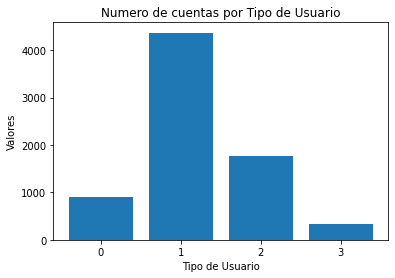

In [140]:
import matplotlib.pyplot as plt

# Obtener los valores y etiquetas del DataFrame
valores = dftotal_2_2.tipo_usuario.value_counts().values
etiquetas = dftotal_2_2.tipo_usuario.value_counts().index

# Crear el gráfico de barras
plt.bar(etiquetas, valores)

# Personalizar el gráfico
plt.xlabel('Tipo de Usuario')
plt.ylabel('Valores')
plt.title('Numero de cuentas por Tipo de Usuario')

# Establecer los valores en el eje x
plt.xticks([0, 1, 2, 3])

# Mostrar el gráfico
plt.show()


In [141]:
# 0 -> Fuentes de información (amplia base de seguidores y pocos seguidos)
dftotal_2_2[dftotal_2_2.tipo_usuario == 0][['followers', 'followings']]

,followers,followings
0,17771,4132
5,62655,6234
24,21151,614
26,21151,614
29,21151,614
...,...,...
7303,7279,803
7308,32235,1660
7327,8386,904
7331,32235,1660


In [142]:
# 1 -> Buscadores de datos (pocos seguidores, muchos seguidos)
dftotal_2_2[dftotal_2_2.tipo_usuario == 1][['followers', 'followings']]

,followers,followings
4,2750,4957
7,50,306
8,660,2226
9,2750,4957
10,792,1447
...,...,...
7361,24,98
7363,66,311
7364,1,51
7365,436,2063


In [143]:
# 2 -> Buscadores de relaciones (proporción similar de seguidores y seguidos)
dftotal_2_2[dftotal_2_2.tipo_usuario == 2][['followers', 'followings']]

,followers,followings
1,1430,1773
2,2236,2418
3,130,100
6,1268,1248
12,5300,1570
...,...,...
7351,498,492
7354,429,194
7359,5081,5449
7367,756,798


In [144]:
# 3 -> Otros (mas seguidores que seguidos, pero su numero de seguidores no supera los 5000 usuarios) 
dftotal_2_2[dftotal_2_2.tipo_usuario == 3][['followers', 'followings']]

,followers,followings
58,1603,254
99,1835,286
104,3995,155
132,3445,753
170,133,30
...,...,...
7315,99,3
7316,99,3
7322,132,15
7323,132,15


In [145]:
dftotal_2_2.shape

(7369, 104)

### 6.1.2 Insertar en BD DF preprocesado con los tipos de usuarios

In [146]:
# Definicion de parametros de carga
# collection_name = 't_fvf_indice_influencia_tipo_usuario'
collection_name = 't_fvf_indice_influencia_tipo_usuario_2'
insert_mongo (client, database, collection_name, dftotal_2_2)

Los datos fueron insertados correctamente en la coleccion t_fvf_indice_influencia_tipo_usuario_2, de la base de datos GNN.


In [147]:
dftotal_2_2.shape

(7369, 104)

## 6.2 Contenido: 
**Evaluar contenido del mensaje para incluir al modelo**

Antes de aplicar técnicas como Bag of Words o transformaciones, es recomendable realizar un preprocesamiento de los datos para limpiar y estructurar adecuadamente los mensajes. Aquí tienes los pasos que puedes seguir para este preprocesamiento:

Si deseas utilizar la variable "message", que contiene cadenas de texto, en tu modelo, necesitarás realizar una transformación para convertir las cadenas de texto en características numéricas que puedan ser utilizadas por el algoritmo de aprendizaje automático. Aquí hay algunas técnicas comunes para convertir variables de texto en características numéricas:

### 6.2.1 Bolsa de palabras (Bag of Words): 

Esta técnica implica representar cada texto como un vector que cuenta la frecuencia de aparición de cada palabra. Puedes utilizar la clase CountVectorizer de la librería Scikit-learn para realizar esta transformación.

In [148]:
dftotal_bow = dftotal_2_2.copy()
dftotal_bow.shape

(7369, 104)

In [149]:
from sklearn.feature_extraction.text import CountVectorizer

# Crear una instancia de CountVectorizer
vectorizer = CountVectorizer()

In [150]:
# Ajustar y transformar los datos de texto
message_encoded = vectorizer.fit_transform(dftotal_bow['message_clean'])

In [151]:
# Crear un DataFrame a partir de la matriz de características
message_df = pd.DataFrame(message_encoded.toarray(), columns=vectorizer.get_feature_names())

In [152]:
# Concatenar las características codificadas al DataFrame original
df_encoded = pd.concat([dftotal_bow, message_df], axis=1)
df_encoded.shape

(7369, 8848)

In [153]:
df_encoded.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name',
       ...
       'zona', 'zoom', 'zorionak', 'zubieta', 'zubimendi', 'zuen', 'zulia',
       'zuliano', 'zumba', 'zurdo'],
      dtype='object', length=8848)

In [154]:
message_df

,00,000001,01,0102,0105,02,0200,02043,0300,04,...,zona,zoom,zorionak,zubieta,zubimendi,zuen,zulia,zuliano,zumba,zurdo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7364,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7365,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


#### 6.2.1.1 Insertar en BD DF preprocesado con la tecnica de NLP: Bolsa de Palabras (Bag Of Words)

In [163]:
# Definicion de parametros de carga / insercion
# collection_name = 't_fvf_progephi_nlp_bag_of_words'
collection_name = 't_fvf_progephi_nlp_bag_of_words_3'
insert_mongo (client, database, collection_name, df_encoded)

Los datos fueron insertados correctamente en la coleccion t_fvf_progephi_nlp_bag_of_words_3, de la base de datos GNN.


### 6.2.3 TF-IDF 

TF-IDF (Term Frequency-Inverse Document Frequency) es una técnica similar a la Bolsa de palabras, pero también tiene en cuenta la importancia relativa de las palabras en el conjunto de datos. Puedes utilizar la clase TfidfVectorizer de Scikit-learn para realizar esta transformación.

In [164]:
dftotal_tf_idf = dftotal_2_2.copy()
dftotal_tf_idf.shape

(7369, 104)

In [165]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Crear una instancia de TfidfVectorizer
vectorizer_2 = TfidfVectorizer()

In [166]:
# Ajustar y transformar los datos de texto
message_encoded_2 = vectorizer_2.fit_transform(dftotal_tf_idf['message_clean'])

In [167]:
# Crear un DataFrame a partir de la matriz de características
message_df_2 = pd.DataFrame(message_encoded_2.toarray(), columns=vectorizer_2.get_feature_names())

In [168]:
# Concatenar las características codificadas al DataFrame original
df_encoded_2 = pd.concat([dftotal_tf_idf, message_df_2], axis=1)
df_encoded_2.shape

(7369, 8848)

In [169]:
df_encoded_2.columns

Index(['_id', 'created_at', 'id_post', 'id_str', 'message', 'source',
       'truncated', 'in_reply_to_status_id', 'in_reply_to_user_id',
       'in_reply_to_screen_name',
       ...
       'zona', 'zoom', 'zorionak', 'zubieta', 'zubimendi', 'zuen', 'zulia',
       'zuliano', 'zumba', 'zurdo'],
      dtype='object', length=8848)

In [170]:
message_df_2

,00,000001,01,0102,0105,02,0200,02043,0300,04,...,zona,zoom,zorionak,zubieta,zubimendi,zuen,zulia,zuliano,zumba,zurdo
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7365,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7366,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7367,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
# Obtener la matriz TF-IDF
tfidf_matrix = vectorizer_2.fit_transform(df_encoded_2['message_clean'])

In [172]:
# Obtener los nombres de las palabras (columnas)
feature_names = vectorizer_2.get_feature_names()

In [173]:
# Calcular las frecuencias promedio de las palabras
word_frequencies = tfidf_matrix.mean(axis=0).tolist()[0]

In [174]:
# Crear un diccionario de palabras y frecuencias
word_frequency_dict = dict(zip(feature_names, word_frequencies))

In [175]:
# Ordenar el diccionario por frecuencia descendente
sorted_word_frequency = sorted(word_frequency_dict.items(), key=lambda x: x[1], reverse=True)

In [176]:
# Obtener las palabras más frecuentes y sus frecuencias
top_words = sorted_word_frequency[:10]

In [177]:
# Imprimir las palabras más frecuentes
for word, frequency in top_words:
    print(word, frequency)

fvf 0.038067621730192826
pdte 0.022212588003538876
futbol 0.020602814167729355
vinotinto 0.018273513319467825
mas 0.015806560573274765
sub 0.015559881924793507
venezuela 0.014744421506946739
presidente 0.013653500275166743
conmebol 0.013077893089769862
pais 0.012897029921735456


#### 6.2.3.1 Insertar en BD DF preprocesado con la tecnica de NLP: TF-IDF

In [178]:
# Definicion de parametros de carga / insercion
# collection_name = 't_fvf_progephi_nlp_tf_idf'
collection_name = 't_fvf_progephi_nlp_tf_idf_3'
insert_mongo (client, database, collection_name, df_encoded_2)

Los datos fueron insertados correctamente en la coleccion t_fvf_progephi_nlp_tf_idf_3, de la base de datos GNN.


## 6.3 Grafo:

### 6.3.1 Indice de influencia:
   - La influencia del usuario seria una metrica que se calcula mediante la suma de la **Aceptacion + Relacion**
        - **Aceptacion** = *(Rts / Numero de Tweets)*
        - **Relacion** = *(Degree x pageRanks)*
    - Para ello primero desnormalizamos la columna pageranks, ya que por defecto su valor viene normalizado, es cedir multiplicamos x 100

In [179]:
# Verificamos valores faltantes antes de realizar los calculos
print(dftotal_2_2.count_user.isna().sum())
print(dftotal_2_2.retweet_count.isna().sum())
print(dftotal_2_2.Degree.isna().sum())
print(dftotal_2_2.pageranks.isna().sum())

0
0
0
0


In [180]:
dftotal_2_2[['retweet_count', 'count_user']][:1]

,retweet_count,count_user
0,12,64


In [181]:
# Escala al 100% (* 100)
dftotal_2_2[['pageranks_desnormalizado']] = dftotal_2_2[['pageranks']]*100
dftotal_2_2[['pageranks_desnormalizado']] 

,pageranks_desnormalizado
0,0.5057
1,0.0044
2,0.0044
3,0.0044
4,0.0049
...,...
7364,0.0044
7365,0.0044
7366,0.0044
7367,0.0044


In [182]:
# Aceptacion
(dftotal_2_2['retweet_count'] / dftotal_2_2['count_user'])

0       0.1875
1       0.0000
2       0.0000
3       0.0000
4       0.0000
         ...  
7364    0.0000
7365    0.0000
7366    0.0000
7367    0.0000
7368    0.0000
Length: 7369, dtype: float64

In [183]:
# Crear columna llamada aceptacion_50_pct, indicando que el valor resultante de (dftotal_2_2['retweet_count'] / dftotal_2_2['count_user']) se multiplico por 0.50 
dftotal_2_2['aceptacion_50_pct'] = (dftotal_2_2['retweet_count'] / dftotal_2_2['count_user']) * 0.5
dftotal_2_2['aceptacion_50_pct']

0       0.09375
1       0.00000
2       0.00000
3       0.00000
4       0.00000
         ...   
7364    0.00000
7365    0.00000
7366    0.00000
7367    0.00000
7368    0.00000
Name: aceptacion_50_pct, Length: 7369, dtype: float64

In [184]:
# Relacion
(dftotal_2_2['Degree'] * dftotal_2_2['pageranks_desnormalizado'])

0       52.5928
1        0.0044
2        0.0088
3        0.0088
4        0.0147
         ...   
7364     0.0088
7365     0.0176
7366     0.0088
7367     0.0088
7368     3.0294
Length: 7369, dtype: float64

In [185]:
# Crear columna llamada relacion_50_pct, indicando que el valor resultante de (dftotal_2_2['Degree'] * dftotal_2_2['pageranks_desnormalizado']) se multiplico por 0.50 
dftotal_2_2['relacion_50_pct'] = (dftotal_2_2['Degree'] * dftotal_2_2['pageranks_desnormalizado']) * 0.5
dftotal_2_2['relacion_50_pct']

0       26.29640
1        0.00220
2        0.00440
3        0.00440
4        0.00735
          ...   
7364     0.00440
7365     0.00880
7366     0.00440
7367     0.00440
7368     1.51470
Name: relacion_50_pct, Length: 7369, dtype: float64

In [186]:
# Como vemos hay varias filas cuyo calculo seria igual a 0, por lo que
dftotal_2_2[['username', 'count_user', 'retweet_count', 'Degree', 'pageranks_desnormalizado', 'aceptacion_50_pct', 'relacion_50_pct']][:10]

,username,count_user,retweet_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct
0,foro_todofutbol,64,12,104.0,0.5057,0.09375,26.29640
1,miguel28gangel,3,0,1.0,0.0044,0.00000,0.00220
2,RichardZapata8,3,0,2.0,0.0044,0.00000,0.00440
3,correajorge,6,0,2.0,0.0044,0.00000,0.00440
4,LeafarPetit,4,0,3.0,0.0049,0.00000,0.00735
5,LaDivinaDiva,4,0,15.0,0.1025,0.00000,0.76875
6,luistorres167,1,2,3.0,0.0372,1.00000,0.05580
7,Inferno_Milans,3,0,1.0,0.0044,0.00000,0.00220
8,malleakike,2,0,2.0,0.0044,0.00000,0.00440
9,LeafarPetit,4,0,3.0,0.0049,0.00000,0.00735


In [187]:
# Indice de Influencia: multiplicando el pageranks desnormalizado
((dftotal_2_2['retweet_count'] / dftotal_2_2['count_user']) * 0.50) + ((dftotal_2_2['Degree'] * dftotal_2_2['pageranks_desnormalizado']) * 0.50)

0       26.39015
1        0.00220
2        0.00440
3        0.00440
4        0.00735
          ...   
7364     0.00440
7365     0.00880
7366     0.00440
7367     0.00440
7368     1.51470
Length: 7369, dtype: float64

In [188]:
# Indice de Influencia: en funcion de la aceptacion +  la relacion
dftotal_2_2['aceptacion_50_pct'] + dftotal_2_2['relacion_50_pct']

0       26.39015
1        0.00220
2        0.00440
3        0.00440
4        0.00735
          ...   
7364     0.00440
7365     0.00880
7366     0.00440
7367     0.00440
7368     1.51470
Length: 7369, dtype: float64

In [189]:
# dftotal_2_2['indice_influencia'] = ((dftotal_2_2['retweet_count'] / dftotal_2_2['count_user']) * 0.50) + ((dftotal_2_2['Degree'] * dftotal_2_2['pageranks_desnormalizado']) * 0.50)
dftotal_2_2['indice_influencia'] = dftotal_2_2['aceptacion_50_pct'] + dftotal_2_2['relacion_50_pct']
dftotal_2_2.shape

(7369, 108)

In [190]:
# Verificamos si hay algun valor nulo o extraviado
dftotal_2_2['indice_influencia'].isna().sum()

0

In [191]:
# Como vemos hay varias filas cuyo calculo seria igual a 0, por lo que
dftotal_2_2[['username', 'count_user', 'retweet_count', 'Degree', 'pageranks_desnormalizado', 'aceptacion_50_pct', 'relacion_50_pct', 'indice_influencia']][:10]

,username,count_user,retweet_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct,indice_influencia
0,foro_todofutbol,64,12,104.0,0.5057,0.09375,26.29640,26.39015
1,miguel28gangel,3,0,1.0,0.0044,0.00000,0.00220,0.00220
2,RichardZapata8,3,0,2.0,0.0044,0.00000,0.00440,0.00440
3,correajorge,6,0,2.0,0.0044,0.00000,0.00440,0.00440
4,LeafarPetit,4,0,3.0,0.0049,0.00000,0.00735,0.00735
5,LaDivinaDiva,4,0,15.0,0.1025,0.00000,0.76875,0.76875
6,luistorres167,1,2,3.0,0.0372,1.00000,0.05580,1.05580
7,Inferno_Milans,3,0,1.0,0.0044,0.00000,0.00220,0.00220
8,malleakike,2,0,2.0,0.0044,0.00000,0.00440,0.00440
9,LeafarPetit,4,0,3.0,0.0049,0.00000,0.00735,0.00735


- **Nota: Como se puede apreciar  un usuario puede tener gran aceptacion, es decir gran cantidad de RTs en funcion del numero de publicaciones generadas en el periodo de estudio y de acuerdo a la busqueda, pero al no ser contante en sus publicaciones, no mantiene a su audiencia alimentada de datos / informacion.** 

In [192]:
dftotal_2_2['indice_influencia'].min()

0.0

In [193]:
dftotal_2_2['indice_influencia'].max()

1603.8522127659576

In [194]:
dftotal_2_2['indice_influencia'].mode()

0    0.0044
Name: indice_influencia, dtype: float64

In [195]:
dftotal_2_2['indice_influencia'].mean()

17.509466536654532

In [198]:
dftotal_2_2[['username', 'count_user', 'retweet_count', 'Degree', 'pageranks_desnormalizado', 'aceptacion_50_pct', 'relacion_50_pct', 'indice_influencia']].sort_values(['indice_influencia'], ascending=False)[:20]

,username,count_user,retweet_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct,indice_influencia
5403,klon_perez,47,627,961.0,3.324,6.670213,1597.182,1603.852213
5134,klon_perez,47,92,961.0,3.324,0.978723,1597.182,1598.160723
6948,klon_perez,47,73,961.0,3.324,0.776596,1597.182,1597.958596
1084,klon_perez,47,73,961.0,3.324,0.776596,1597.182,1597.958596
48,klon_perez,47,69,961.0,3.324,0.734043,1597.182,1597.916043
4711,klon_perez,47,56,961.0,3.324,0.595745,1597.182,1597.777745
4932,klon_perez,47,35,961.0,3.324,0.372340,1597.182,1597.554340
663,klon_perez,47,35,961.0,3.324,0.372340,1597.182,1597.554340
523,klon_perez,47,27,961.0,3.324,0.287234,1597.182,1597.469234
5525,klon_perez,47,19,961.0,3.324,0.202128,1597.182,1597.384128


In [197]:
dftotal_2_2[['username', 'count_user', 'retweet_count', 'likes_count', 'Degree', 'pageranks_desnormalizado','aceptacion_50_pct', 'relacion_50_pct', 'indice_influencia']].sort_values(['indice_influencia'], ascending=False)

,username,count_user,retweet_count,likes_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct,indice_influencia
5403,klon_perez,47,627,1133,961.0,3.3240,6.670213,1597.182,1603.852213
5134,klon_perez,47,92,219,961.0,3.3240,0.978723,1597.182,1598.160723
6948,klon_perez,47,73,176,961.0,3.3240,0.776596,1597.182,1597.958596
1084,klon_perez,47,73,810,961.0,3.3240,0.776596,1597.182,1597.958596
48,klon_perez,47,69,397,961.0,3.3240,0.734043,1597.182,1597.916043
...,...,...,...,...,...,...,...,...,...
1444,cdberriz,2,0,8,0.0,0.0044,0.000000,0.000,0.000000
6731,San_Sanchez_28,2,0,0,0.0,0.0044,0.000000,0.000,0.000000
933,_MVPSports,1,0,2,0.0,0.0044,0.000000,0.000,0.000000
3270,ESPNPeru,1,0,1,0.0,0.0044,0.000000,0.000,0.000000


In [199]:
dftotal_2_2[['indice_influencia']].max()

indice_influencia    1603.852213
dtype: float64

In [200]:
dftotal_2_2[['indice_influencia']].min()

indice_influencia    0.0
dtype: float64

In [201]:
dftotal_2_2[['indice_influencia']].mean()

indice_influencia    17.509467
dtype: float64

In [202]:
dftotal_2_2[['indice_influencia']].mode()

,indice_influencia
0,0.0044


In [204]:
dftotal_2_2[['username', 'tipo_usuario','count_user', 'retweet_count', 'Degree', 'pageranks_desnormalizado','aceptacion_50_pct', 'relacion_50_pct','indice_influencia']].sort_values(['indice_influencia'], ascending=False)[:50]

,username,tipo_usuario,count_user,retweet_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct,indice_influencia
5403,klon_perez,0,47,627,961.0,3.3240,6.670213,1597.18200,1603.852213
5134,klon_perez,0,47,92,961.0,3.3240,0.978723,1597.18200,1598.160723
6948,klon_perez,0,47,73,961.0,3.3240,0.776596,1597.18200,1597.958596
1084,klon_perez,0,47,73,961.0,3.3240,0.776596,1597.18200,1597.958596
48,klon_perez,0,47,69,961.0,3.3240,0.734043,1597.18200,1597.916043
4711,klon_perez,0,47,56,961.0,3.3240,0.595745,1597.18200,1597.777745
4932,klon_perez,0,47,35,961.0,3.3240,0.372340,1597.18200,1597.554340
663,klon_perez,0,47,35,961.0,3.3240,0.372340,1597.18200,1597.554340
523,klon_perez,0,47,27,961.0,3.3240,0.287234,1597.18200,1597.469234
5525,klon_perez,0,47,19,961.0,3.3240,0.202128,1597.18200,1597.384128


In [205]:
# Definir las etiquetas de las clases correspondientes a las condiciones
# 0 -> Fuentes de información (amplia base de seguidores y pocos seguidos)
# 1 -> Buscadores de datos (pocos seguidores, muchos seguidos)
# 2 -> Buscadores de relaciones (proporción similar de seguidores y seguidos)
# 3 -> Otros (mas seguidores que seguidos, pero su numero de seguidores no supera los 5000 usuarios) 
# etiquetas = [0, 1, 2]
dftotal_2_2[['username','followers', 'followings', 'tipo_usuario','count_user', 'retweet_count', 'Degree', 'pageranks_desnormalizado','aceptacion_50_pct', 'relacion_50_pct','indice_influencia']].sort_values(['indice_influencia'], ascending=False)[:50]

,username,followers,followings,tipo_usuario,count_user,retweet_count,Degree,pageranks_desnormalizado,aceptacion_50_pct,relacion_50_pct,indice_influencia
5403,klon_perez,21105,614,0,47,627,961.0,3.3240,6.670213,1597.18200,1603.852213
5134,klon_perez,21105,614,0,47,92,961.0,3.3240,0.978723,1597.18200,1598.160723
6948,klon_perez,21105,614,0,47,73,961.0,3.3240,0.776596,1597.18200,1597.958596
1084,klon_perez,21151,614,0,47,73,961.0,3.3240,0.776596,1597.18200,1597.958596
48,klon_perez,21151,614,0,47,69,961.0,3.3240,0.734043,1597.18200,1597.916043
4711,klon_perez,21105,614,0,47,56,961.0,3.3240,0.595745,1597.18200,1597.777745
4932,klon_perez,21105,614,0,47,35,961.0,3.3240,0.372340,1597.18200,1597.554340
663,klon_perez,21151,614,0,47,35,961.0,3.3240,0.372340,1597.18200,1597.554340
523,klon_perez,21151,614,0,47,27,961.0,3.3240,0.287234,1597.18200,1597.469234
5525,klon_perez,21105,614,0,47,19,961.0,3.3240,0.202128,1597.18200,1597.384128


#### 6.3.1.1 Insertar en BD DF preprocesado con los valores de los indices de influencia

In [206]:
# Definicion de parametros de carga
# collection_name = 't_fvf_indice_influencia_v1'
collection_name = 't_fvf_indice_influencia_v3'
insert_mongo (client, database, collection_name, dftotal_2_2)

Los datos fueron insertados correctamente en la coleccion t_fvf_indice_influencia_v3, de la base de datos GNN.


In [207]:
dftotal_2_2[['Degree','pageranks_desnormalizado']].sort_values(['pageranks_desnormalizado'], ascending=False)

,Degree,pageranks_desnormalizado
238,961.0,3.3240
3360,961.0,3.3240
5403,961.0,3.3240
6048,961.0,3.3240
6047,961.0,3.3240
...,...,...
3384,0.0,0.0044
3381,5.0,0.0044
368,2.0,0.0044
3379,11.0,0.0044


---
---

# **7. Datos a utilizar para entrenar modelos**

- **Nombres de colecciones a evaluar en el modelo:**
   1. **Usuario:**
       - **'t_fvf_indice_influencia_tipo_usuario'.(Antes)** 
       - **'t_fvf_indice_influencia_tipo_usuario_2'. (Ahora)**
   2. **Contenido:**
       - **'t_fvf_progephi_nlp_bag_of_words' (Bag of Words). (Antes)**
       - **'t_fvf_progephi_nlp_bag_of_words_3' (Bag of Words). (Ahora)**
       - **'t_fvf_progephi_nlp_tf_idf' (TF-IDF). (Antes)**
       - **'t_fvf_progephi_nlp_tf_idf_3' (TF-IDF). (Ahora)**
   3. **Grafo (red):**
       - **'t_fvf_indice_influencia_v1' (Indice de Influencia). (Antes)**
       - **'t_fvf_indice_influencia_v3' (Indice de Influencia). (Ahora)**
       
**La data del tipo_usuario esta incluida en la data del grafo, es decir que puedo evaluar el modelo en funcion de: Data Grafo (Usuario + Grafo). Sin embargo la data del contenido habia resultado en un valor de RMSE mas alto (peor), por lo que si se quiere habria que aplicar las tecnicas Bag of Words / TF-IDF a la data del grafo ('t_fvf_indice_influencia_v3') para realizar los modelos. Vale destacar que al aplicar estas tecnicas el mejor resultado fue con la data luego de aplicar la tecnica de Bag of Words, no obstante el mejor modelo se ha obtenido obviando el mensaje.**

---
--- 

## **7.1 Recomendaciones futuras de investigacion**
  - **1. En relacion al usuario:**
    - De igual forma se puede analizar el crecimiento de seguidores (en funcion de medir el impacto de un tweet), a partir de una publicacion calculando el numero de seguidores, antes, durante y despues de haber generado un tweet influyente (viral).
    - Filtrar usuarios tipo Bots, ya que se ha evidenciado el uso de estos para posicionar etiquetas o incrementar la popularidad o influencia de una cuenta en funcion de realizar acciones tipo RTs para magnificar una cuenta o contenido de forma arbitraria (campañas pagadas)
    - Encontrar una forma de darle peso al calculo de la aceptacion y por ende de la influencia en funcion del tipo de usuario, siendo este valor una constante que pueda magnificar o disminuir la influencia.
  - **2.  En relacion al contenido:**
    - Se pueden profundizar o seguir lineas de investigacion futuras, tomando en cuenta el sentimiento para darle un peso a los comentarios positivos / negativos / neutrales dentro de la data estudiada.
    - Analizar la posible influencia del contenido del mensaje distinto de las palabras, es decir: etiquetas (hashtags), emojis, enlaces (links), menciones (@) entre otros. 
  - **3. En relacion a la red (grafo):**
    - Se pueden agregar medisdas que permitan profundizar en el estudio de la red o grafo.
    - Analizar las comunidades, y en funcion de las audiencias establecer pesos, o incrementar el valor de la influencia de un usuario en funcion de esta.
    - Realizar el analisis de las medidas de centralidad usando NetworkX siempre y cuando los grafos sean pequeños, de lo contrario se sugiere usar herramientas como GEPHI las cuales son mas eficientes para redes mas grandes sin embargo tambien tienen limitaciones por lo que se sugiere ahondar en nuevas formas de evaluar los grafos aprovechando los recursos computacionales, como el uso de GPUs, otro tipo de GNNs, comútacion en paralelo, herramientas de Big Data para el procesamiento de datos, entre otros.